In [10]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
from torch_geometric.nn import GATConv, global_mean_pool
import glob
import numpy as np
import matplotlib.pyplot as plt
import os
from torch.optim.lr_scheduler import ReduceLROnPlateau

# Define GAT model for batched data
class GAT(torch.nn.Module):
    def __init__(self, in_channels, out_channels, dropout_p=0.1):
        super().__init__()
        self.gat = GATConv(in_channels, out_channels, heads=1, concat=True, edge_dim=1)
        self.pool = global_mean_pool  # Can also use global_max_pool or global_add_pool
        self.dropout = nn.Dropout(p=dropout_p)
        self.norm = nn.BatchNorm1d(out_channels)
        self.linear = torch.nn.Linear(out_channels, 1)

    def forward(self, x, edge_index, edge_attr, batch):
        out, attn_weights = self.gat(x, edge_index, edge_attr, return_attention_weights=True)
        out = self.dropout(out)
        out = self.pool(out, batch)  # Pool over nodes in each graph
        out = self.norm(out)
        out = self.dropout(out) 
        out = self.linear(out)
        return out, attn_weights

def organize_graph_and_add_weight(file_path, label):
    data = np.load(file_path, allow_pickle=True).item()
    inverse_distance = data['inverse_distance']
    encoded_matrix = data['encoded_matrix']

    x = torch.tensor(encoded_matrix, dtype=torch.float32)
    adj = torch.tensor(inverse_distance, dtype=torch.float32)

    # Normalize adjacency (row-normalize)
    adj = adj / (adj.sum(dim=1, keepdim=True) + 1e-8)

    # Create edge_index and edge weights
    edge_index = (adj > 0).nonzero(as_tuple=False).t()
    edge_weight = adj[adj > 0]

    y = torch.tensor([label], dtype=torch.float32)
    
    return Data(x=x, edge_index=edge_index, edge_attr=edge_weight, y=y)

In [11]:
def train_model(model, dataloader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    total = 0
    correct = 0

    for batch in dataloader:
        batch = batch.to(device)

        optimizer.zero_grad()
        outputs, _ = model(batch.x, batch.edge_index, batch.edge_attr, batch.batch)
        outputs = outputs.view(-1)  # shape: [batch_size]
        loss = criterion(outputs, batch.y.view(-1))
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        running_loss += loss.item() * batch.num_graphs
        probs = torch.sigmoid(outputs)
        preds = probs >= 0.5
        correct += (preds == batch.y.view(-1).bool()).sum().item()
        total += batch.num_graphs

    epoch_loss = running_loss / total
    accuracy = correct / total
    return epoch_loss, accuracy


def validate_model(model, dataloader, criterion, device):
    model.eval()
    running_loss = 0.0
    total = 0
    correct = 0

    with torch.no_grad():
        for batch in dataloader:
            batch = batch.to(device)
            outputs, _ = model(batch.x, batch.edge_index, batch.edge_attr, batch.batch)
            outputs = outputs.view(-1)
            loss = criterion(outputs, batch.y.view(-1))
            running_loss += loss.item() * batch.num_graphs
            probs = torch.sigmoid(outputs)
            preds = probs >= 0.5
            correct += (preds == batch.y.view(-1).bool()).sum().item()
            total += batch.num_graphs

    validation_loss = running_loss / total
    accuracy = correct / total
    return validation_loss, accuracy, _


In [12]:
# Create a dictionary with file names as keys and label + tensor grid as values
positive_grids = glob.glob('../../../Data/SplitData/Cholesterol/cholesterol-separate-graphs-5A_exp5/PositiveWithoutSpies/*.npy')
validation_grids = glob.glob('../../../Data/SplitData/Cholesterol/cholesterol-separate-graphs-5A_exp5/Validation_Set/*.npy')

positive_graphs = []
validation_graphs = []

for file in positive_grids:
    positive_graphs.append(organize_graph_and_add_weight(file, 1))

positive_validation_count = 0
unlabeled_validation_count = 0

for file in validation_grids:
    # Label as negative if "-f1" to "-f5" is in the filename
    if any(f"-f{i}" in file for i in range(1, 6)):
        label = 0
        unlabeled_validation_count += 1
        validation_graphs.append(organize_graph_and_add_weight(file, label))
    else:
        label = 1
        positive_validation_count += 1
        validation_graphs.append(organize_graph_and_add_weight(file, label))

print("In validation directory there are", positive_validation_count, "positives and", unlabeled_validation_count, "fragments")

k = 50
bins = []
for i in range(1, k + 1):
    bin = positive_graphs.copy()
    subset_grid = glob.glob(f'../../../Data/SplitData/Cholesterol/cholesterol-separate-graphs-5A_exp5/k_subsets/subset_{i}/*.npy')  # Adjust path as needed
    for file in subset_grid:
        bin.append(organize_graph_and_add_weight(file, 0))
    
    bins.append(bin)

for i, bin in enumerate(bins):
    pos = sum(1 for g in bin if g.y.item() == 1)
    neg = sum(1 for g in bin if g.y.item() == 0)
    print(f"Bin {i+1}: Positives = {pos}, Negatives = {neg}")


In validation directory there are 77 positives and 277 fragments
Bin 1: Positives = 385, Negatives = 385
Bin 2: Positives = 385, Negatives = 385
Bin 3: Positives = 385, Negatives = 385
Bin 4: Positives = 385, Negatives = 385
Bin 5: Positives = 385, Negatives = 385
Bin 6: Positives = 385, Negatives = 385
Bin 7: Positives = 385, Negatives = 385
Bin 8: Positives = 385, Negatives = 385
Bin 9: Positives = 385, Negatives = 385
Bin 10: Positives = 385, Negatives = 385
Bin 11: Positives = 385, Negatives = 385
Bin 12: Positives = 385, Negatives = 385
Bin 13: Positives = 385, Negatives = 385
Bin 14: Positives = 385, Negatives = 385
Bin 15: Positives = 385, Negatives = 385
Bin 16: Positives = 385, Negatives = 385
Bin 17: Positives = 385, Negatives = 385
Bin 18: Positives = 385, Negatives = 385
Bin 19: Positives = 385, Negatives = 385
Bin 20: Positives = 385, Negatives = 385
Bin 21: Positives = 385, Negatives = 385
Bin 22: Positives = 385, Negatives = 385
Bin 23: Positives = 385, Negatives = 385
B

In [13]:
def plot_graphs(train_losses, validation_losses, validation_accuracies, learning_rates):
    # Plot Training Loss vs Validation Loss
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, len(train_losses) + 1), train_losses, label='Training Loss')
    plt.plot(range(1, len(validation_losses) + 1), validation_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training Loss vs Validation Loss')
    plt.legend()
    plt.grid()
    plt.show()

    # Plot Validation Accuracy
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, len(validation_accuracies) + 1), validation_accuracies, label='Validation Accuracy', color='green')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Validation Accuracy over Epochs')
    plt.legend()
    plt.grid()
    plt.show()

    # Plot Learning Rate
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, len(learning_rates) + 1), learning_rates, label='Learning Rates', color='green')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Validation Accuracy over Epochs')
    plt.legend()
    plt.grid()
    plt.show()

In [14]:
import torch
import torch.nn.functional as F

def weighted_positive_loss(y_pred, y_true, lambda_weight=0.01):
    # BCE Loss
    bce_loss = F.binary_cross_entropy(y_pred, y_true)

    # Additional Weighted Positive Term
    positive_mask = (y_true == 1.0).float()
    P = positive_mask.sum()

    if P > 0:
        wp_term = torch.sqrt(
            torch.mean((torch.log(y_pred[positive_mask.bool()] + 1) - torch.log(y_true[positive_mask.bool()] + 1)) ** 2)
        )
    else:
        wp_term = torch.tensor(0.0, device=y_pred.device)

    total_loss = bce_loss + lambda_weight * wp_term
    return total_loss


Training on bin 8/50
Bin 8, Epoch 1/2000, Train Loss: 0.6886, Validation Loss: 0.6960,  ValAccuracy: 0.3390, LR: 0.000250
Bin 8, Epoch 501/2000, Train Loss: 0.3940, Validation Loss: 0.3627,  ValAccuracy: 0.8701, LR: 0.000215
Bin 8, Epoch 1001/2000, Train Loss: 0.3768, Validation Loss: 0.3853,  ValAccuracy: 0.8701, LR: 0.000130
Bin 8, Epoch 1501/2000, Train Loss: 0.3743, Validation Loss: 0.4101,  ValAccuracy: 0.8475, LR: 0.000045


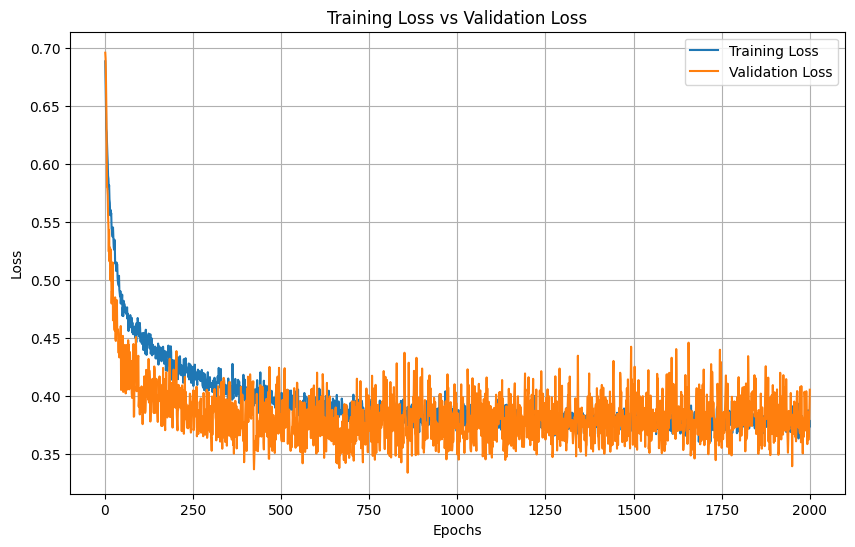

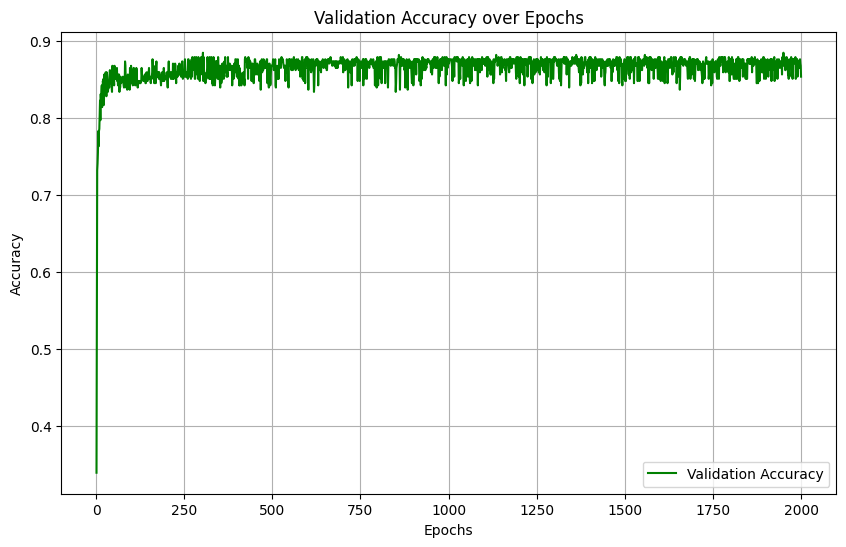

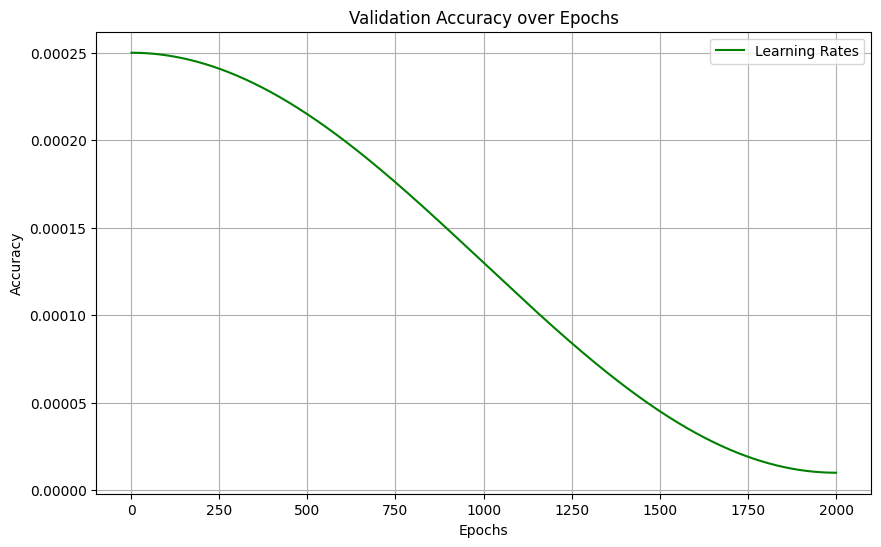

Model for bin 8 saved to GATModels-5A_exp5ME/Models/model_bin_8.pth
Attention weights for bin 8 saved to GATModels-5A_exp5ME/Weights/attn_bin_8.pt
Training on bin 9/50
Bin 9, Epoch 1/2000, Train Loss: 0.8444, Validation Loss: 0.6929,  ValAccuracy: 0.5565, LR: 0.000250
Bin 9, Epoch 501/2000, Train Loss: 0.3741, Validation Loss: 0.3063,  ValAccuracy: 0.8898, LR: 0.000215
Bin 9, Epoch 1001/2000, Train Loss: 0.3524, Validation Loss: 0.2990,  ValAccuracy: 0.8842, LR: 0.000130
Bin 9, Epoch 1501/2000, Train Loss: 0.3322, Validation Loss: 0.3014,  ValAccuracy: 0.8870, LR: 0.000045


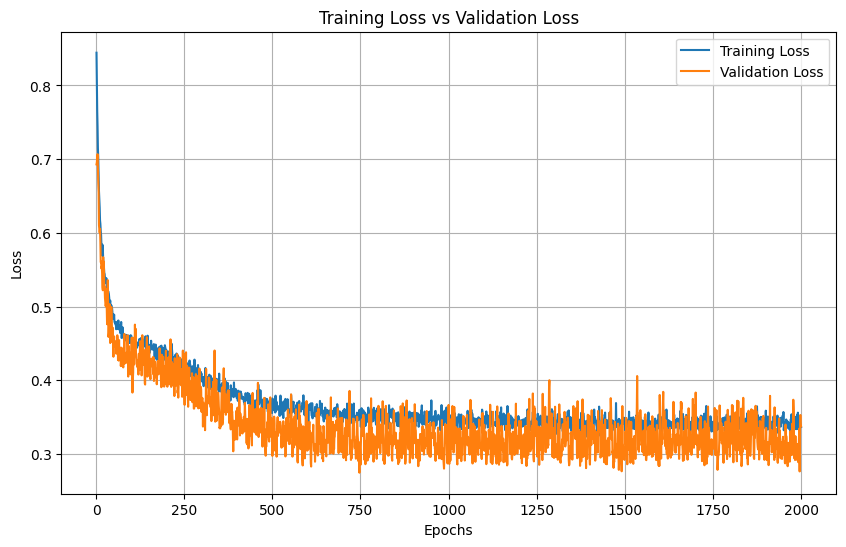

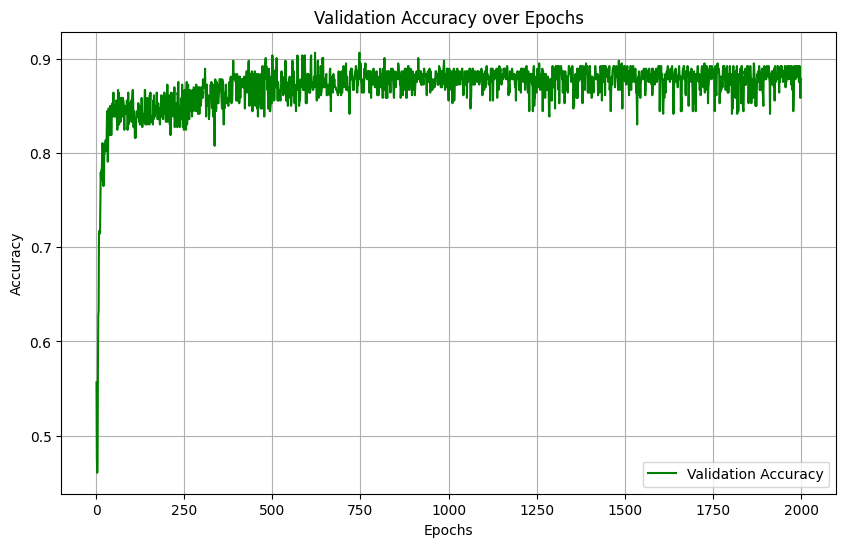

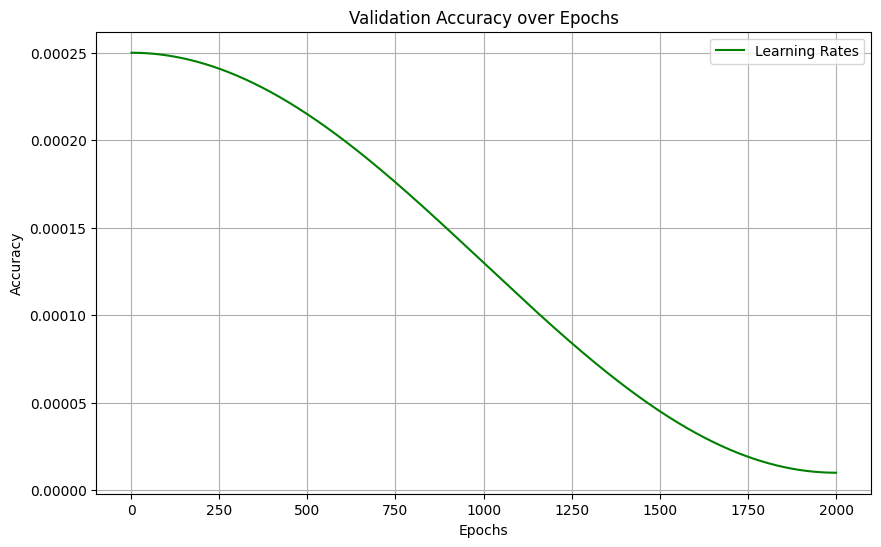

Model for bin 9 saved to GATModels-5A_exp5ME/Models/model_bin_9.pth
Attention weights for bin 9 saved to GATModels-5A_exp5ME/Weights/attn_bin_9.pt
Training on bin 10/50
Bin 10, Epoch 1/2000, Train Loss: 0.8286, Validation Loss: 0.7222,  ValAccuracy: 0.2090, LR: 0.000250
Bin 10, Epoch 501/2000, Train Loss: 0.3533, Validation Loss: 0.3615,  ValAccuracy: 0.8701, LR: 0.000215
Bin 10, Epoch 1001/2000, Train Loss: 0.3412, Validation Loss: 0.3066,  ValAccuracy: 0.8870, LR: 0.000130
Bin 10, Epoch 1501/2000, Train Loss: 0.3556, Validation Loss: 0.2635,  ValAccuracy: 0.9124, LR: 0.000045


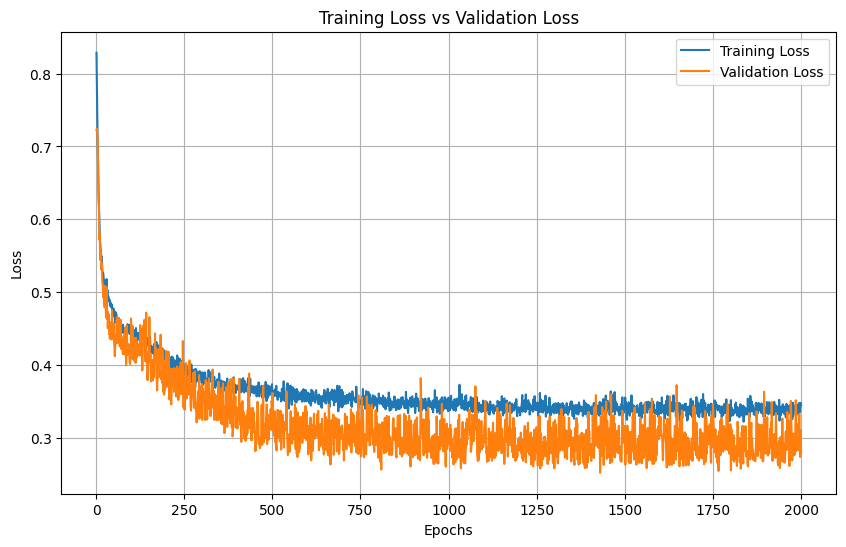

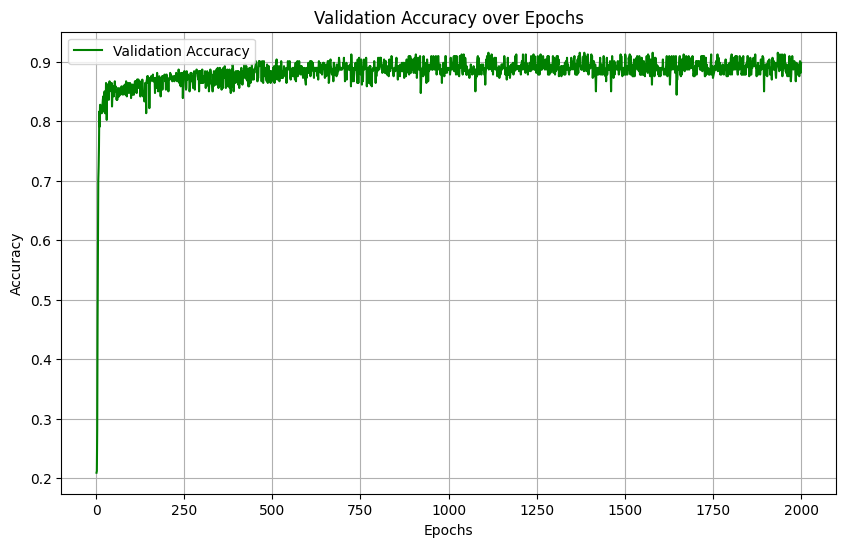

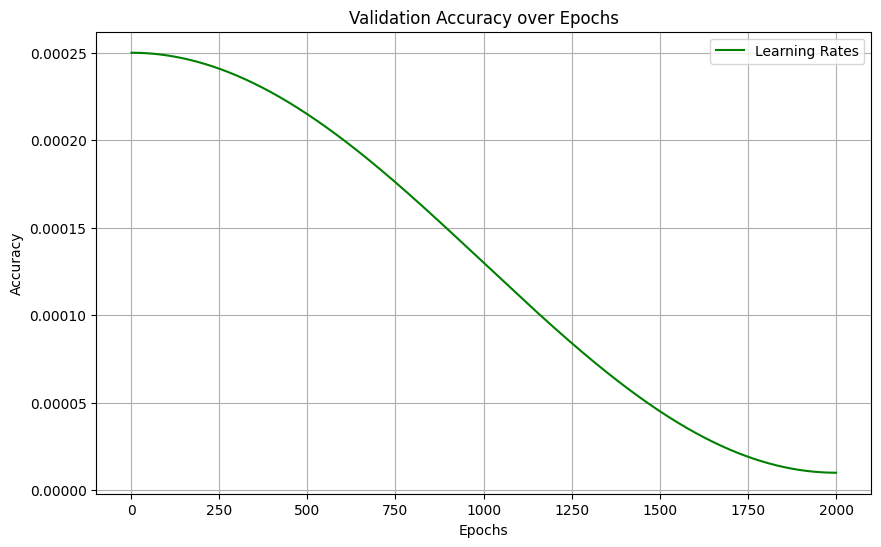

Model for bin 10 saved to GATModels-5A_exp5ME/Models/model_bin_10.pth
Attention weights for bin 10 saved to GATModels-5A_exp5ME/Weights/attn_bin_10.pt
Training on bin 11/50
Bin 11, Epoch 1/2000, Train Loss: 0.8641, Validation Loss: 0.7598,  ValAccuracy: 0.2203, LR: 0.000250
Bin 11, Epoch 501/2000, Train Loss: 0.3974, Validation Loss: 0.3909,  ValAccuracy: 0.8672, LR: 0.000215
Bin 11, Epoch 1001/2000, Train Loss: 0.3820, Validation Loss: 0.3748,  ValAccuracy: 0.8814, LR: 0.000130
Bin 11, Epoch 1501/2000, Train Loss: 0.3912, Validation Loss: 0.3741,  ValAccuracy: 0.8870, LR: 0.000045


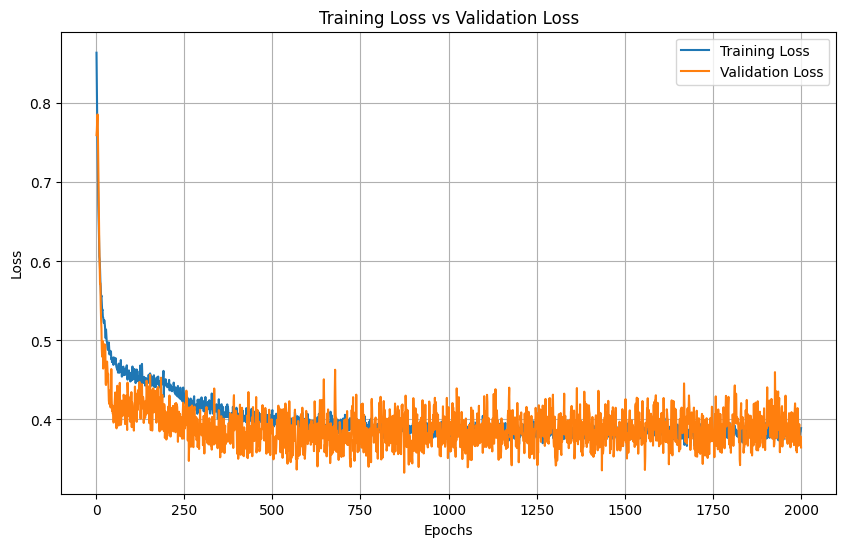

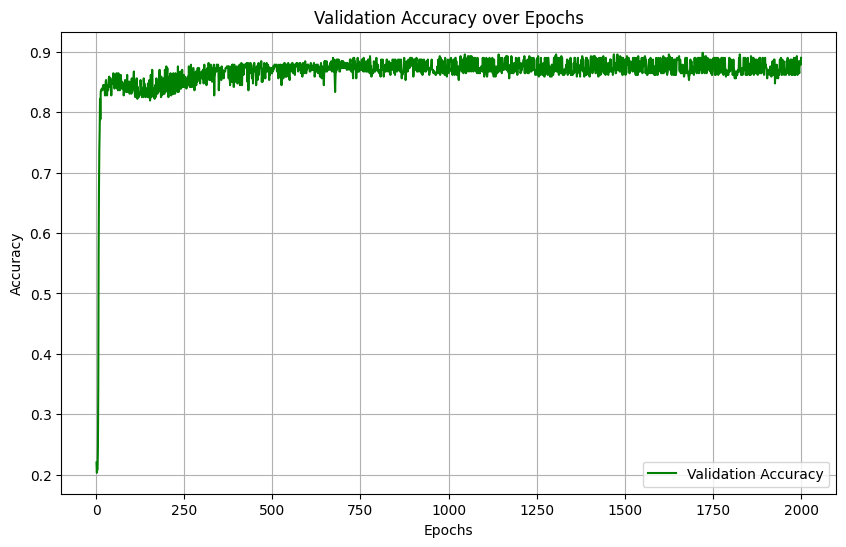

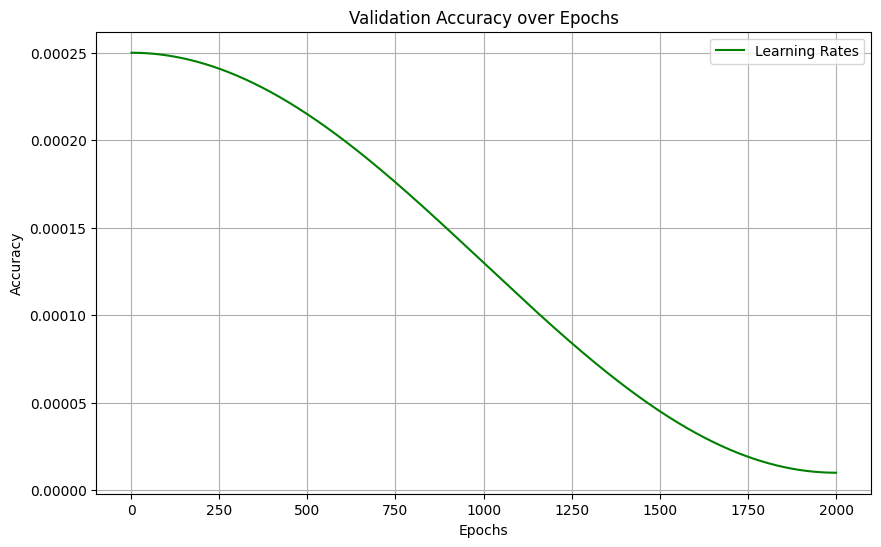

Model for bin 11 saved to GATModels-5A_exp5ME/Models/model_bin_11.pth
Attention weights for bin 11 saved to GATModels-5A_exp5ME/Weights/attn_bin_11.pt
Training on bin 12/50
Bin 12, Epoch 1/2000, Train Loss: 0.7046, Validation Loss: 0.6917,  ValAccuracy: 0.5932, LR: 0.000250
Bin 12, Epoch 501/2000, Train Loss: 0.3916, Validation Loss: 0.3527,  ValAccuracy: 0.8475, LR: 0.000215
Bin 12, Epoch 1001/2000, Train Loss: 0.3637, Validation Loss: 0.3052,  ValAccuracy: 0.8842, LR: 0.000130
Bin 12, Epoch 1501/2000, Train Loss: 0.3617, Validation Loss: 0.3451,  ValAccuracy: 0.8559, LR: 0.000045


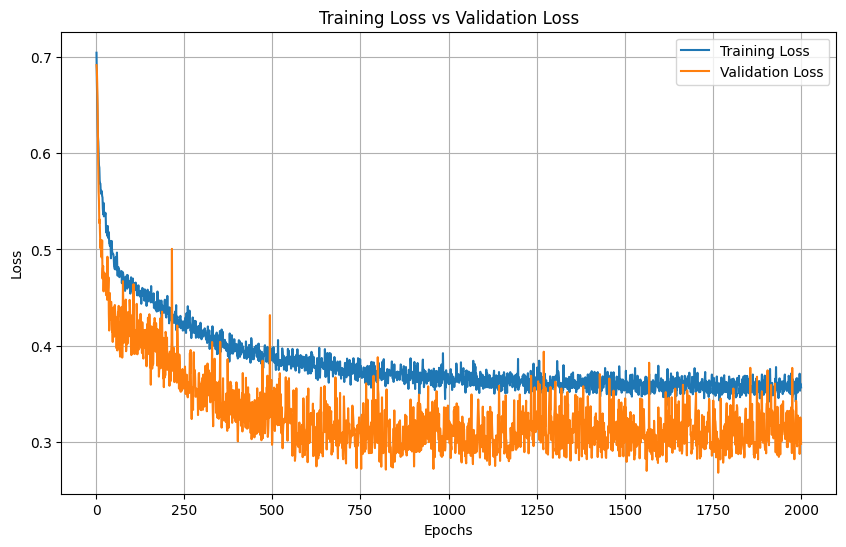

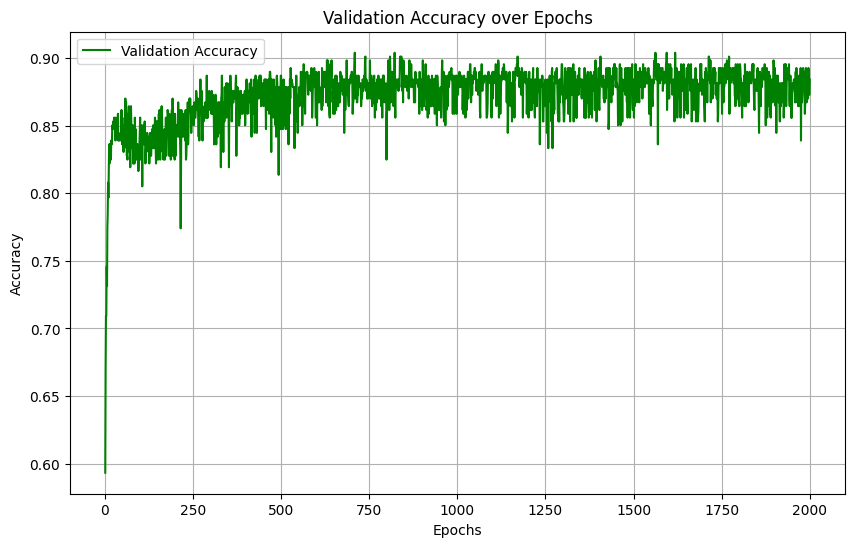

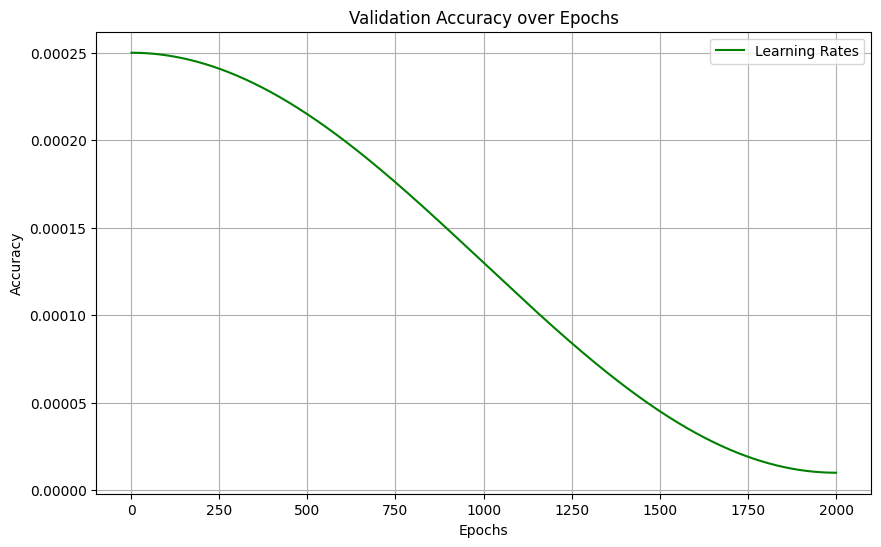

Model for bin 12 saved to GATModels-5A_exp5ME/Models/model_bin_12.pth
Attention weights for bin 12 saved to GATModels-5A_exp5ME/Weights/attn_bin_12.pt
Training on bin 13/50
Bin 13, Epoch 1/2000, Train Loss: 0.7868, Validation Loss: 0.7021,  ValAccuracy: 0.2627, LR: 0.000250
Bin 13, Epoch 501/2000, Train Loss: 0.4501, Validation Loss: 0.3835,  ValAccuracy: 0.8814, LR: 0.000215
Bin 13, Epoch 1001/2000, Train Loss: 0.4415, Validation Loss: 0.3807,  ValAccuracy: 0.8785, LR: 0.000130
Bin 13, Epoch 1501/2000, Train Loss: 0.4496, Validation Loss: 0.4098,  ValAccuracy: 0.8701, LR: 0.000045


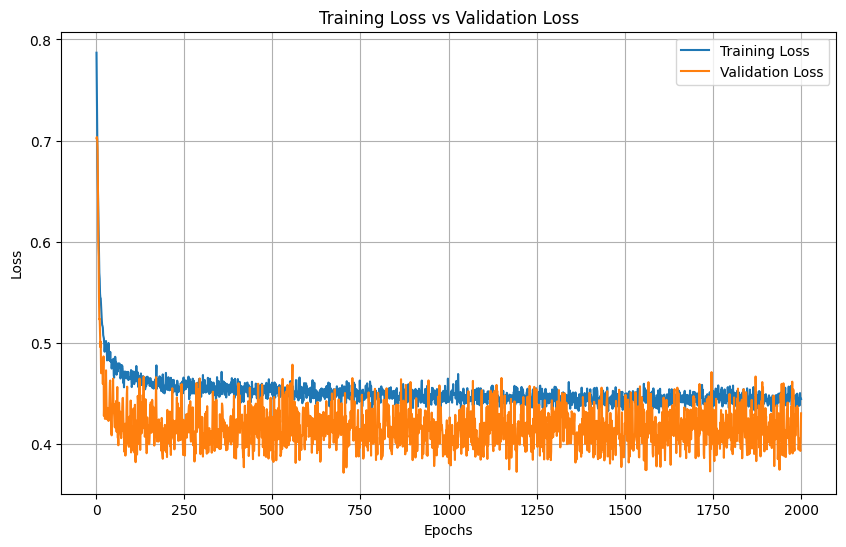

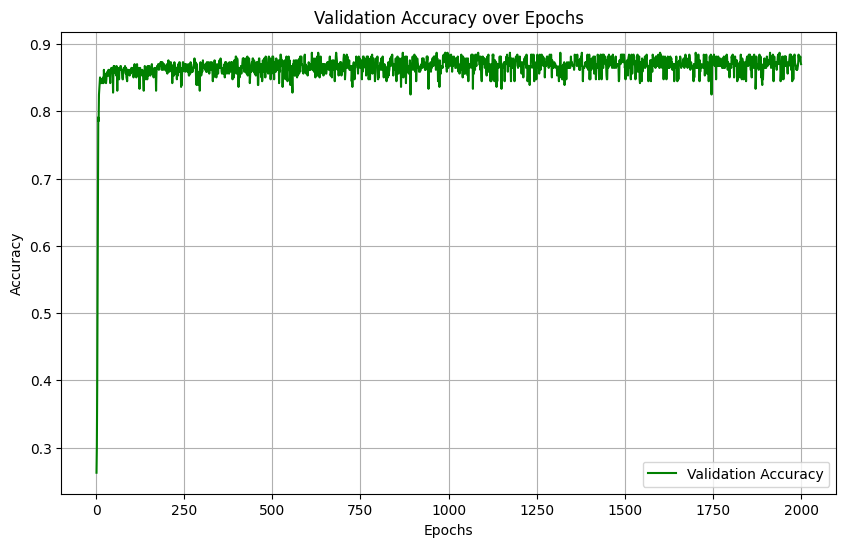

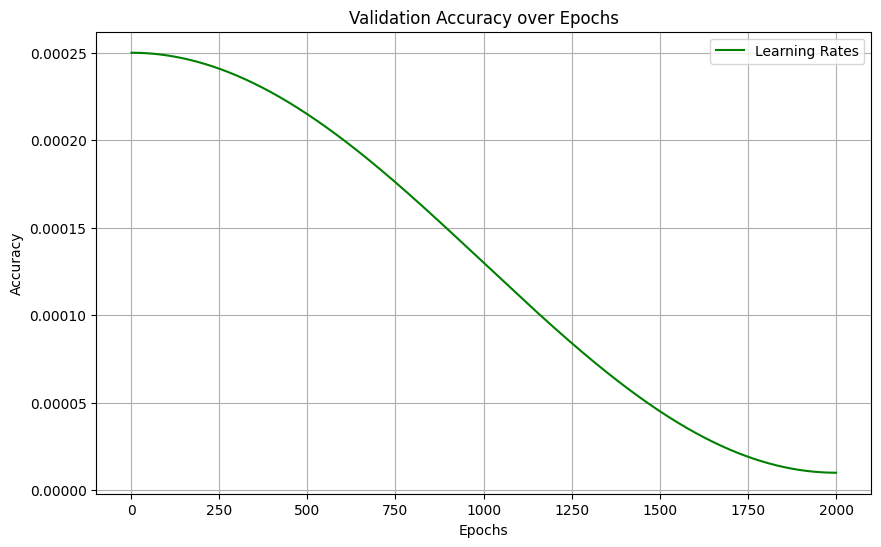

Model for bin 13 saved to GATModels-5A_exp5ME/Models/model_bin_13.pth
Attention weights for bin 13 saved to GATModels-5A_exp5ME/Weights/attn_bin_13.pt
Training on bin 14/50
Bin 14, Epoch 1/2000, Train Loss: 0.7334, Validation Loss: 0.7077,  ValAccuracy: 0.2345, LR: 0.000250
Bin 14, Epoch 501/2000, Train Loss: 0.3842, Validation Loss: 0.4405,  ValAccuracy: 0.8588, LR: 0.000215
Bin 14, Epoch 1001/2000, Train Loss: 0.3621, Validation Loss: 0.4647,  ValAccuracy: 0.8672, LR: 0.000130
Bin 14, Epoch 1501/2000, Train Loss: 0.3654, Validation Loss: 0.4563,  ValAccuracy: 0.8672, LR: 0.000045


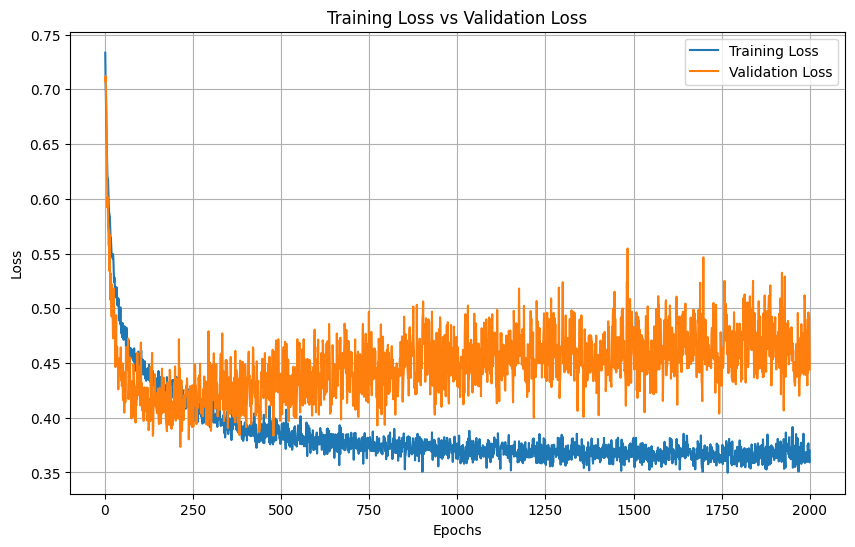

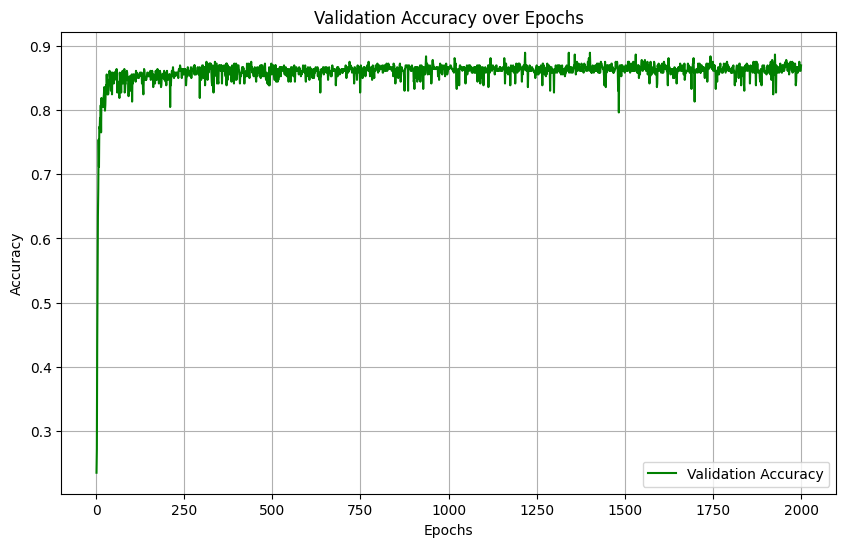

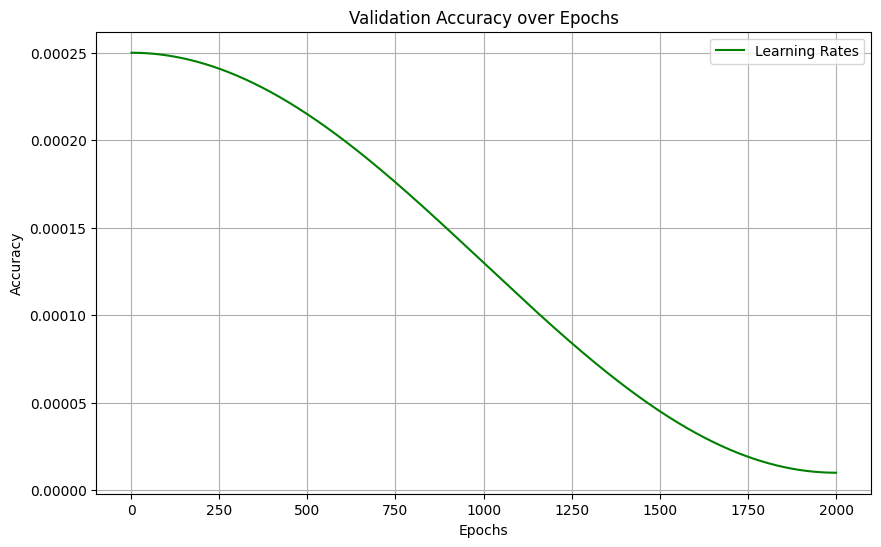

Model for bin 14 saved to GATModels-5A_exp5ME/Models/model_bin_14.pth
Attention weights for bin 14 saved to GATModels-5A_exp5ME/Weights/attn_bin_14.pt
Training on bin 15/50
Bin 15, Epoch 1/2000, Train Loss: 0.6696, Validation Loss: 0.7068,  ValAccuracy: 0.2232, LR: 0.000250
Bin 15, Epoch 501/2000, Train Loss: 0.3959, Validation Loss: 0.3635,  ValAccuracy: 0.8729, LR: 0.000215
Bin 15, Epoch 1001/2000, Train Loss: 0.3730, Validation Loss: 0.3833,  ValAccuracy: 0.8503, LR: 0.000130
Bin 15, Epoch 1501/2000, Train Loss: 0.3638, Validation Loss: 0.3619,  ValAccuracy: 0.8418, LR: 0.000045


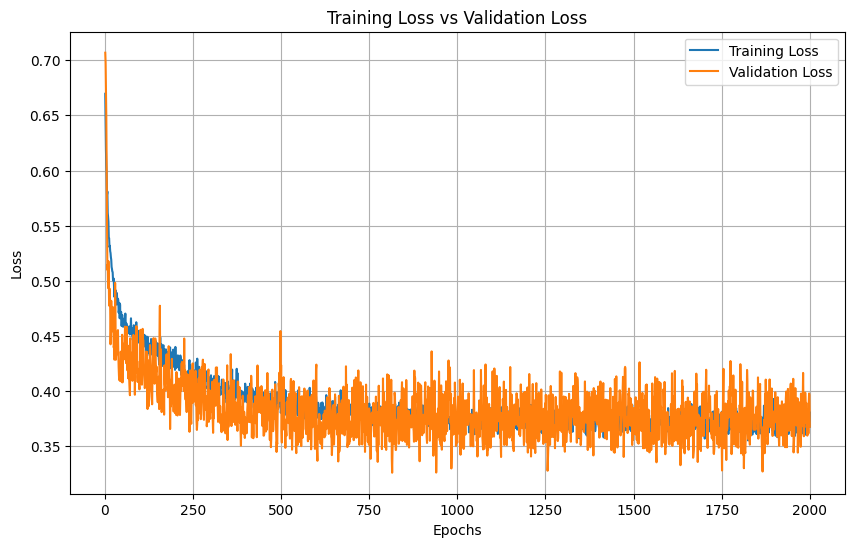

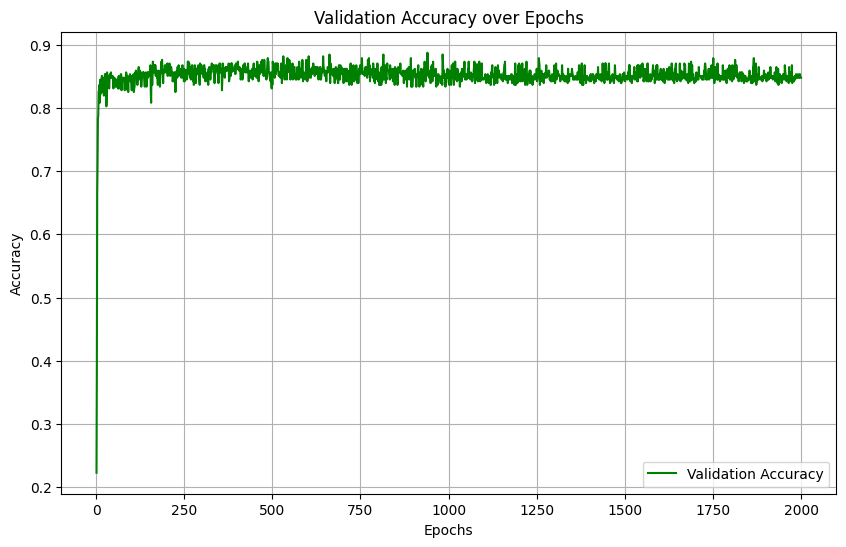

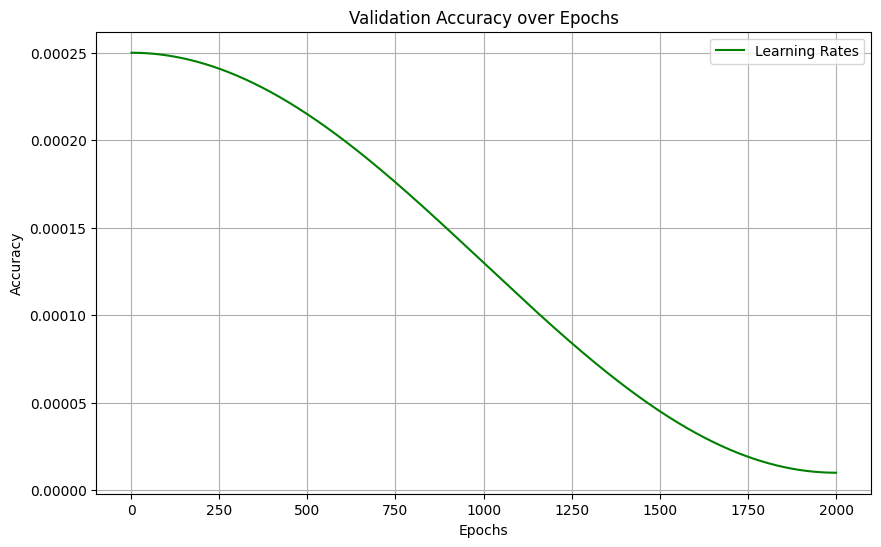

Model for bin 15 saved to GATModels-5A_exp5ME/Models/model_bin_15.pth
Attention weights for bin 15 saved to GATModels-5A_exp5ME/Weights/attn_bin_15.pt
Training on bin 16/50
Bin 16, Epoch 1/2000, Train Loss: 0.7776, Validation Loss: 0.6536,  ValAccuracy: 0.7797, LR: 0.000250
Bin 16, Epoch 501/2000, Train Loss: 0.3761, Validation Loss: 0.3997,  ValAccuracy: 0.8672, LR: 0.000215
Bin 16, Epoch 1001/2000, Train Loss: 0.3771, Validation Loss: 0.3584,  ValAccuracy: 0.8898, LR: 0.000130
Bin 16, Epoch 1501/2000, Train Loss: 0.3703, Validation Loss: 0.3908,  ValAccuracy: 0.8672, LR: 0.000045


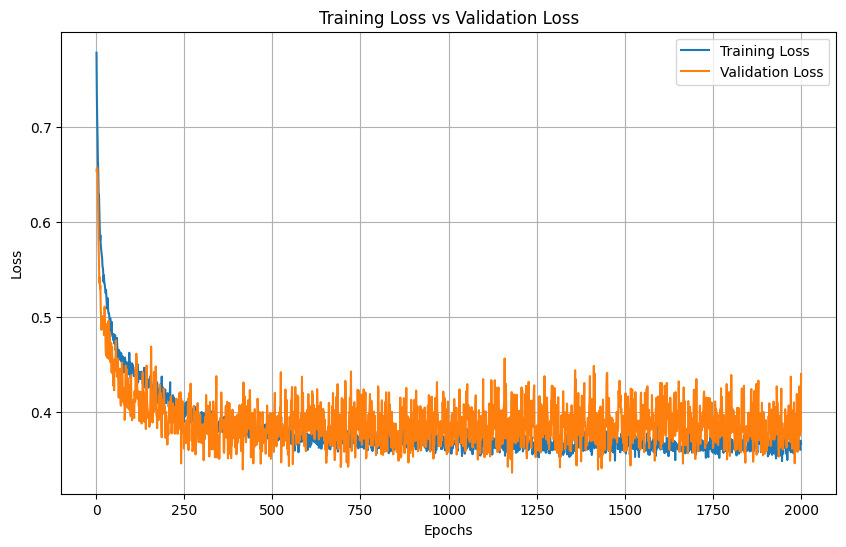

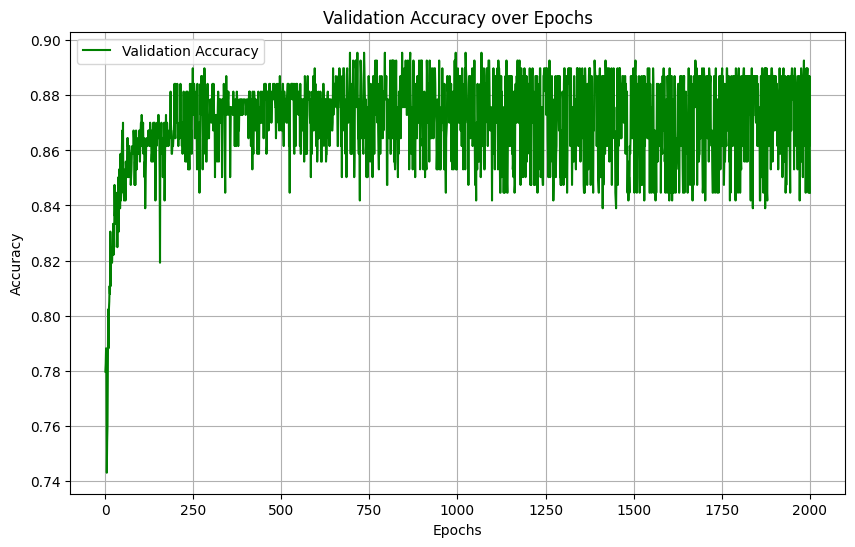

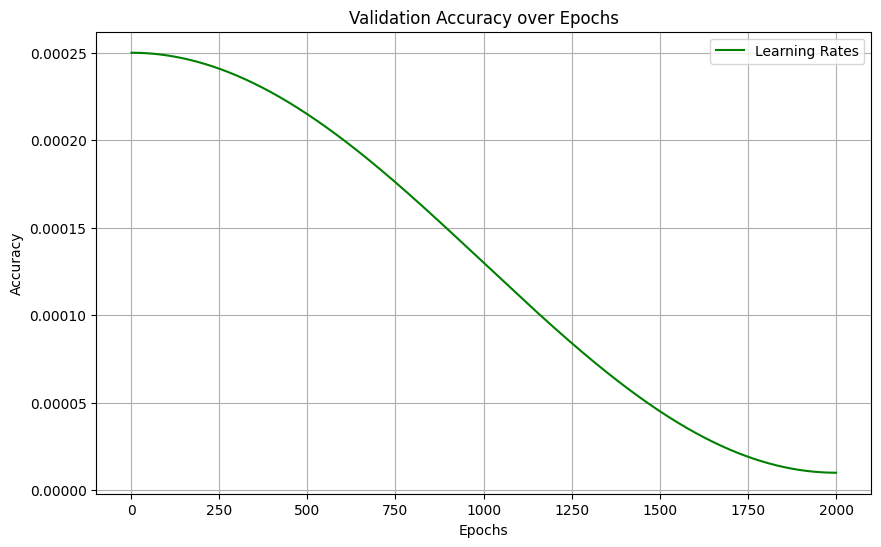

Model for bin 16 saved to GATModels-5A_exp5ME/Models/model_bin_16.pth
Attention weights for bin 16 saved to GATModels-5A_exp5ME/Weights/attn_bin_16.pt
Training on bin 17/50
Bin 17, Epoch 1/2000, Train Loss: 0.7949, Validation Loss: 0.6819,  ValAccuracy: 0.7797, LR: 0.000250
Bin 17, Epoch 501/2000, Train Loss: 0.3775, Validation Loss: 0.3094,  ValAccuracy: 0.8814, LR: 0.000215
Bin 17, Epoch 1001/2000, Train Loss: 0.3612, Validation Loss: 0.3626,  ValAccuracy: 0.8503, LR: 0.000130
Bin 17, Epoch 1501/2000, Train Loss: 0.3469, Validation Loss: 0.3242,  ValAccuracy: 0.8729, LR: 0.000045


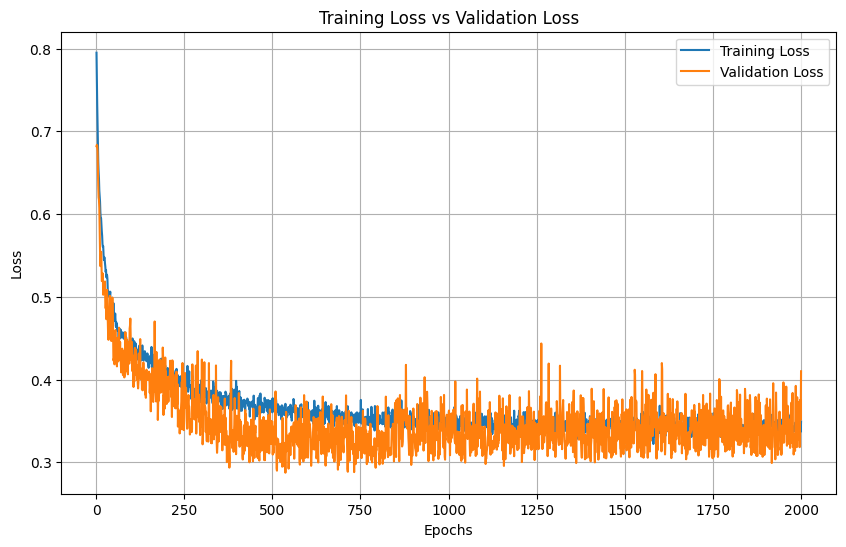

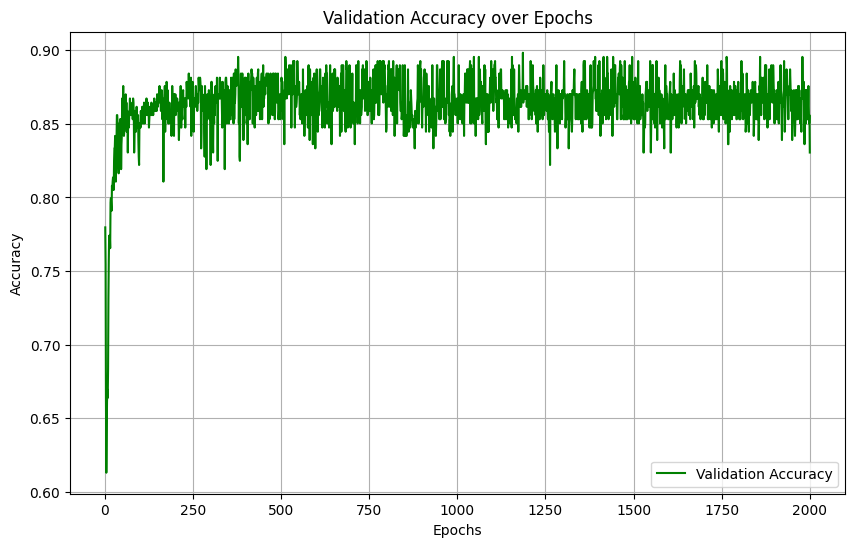

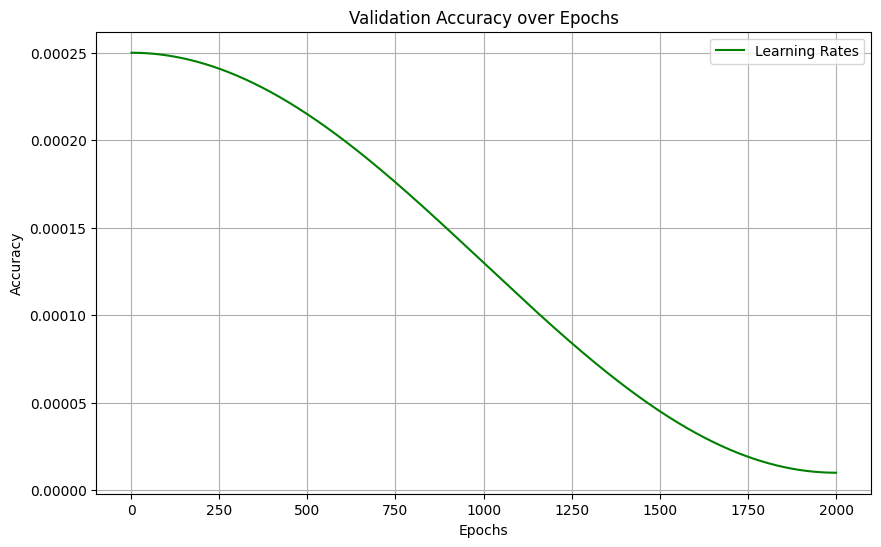

Model for bin 17 saved to GATModels-5A_exp5ME/Models/model_bin_17.pth
Attention weights for bin 17 saved to GATModels-5A_exp5ME/Weights/attn_bin_17.pt
Training on bin 18/50
Bin 18, Epoch 1/2000, Train Loss: 0.6711, Validation Loss: 0.6624,  ValAccuracy: 0.7825, LR: 0.000250
Bin 18, Epoch 501/2000, Train Loss: 0.4078, Validation Loss: 0.4623,  ValAccuracy: 0.8305, LR: 0.000215
Bin 18, Epoch 1001/2000, Train Loss: 0.3209, Validation Loss: 0.3298,  ValAccuracy: 0.8870, LR: 0.000130
Bin 18, Epoch 1501/2000, Train Loss: 0.2948, Validation Loss: 0.3247,  ValAccuracy: 0.8870, LR: 0.000045


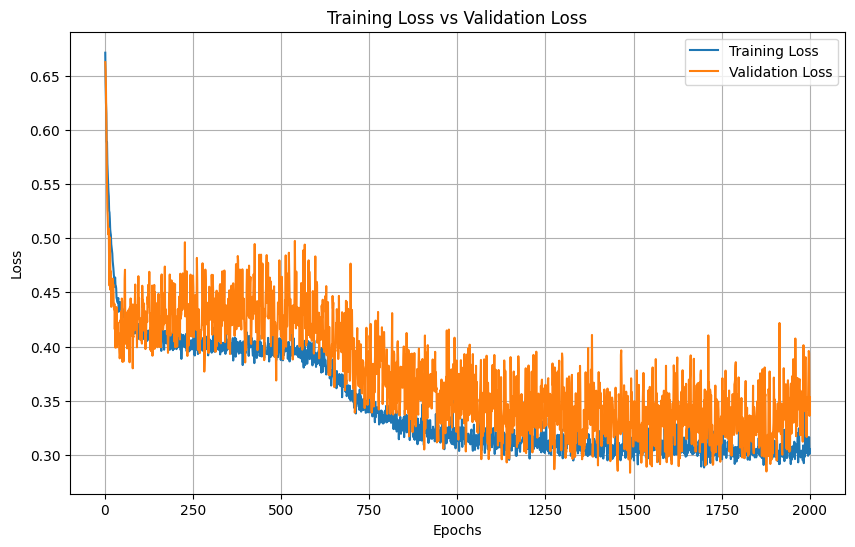

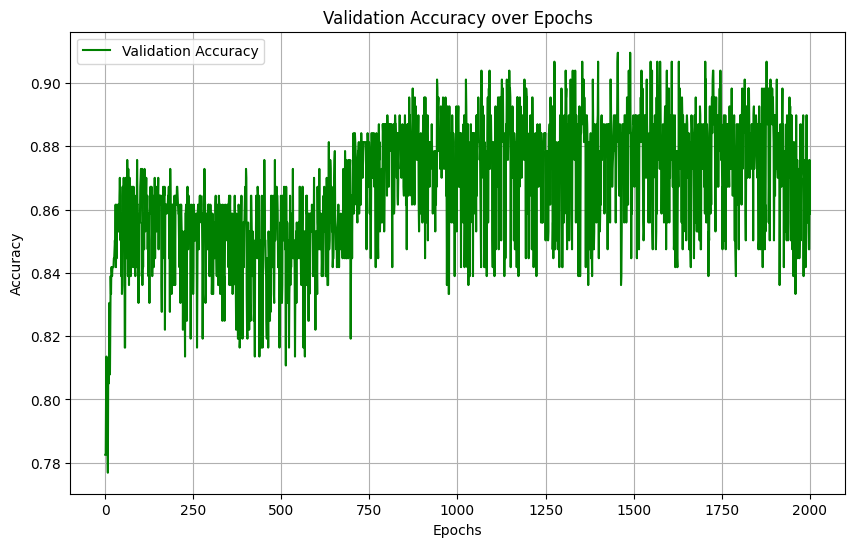

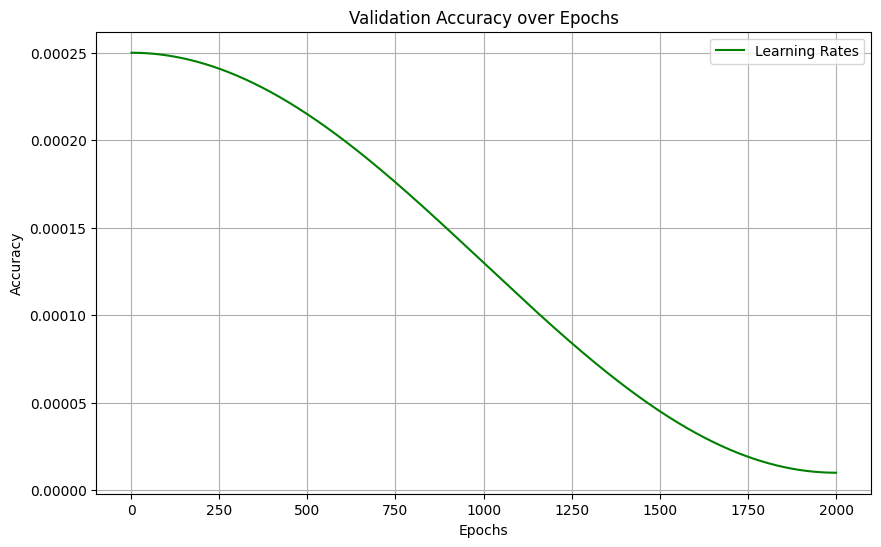

Model for bin 18 saved to GATModels-5A_exp5ME/Models/model_bin_18.pth
Attention weights for bin 18 saved to GATModels-5A_exp5ME/Weights/attn_bin_18.pt
Training on bin 19/50
Bin 19, Epoch 1/2000, Train Loss: 0.6949, Validation Loss: 0.7316,  ValAccuracy: 0.2175, LR: 0.000250
Bin 19, Epoch 501/2000, Train Loss: 0.3699, Validation Loss: 0.3508,  ValAccuracy: 0.8757, LR: 0.000215
Bin 19, Epoch 1001/2000, Train Loss: 0.3598, Validation Loss: 0.3866,  ValAccuracy: 0.8616, LR: 0.000130
Bin 19, Epoch 1501/2000, Train Loss: 0.3620, Validation Loss: 0.3644,  ValAccuracy: 0.8672, LR: 0.000045


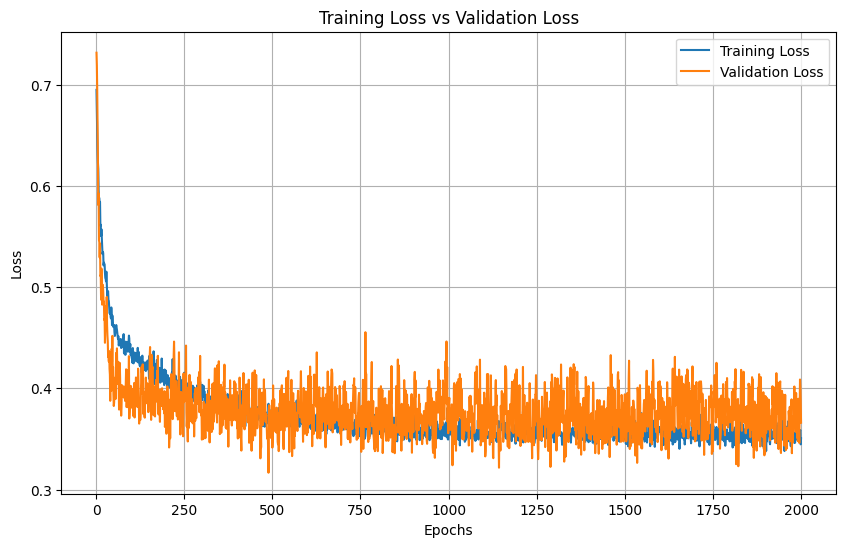

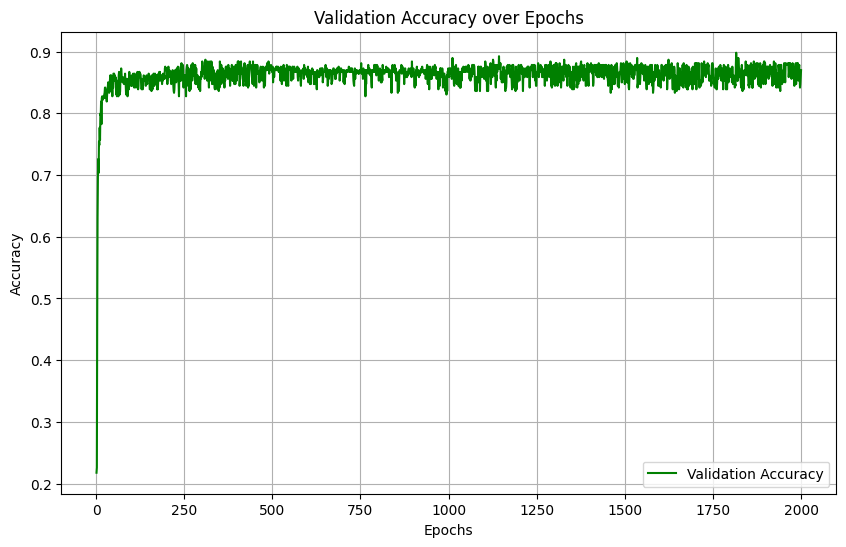

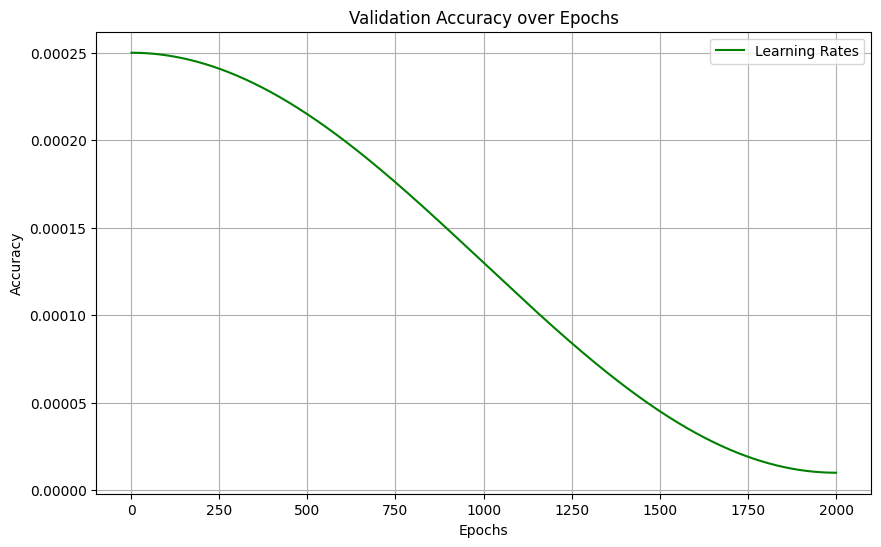

Model for bin 19 saved to GATModels-5A_exp5ME/Models/model_bin_19.pth
Attention weights for bin 19 saved to GATModels-5A_exp5ME/Weights/attn_bin_19.pt
Training on bin 20/50
Bin 20, Epoch 1/2000, Train Loss: 0.7150, Validation Loss: 0.6967,  ValAccuracy: 0.2740, LR: 0.000250
Bin 20, Epoch 501/2000, Train Loss: 0.3455, Validation Loss: 0.4225,  ValAccuracy: 0.8729, LR: 0.000215
Bin 20, Epoch 1001/2000, Train Loss: 0.3407, Validation Loss: 0.4806,  ValAccuracy: 0.8390, LR: 0.000130
Bin 20, Epoch 1501/2000, Train Loss: 0.3356, Validation Loss: 0.4141,  ValAccuracy: 0.8757, LR: 0.000045


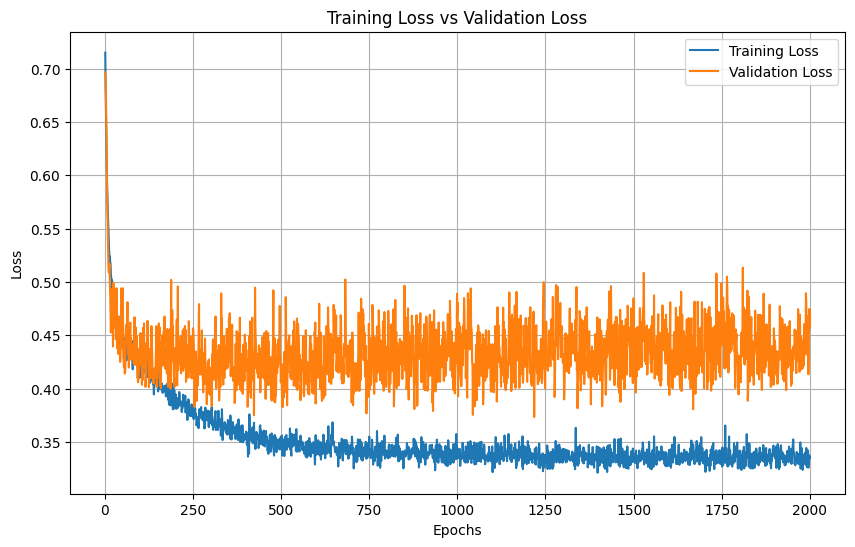

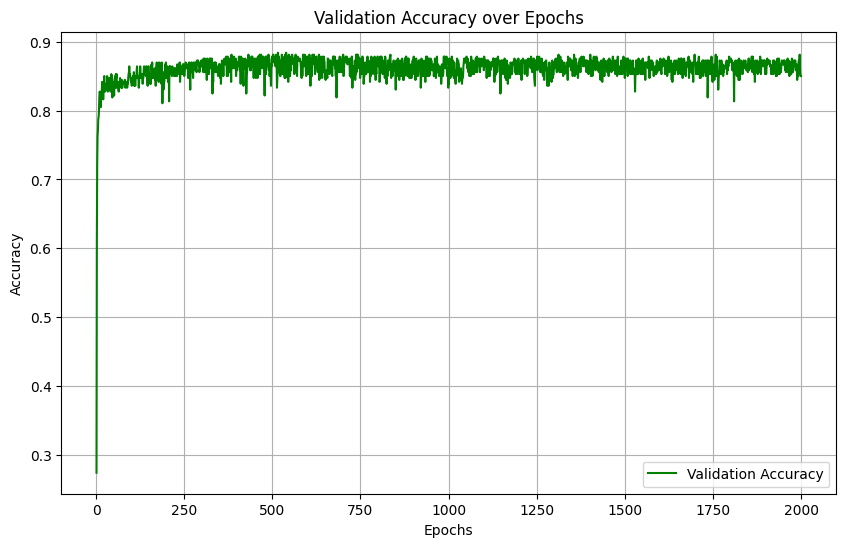

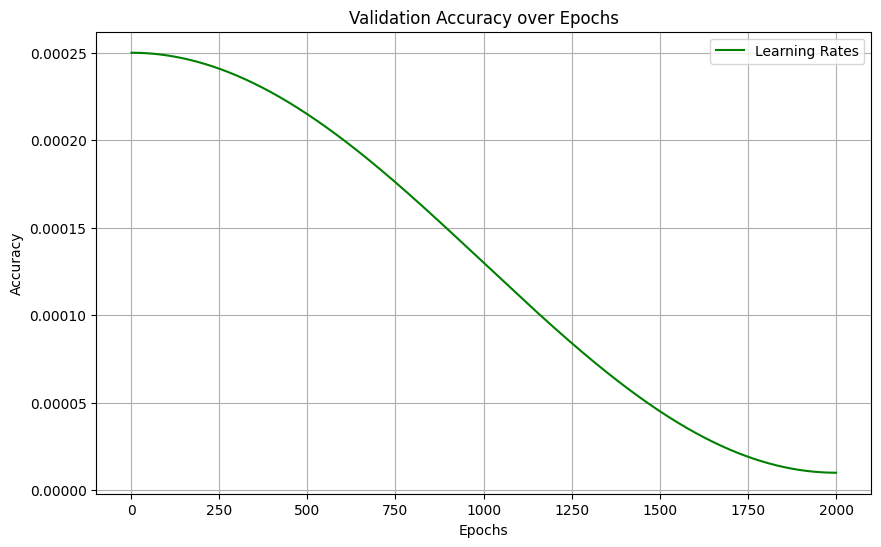

Model for bin 20 saved to GATModels-5A_exp5ME/Models/model_bin_20.pth
Attention weights for bin 20 saved to GATModels-5A_exp5ME/Weights/attn_bin_20.pt
Training on bin 21/50
Bin 21, Epoch 1/2000, Train Loss: 0.7201, Validation Loss: 0.7176,  ValAccuracy: 0.2203, LR: 0.000250
Bin 21, Epoch 501/2000, Train Loss: 0.3823, Validation Loss: 0.3755,  ValAccuracy: 0.8644, LR: 0.000215
Bin 21, Epoch 1001/2000, Train Loss: 0.3572, Validation Loss: 0.4014,  ValAccuracy: 0.8559, LR: 0.000130
Bin 21, Epoch 1501/2000, Train Loss: 0.3543, Validation Loss: 0.3691,  ValAccuracy: 0.8672, LR: 0.000045


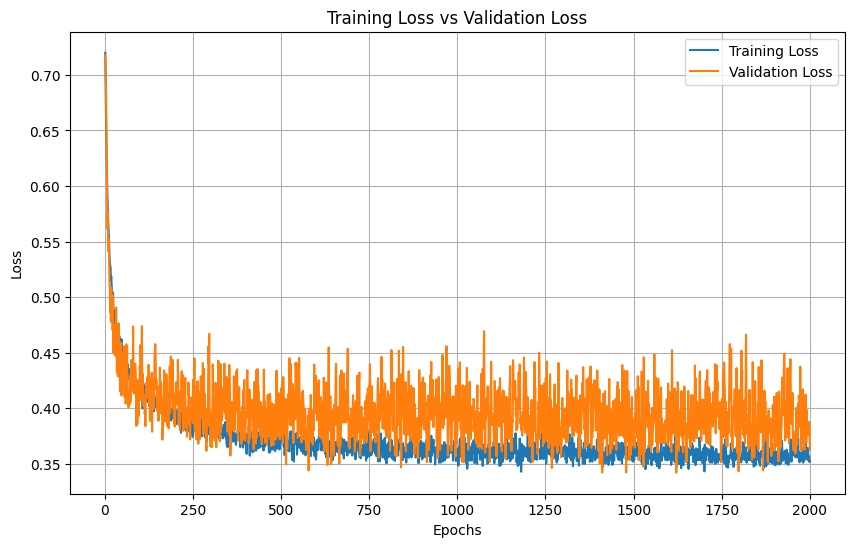

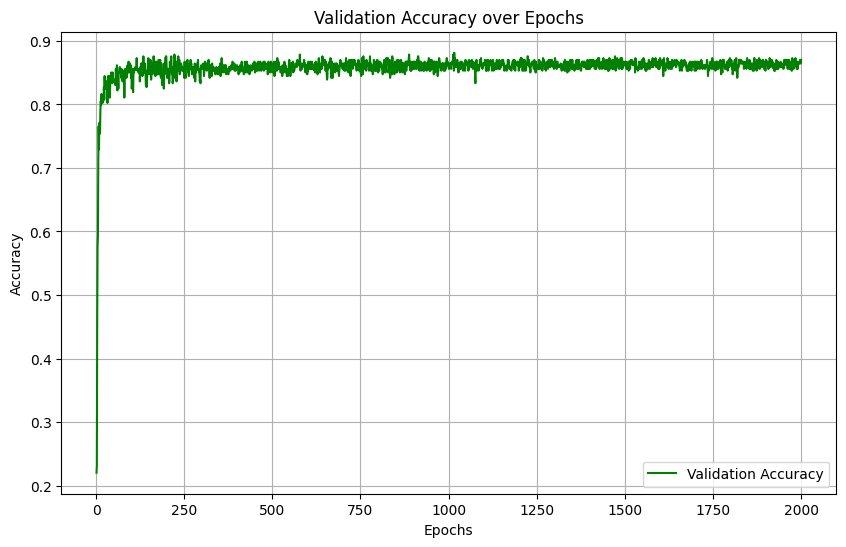

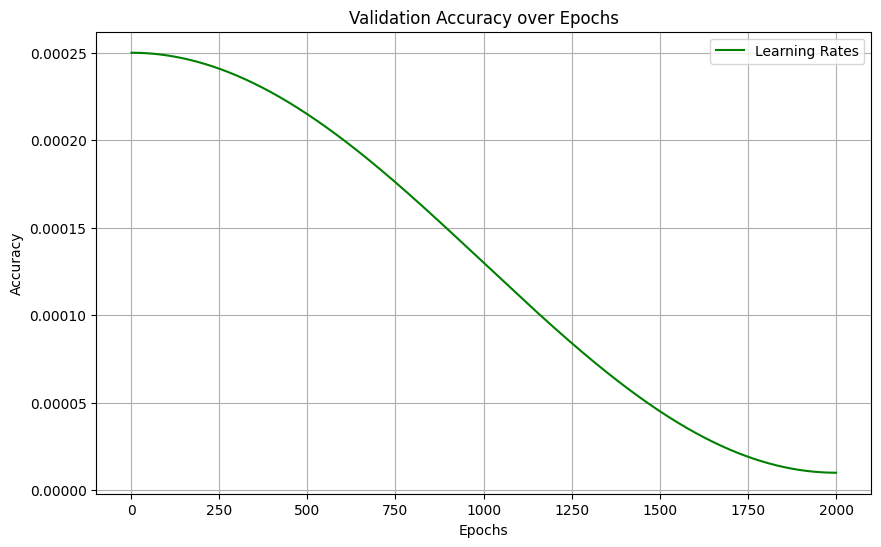

Model for bin 21 saved to GATModels-5A_exp5ME/Models/model_bin_21.pth
Attention weights for bin 21 saved to GATModels-5A_exp5ME/Weights/attn_bin_21.pt
Training on bin 22/50
Bin 22, Epoch 1/2000, Train Loss: 0.8855, Validation Loss: 0.6792,  ValAccuracy: 0.7740, LR: 0.000250
Bin 22, Epoch 501/2000, Train Loss: 0.4082, Validation Loss: 0.3703,  ValAccuracy: 0.8785, LR: 0.000215
Bin 22, Epoch 1001/2000, Train Loss: 0.3970, Validation Loss: 0.3734,  ValAccuracy: 0.8927, LR: 0.000130
Bin 22, Epoch 1501/2000, Train Loss: 0.3773, Validation Loss: 0.3911,  ValAccuracy: 0.8898, LR: 0.000045


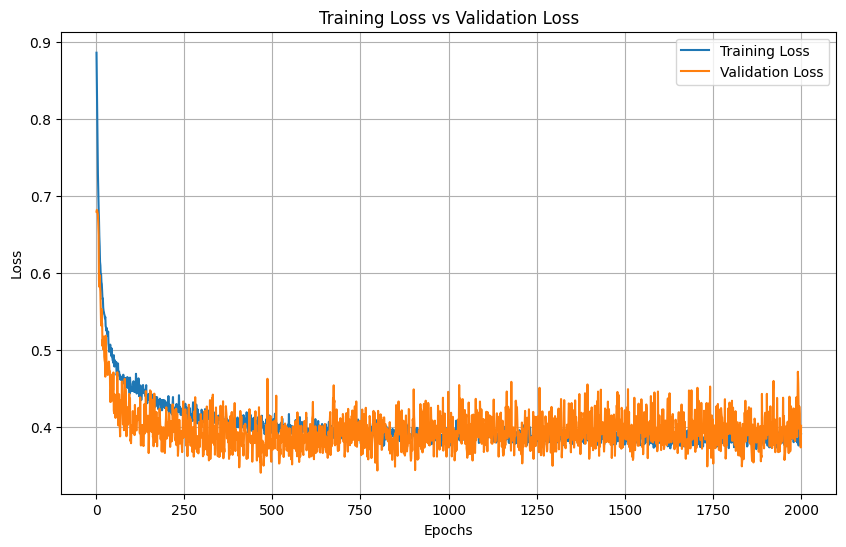

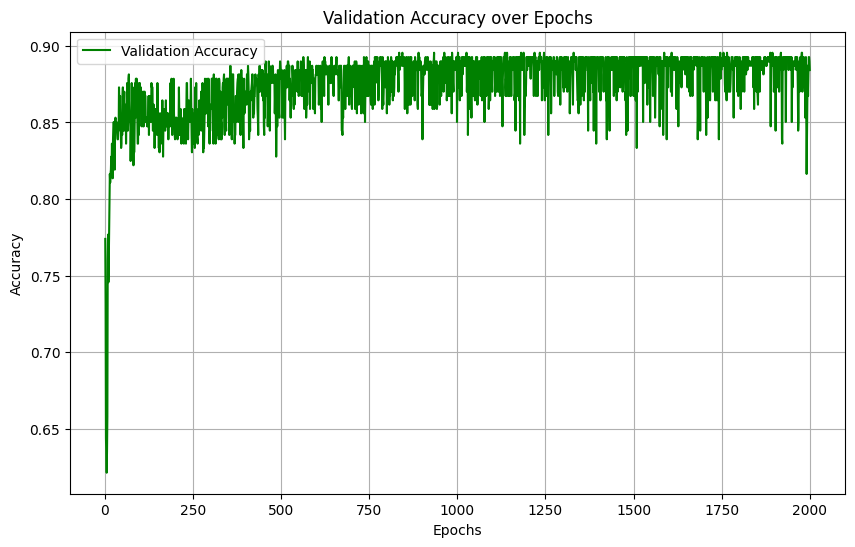

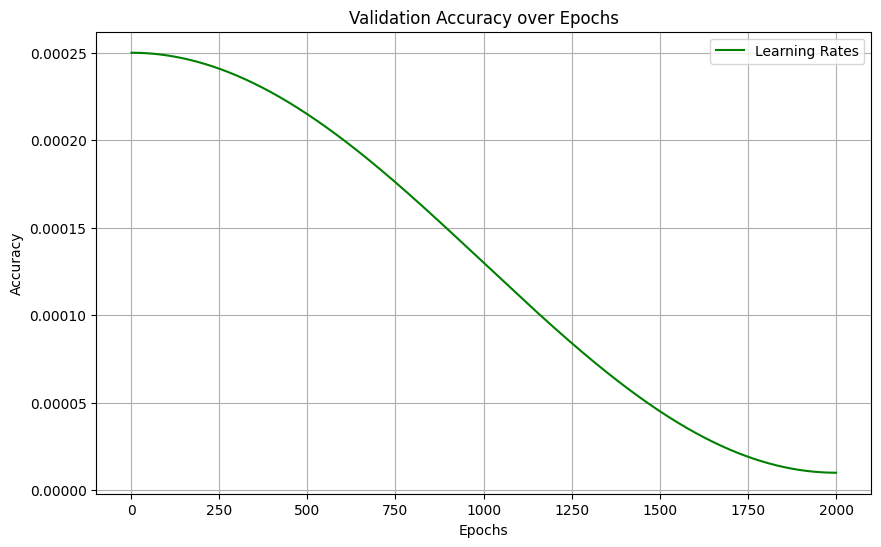

Model for bin 22 saved to GATModels-5A_exp5ME/Models/model_bin_22.pth
Attention weights for bin 22 saved to GATModels-5A_exp5ME/Weights/attn_bin_22.pt
Training on bin 23/50
Bin 23, Epoch 1/2000, Train Loss: 0.8498, Validation Loss: 0.6998,  ValAccuracy: 0.2571, LR: 0.000250
Bin 23, Epoch 501/2000, Train Loss: 0.3978, Validation Loss: 0.3482,  ValAccuracy: 0.8757, LR: 0.000215
Bin 23, Epoch 1001/2000, Train Loss: 0.3630, Validation Loss: 0.3319,  ValAccuracy: 0.8644, LR: 0.000130
Bin 23, Epoch 1501/2000, Train Loss: 0.3581, Validation Loss: 0.3022,  ValAccuracy: 0.8757, LR: 0.000045


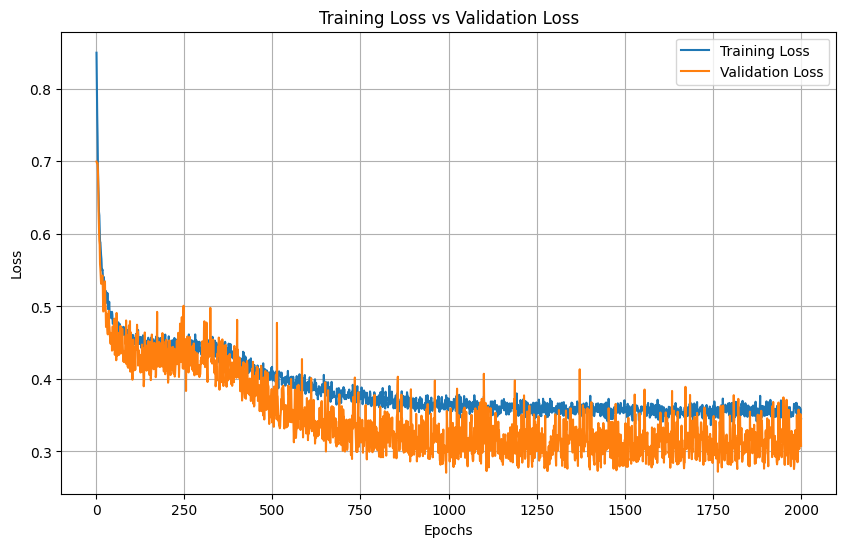

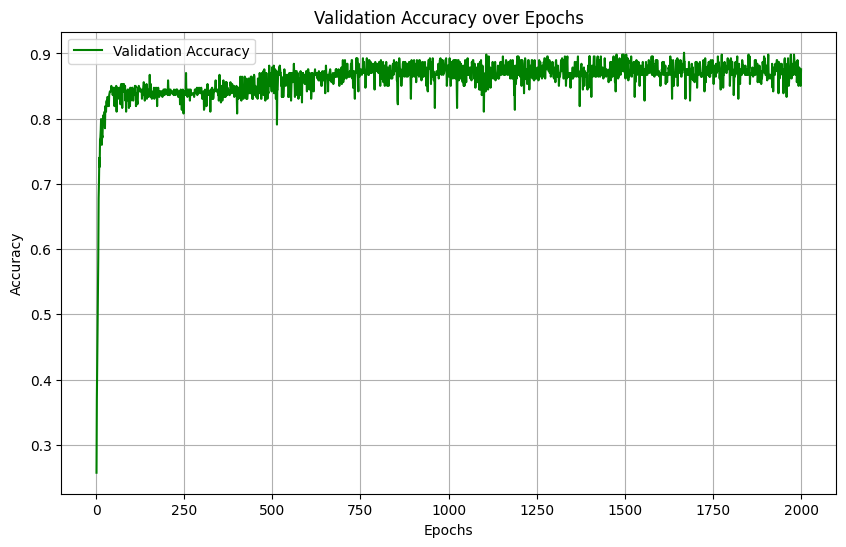

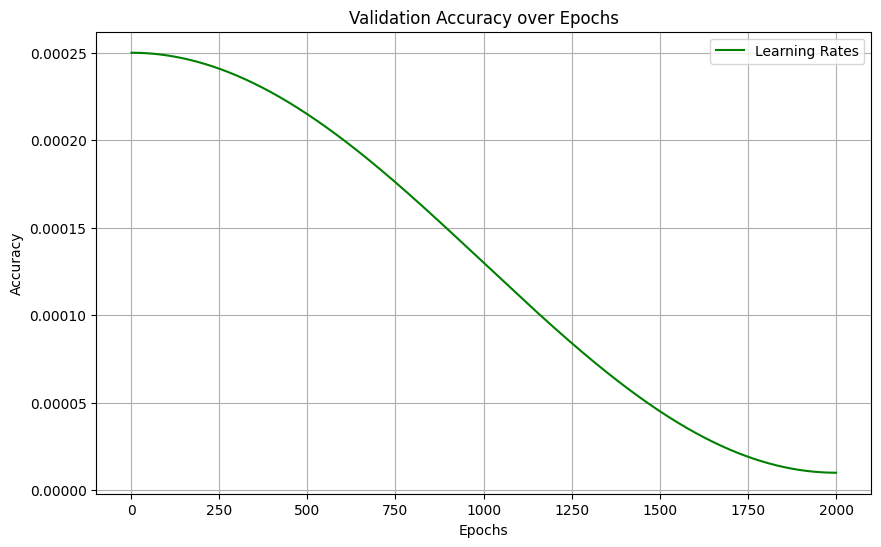

Model for bin 23 saved to GATModels-5A_exp5ME/Models/model_bin_23.pth
Attention weights for bin 23 saved to GATModels-5A_exp5ME/Weights/attn_bin_23.pt
Training on bin 24/50
Bin 24, Epoch 1/2000, Train Loss: 0.6948, Validation Loss: 0.7297,  ValAccuracy: 0.2203, LR: 0.000250
Bin 24, Epoch 501/2000, Train Loss: 0.3532, Validation Loss: 0.4689,  ValAccuracy: 0.8362, LR: 0.000215
Bin 24, Epoch 1001/2000, Train Loss: 0.3410, Validation Loss: 0.3919,  ValAccuracy: 0.8870, LR: 0.000130
Bin 24, Epoch 1501/2000, Train Loss: 0.3440, Validation Loss: 0.3808,  ValAccuracy: 0.8898, LR: 0.000045


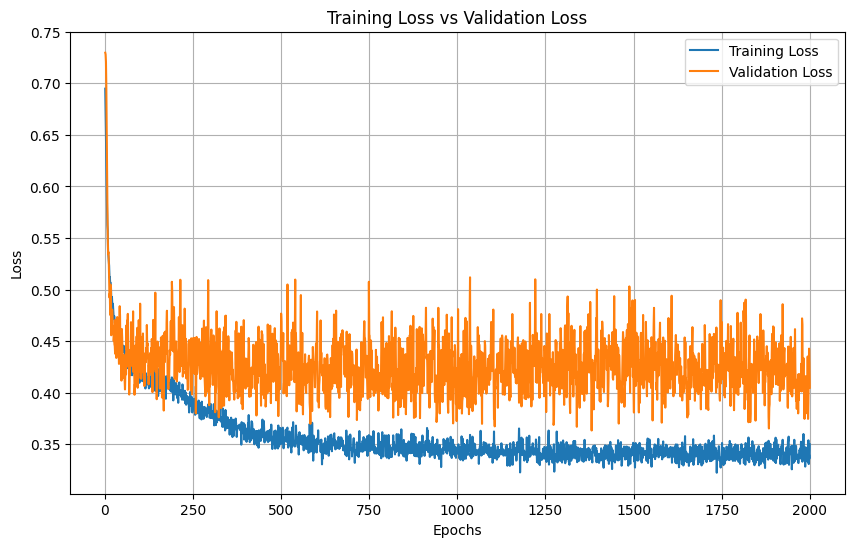

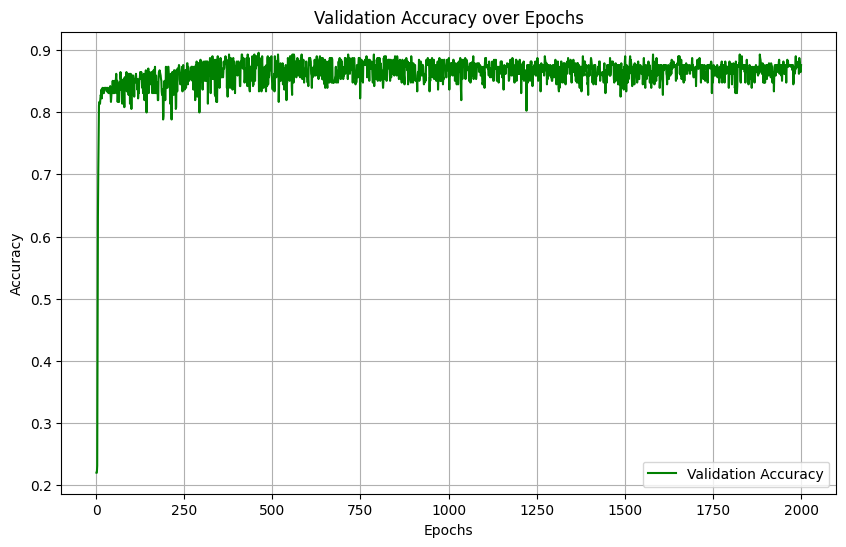

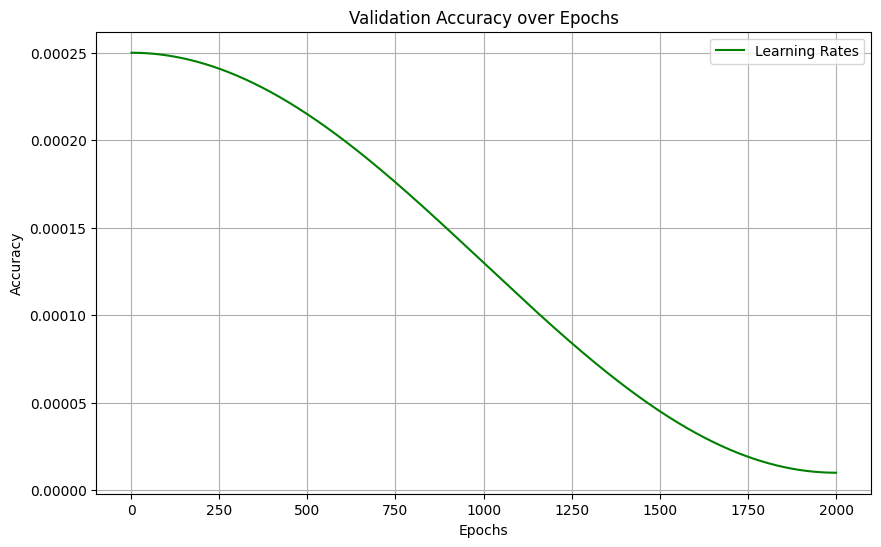

Model for bin 24 saved to GATModels-5A_exp5ME/Models/model_bin_24.pth
Attention weights for bin 24 saved to GATModels-5A_exp5ME/Weights/attn_bin_24.pt
Training on bin 25/50
Bin 25, Epoch 1/2000, Train Loss: 0.6657, Validation Loss: 0.6539,  ValAccuracy: 0.7825, LR: 0.000250
Bin 25, Epoch 501/2000, Train Loss: 0.3885, Validation Loss: 0.3553,  ValAccuracy: 0.8644, LR: 0.000215
Bin 25, Epoch 1001/2000, Train Loss: 0.3859, Validation Loss: 0.3426,  ValAccuracy: 0.8701, LR: 0.000130
Bin 25, Epoch 1501/2000, Train Loss: 0.3770, Validation Loss: 0.3433,  ValAccuracy: 0.8672, LR: 0.000045


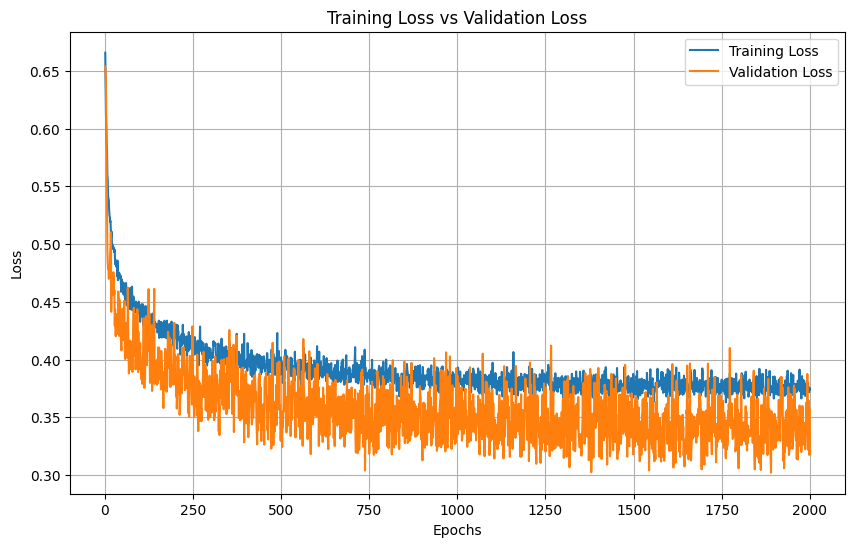

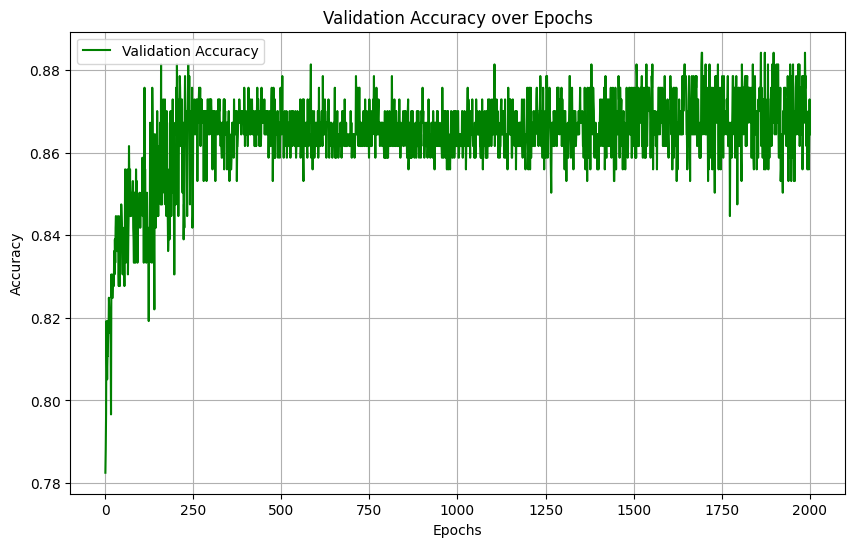

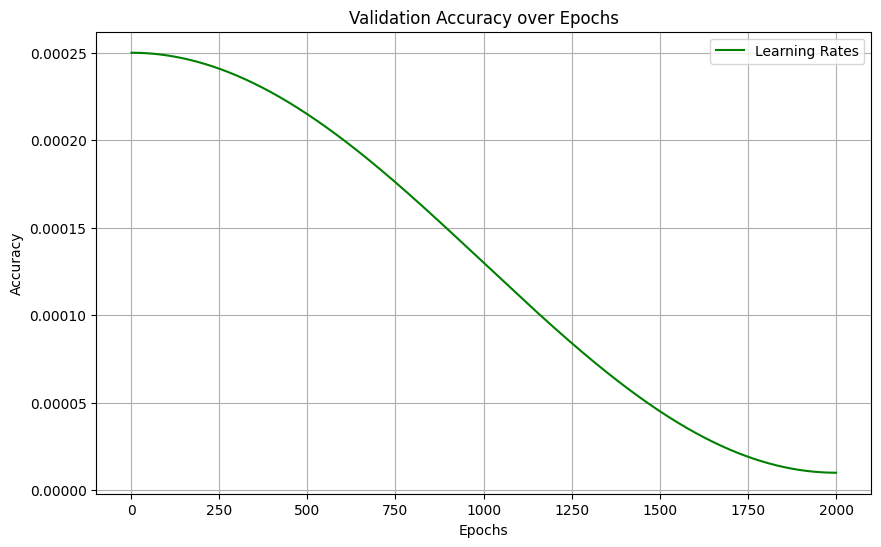

Model for bin 25 saved to GATModels-5A_exp5ME/Models/model_bin_25.pth
Attention weights for bin 25 saved to GATModels-5A_exp5ME/Weights/attn_bin_25.pt
Training on bin 26/50
Bin 26, Epoch 1/2000, Train Loss: 0.6599, Validation Loss: 0.6922,  ValAccuracy: 0.4915, LR: 0.000250
Bin 26, Epoch 501/2000, Train Loss: 0.3663, Validation Loss: 0.3119,  ValAccuracy: 0.8757, LR: 0.000215
Bin 26, Epoch 1001/2000, Train Loss: 0.3561, Validation Loss: 0.3198,  ValAccuracy: 0.8729, LR: 0.000130
Bin 26, Epoch 1501/2000, Train Loss: 0.3406, Validation Loss: 0.3142,  ValAccuracy: 0.8757, LR: 0.000045


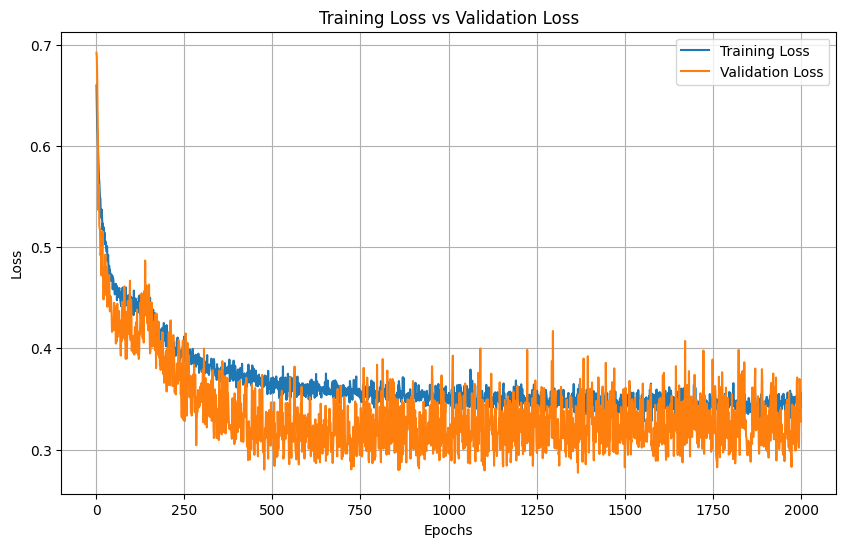

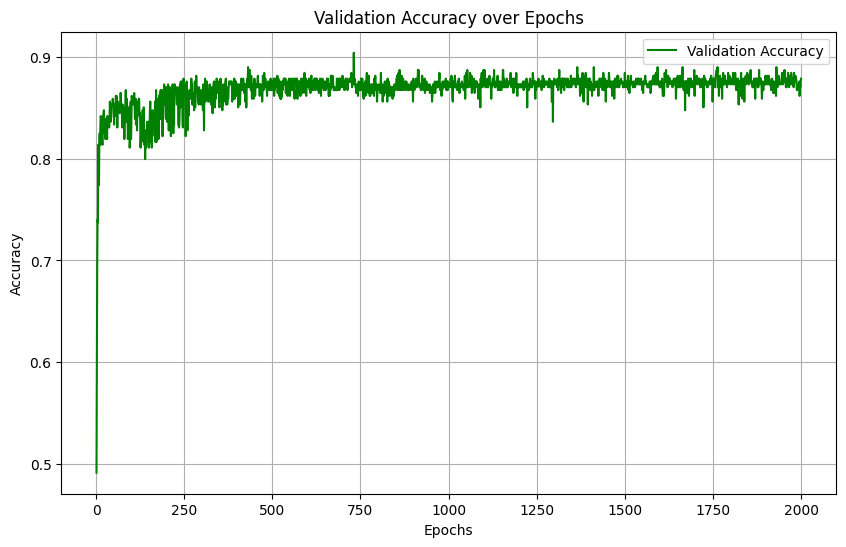

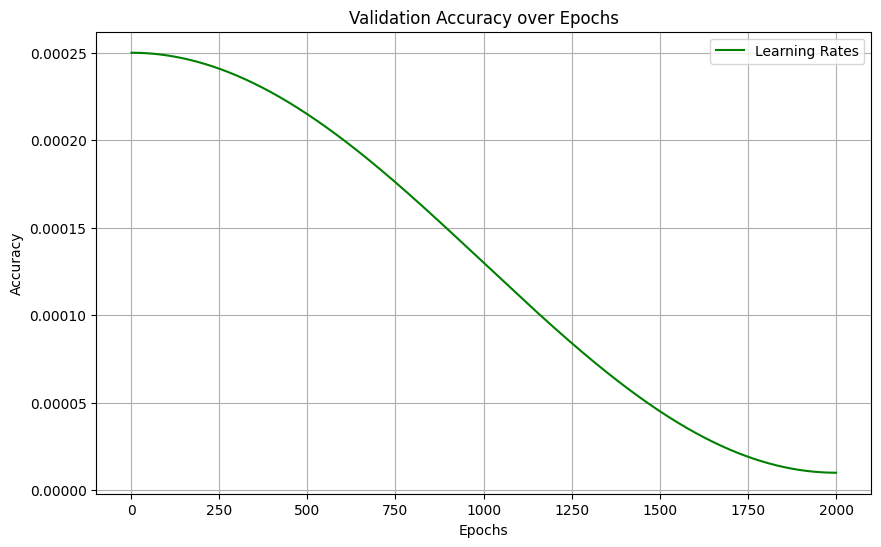

Model for bin 26 saved to GATModels-5A_exp5ME/Models/model_bin_26.pth
Attention weights for bin 26 saved to GATModels-5A_exp5ME/Weights/attn_bin_26.pt
Training on bin 27/50
Bin 27, Epoch 1/2000, Train Loss: 0.6384, Validation Loss: 0.6576,  ValAccuracy: 0.7853, LR: 0.000250
Bin 27, Epoch 501/2000, Train Loss: 0.3836, Validation Loss: 0.3847,  ValAccuracy: 0.8588, LR: 0.000215
Bin 27, Epoch 1001/2000, Train Loss: 0.3643, Validation Loss: 0.4145,  ValAccuracy: 0.8616, LR: 0.000130
Bin 27, Epoch 1501/2000, Train Loss: 0.3542, Validation Loss: 0.4249,  ValAccuracy: 0.8531, LR: 0.000045


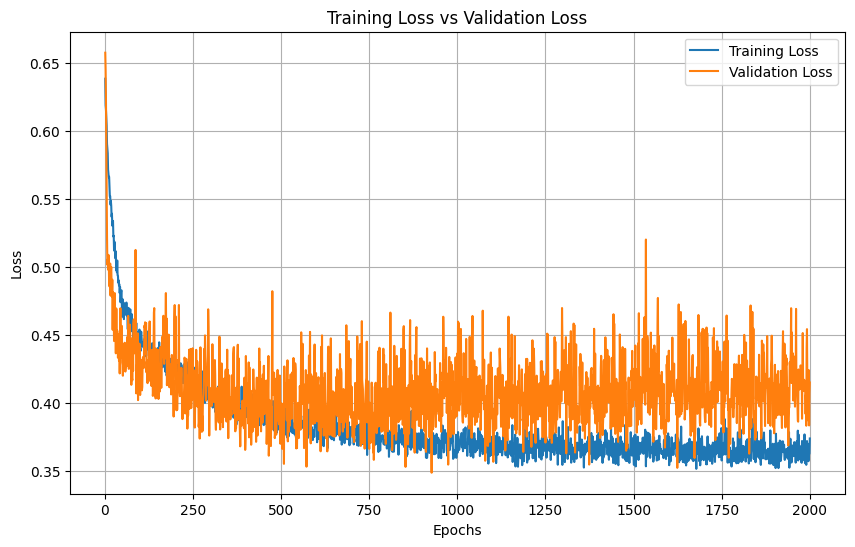

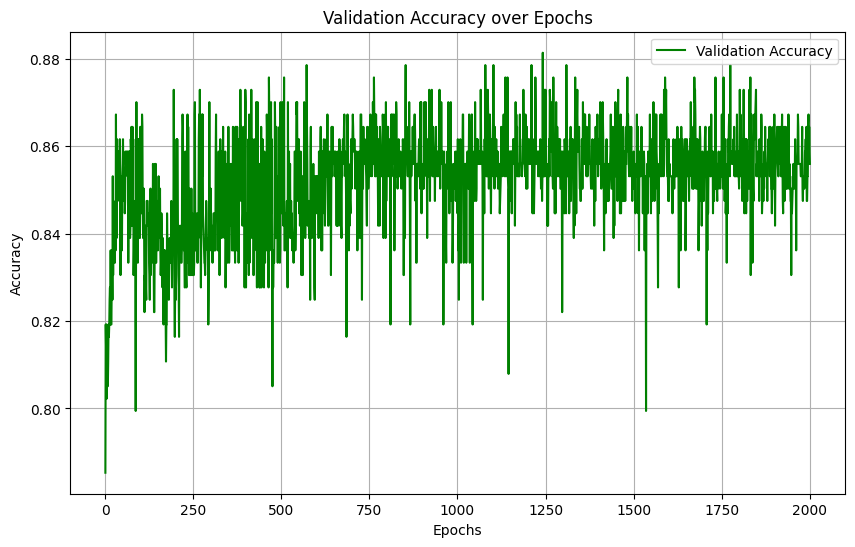

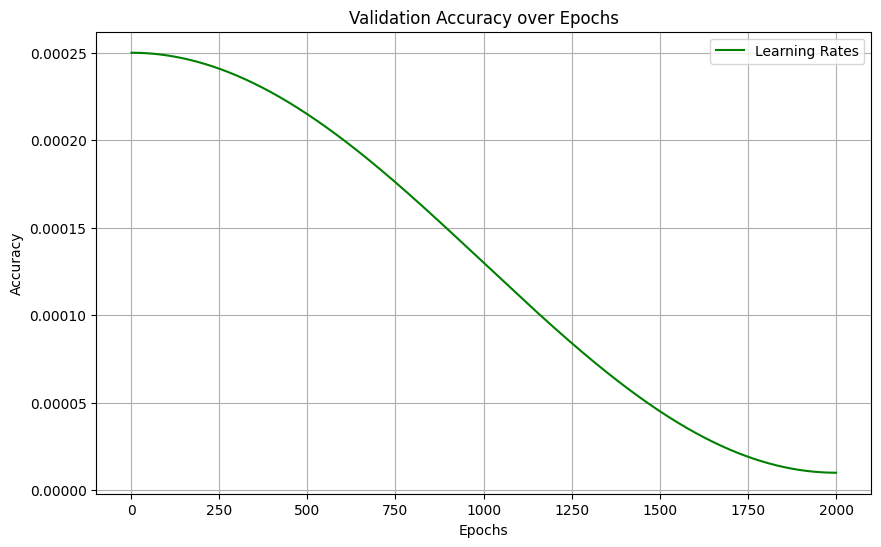

Model for bin 27 saved to GATModels-5A_exp5ME/Models/model_bin_27.pth
Attention weights for bin 27 saved to GATModels-5A_exp5ME/Weights/attn_bin_27.pt
Training on bin 28/50
Bin 28, Epoch 1/2000, Train Loss: 0.7502, Validation Loss: 0.7342,  ValAccuracy: 0.2175, LR: 0.000250
Bin 28, Epoch 501/2000, Train Loss: 0.3386, Validation Loss: 0.3350,  ValAccuracy: 0.8785, LR: 0.000215
Bin 28, Epoch 1001/2000, Train Loss: 0.3107, Validation Loss: 0.3535,  ValAccuracy: 0.8672, LR: 0.000130
Bin 28, Epoch 1501/2000, Train Loss: 0.3223, Validation Loss: 0.3581,  ValAccuracy: 0.8729, LR: 0.000045


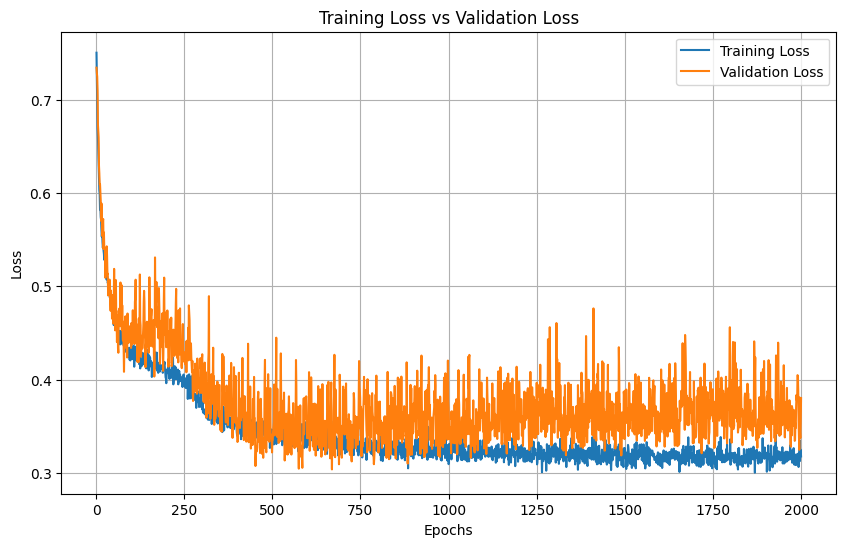

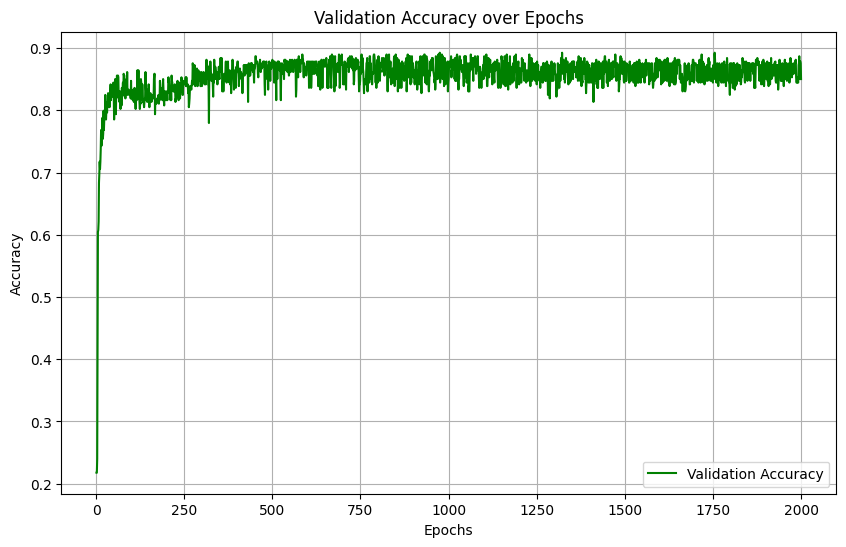

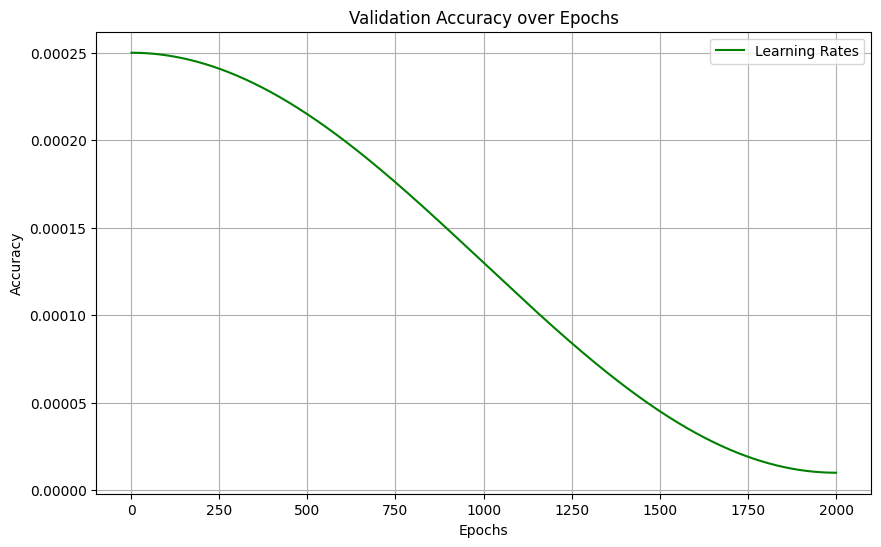

Model for bin 28 saved to GATModels-5A_exp5ME/Models/model_bin_28.pth
Attention weights for bin 28 saved to GATModels-5A_exp5ME/Weights/attn_bin_28.pt
Training on bin 29/50
Bin 29, Epoch 1/2000, Train Loss: 0.7405, Validation Loss: 0.7143,  ValAccuracy: 0.2203, LR: 0.000250
Bin 29, Epoch 501/2000, Train Loss: 0.4375, Validation Loss: 0.4258,  ValAccuracy: 0.8305, LR: 0.000215
Bin 29, Epoch 1001/2000, Train Loss: 0.4347, Validation Loss: 0.4021,  ValAccuracy: 0.8418, LR: 0.000130
Bin 29, Epoch 1501/2000, Train Loss: 0.4315, Validation Loss: 0.4365,  ValAccuracy: 0.8164, LR: 0.000045


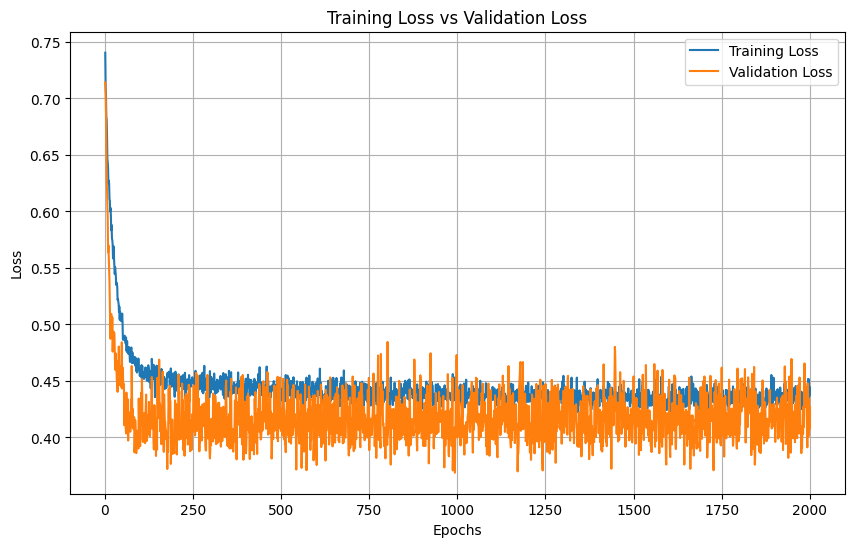

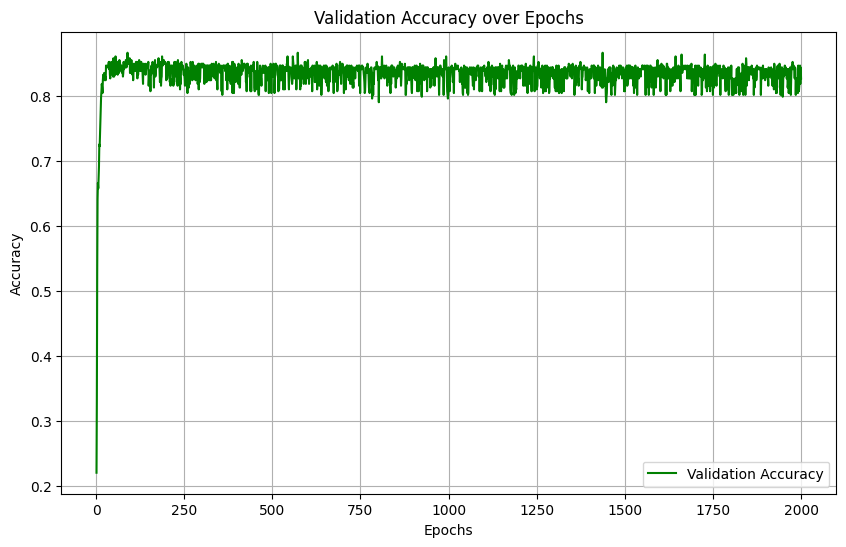

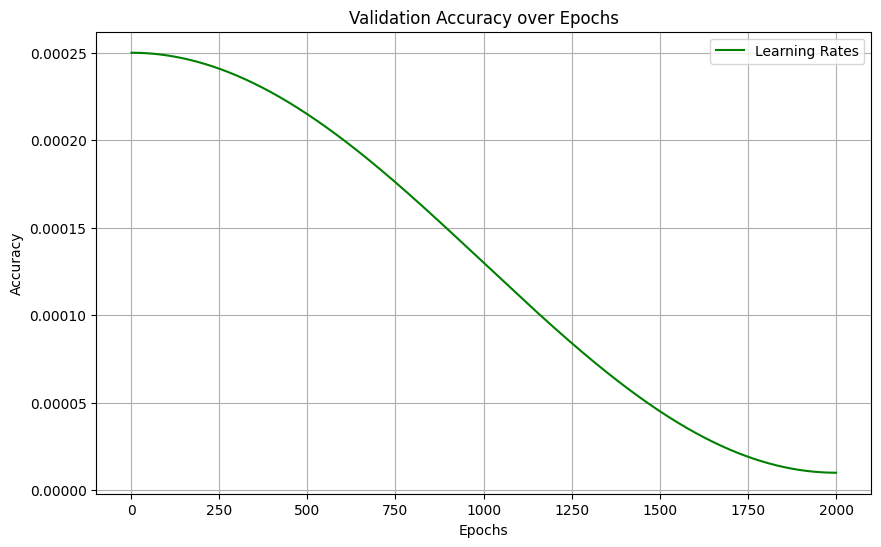

Model for bin 29 saved to GATModels-5A_exp5ME/Models/model_bin_29.pth
Attention weights for bin 29 saved to GATModels-5A_exp5ME/Weights/attn_bin_29.pt
Training on bin 30/50
Bin 30, Epoch 1/2000, Train Loss: 0.8937, Validation Loss: 0.6788,  ValAccuracy: 0.7825, LR: 0.000250
Bin 30, Epoch 501/2000, Train Loss: 0.3294, Validation Loss: 0.3384,  ValAccuracy: 0.8785, LR: 0.000215
Bin 30, Epoch 1001/2000, Train Loss: 0.3182, Validation Loss: 0.3448,  ValAccuracy: 0.8559, LR: 0.000130
Bin 30, Epoch 1501/2000, Train Loss: 0.3153, Validation Loss: 0.3842,  ValAccuracy: 0.8446, LR: 0.000045


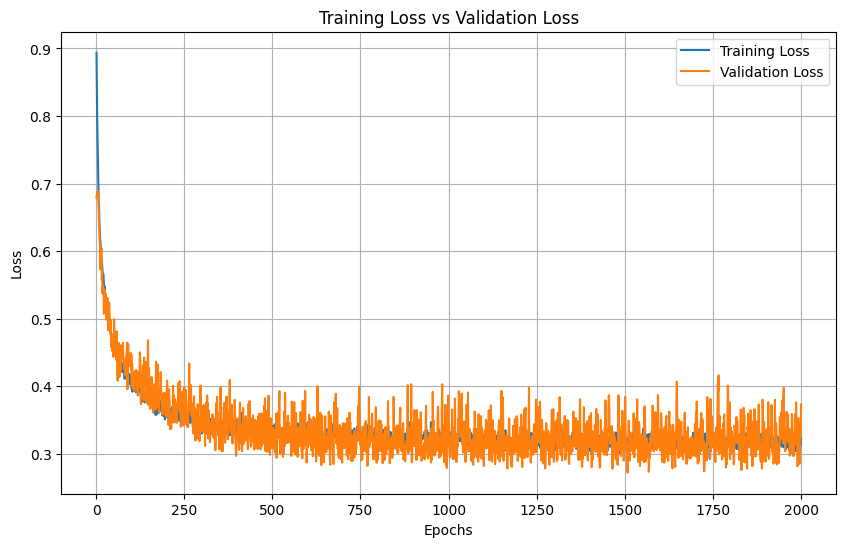

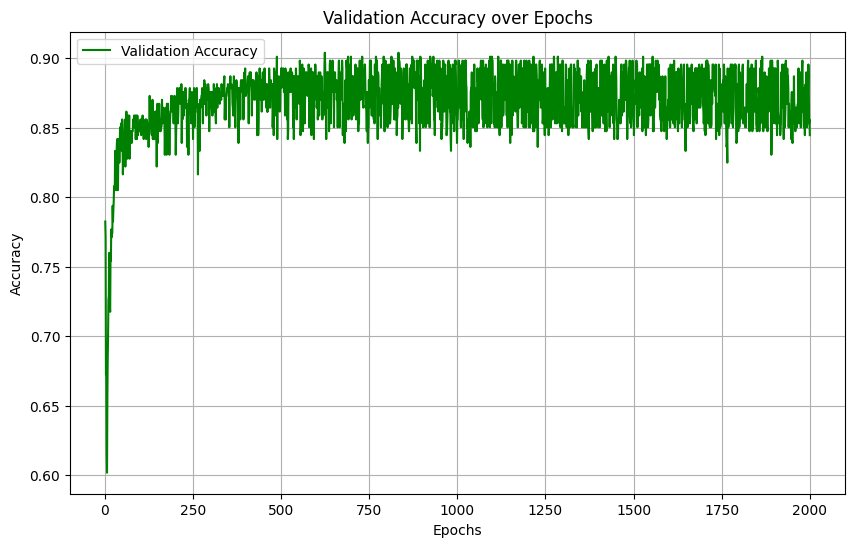

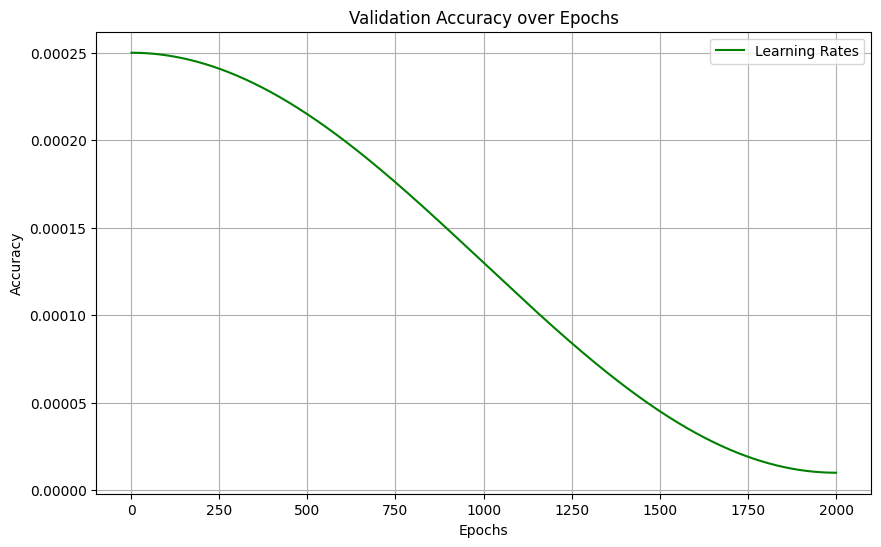

Model for bin 30 saved to GATModels-5A_exp5ME/Models/model_bin_30.pth
Attention weights for bin 30 saved to GATModels-5A_exp5ME/Weights/attn_bin_30.pt
Training on bin 31/50
Bin 31, Epoch 1/2000, Train Loss: 0.6823, Validation Loss: 0.6813,  ValAccuracy: 0.7797, LR: 0.000250
Bin 31, Epoch 501/2000, Train Loss: 0.4160, Validation Loss: 0.3299,  ValAccuracy: 0.8785, LR: 0.000215
Bin 31, Epoch 1001/2000, Train Loss: 0.3860, Validation Loss: 0.3315,  ValAccuracy: 0.8870, LR: 0.000130
Bin 31, Epoch 1501/2000, Train Loss: 0.3851, Validation Loss: 0.3239,  ValAccuracy: 0.8898, LR: 0.000045


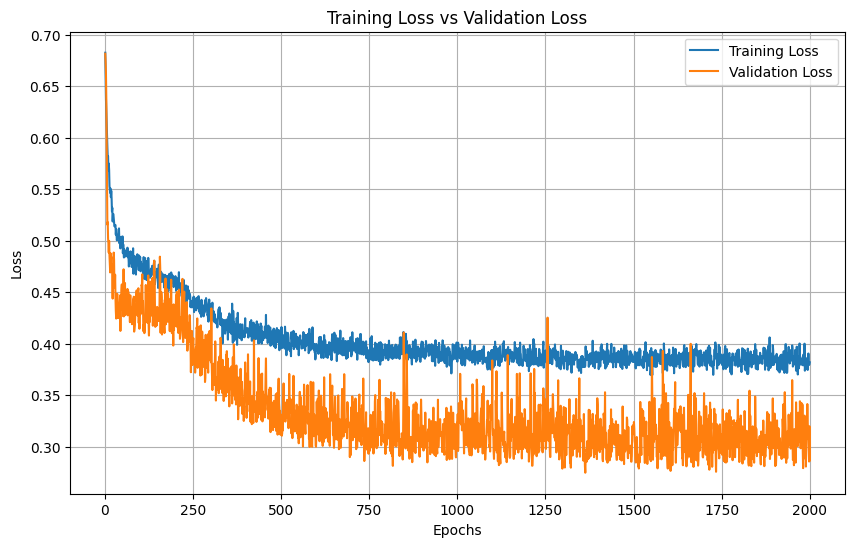

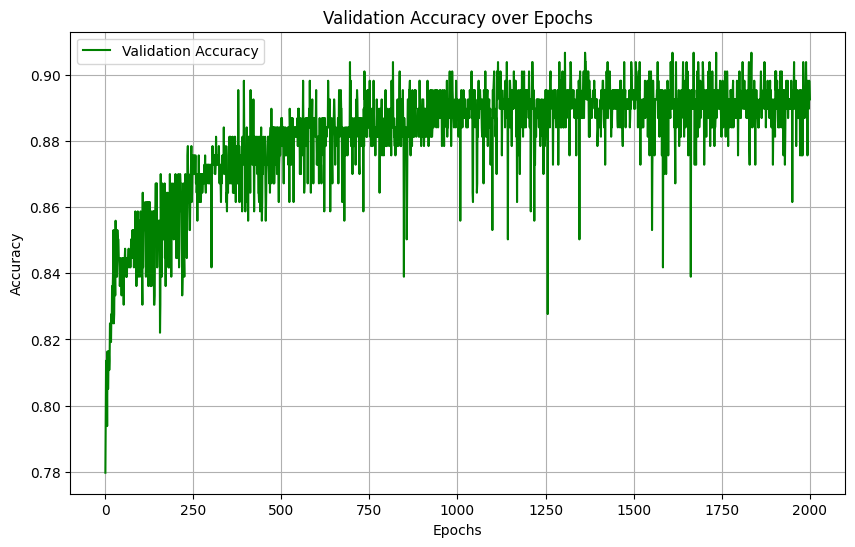

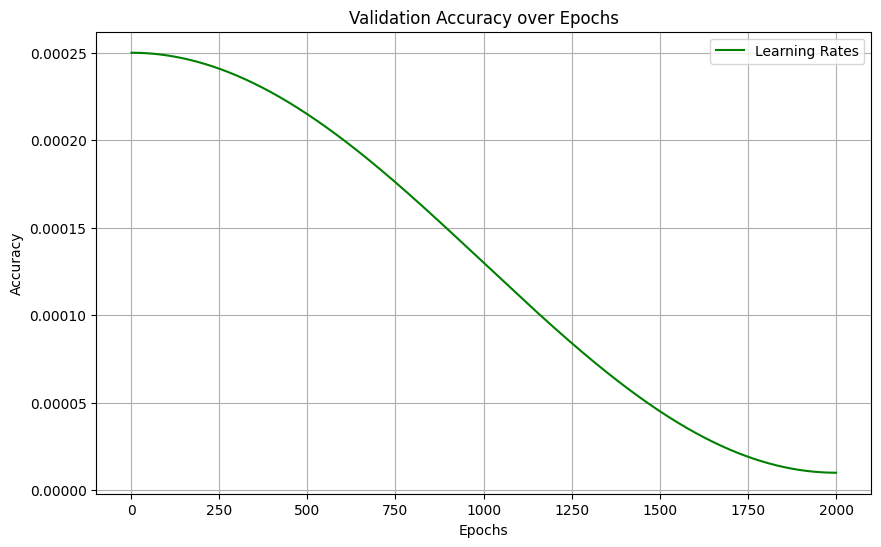

Model for bin 31 saved to GATModels-5A_exp5ME/Models/model_bin_31.pth
Attention weights for bin 31 saved to GATModels-5A_exp5ME/Weights/attn_bin_31.pt
Training on bin 32/50
Bin 32, Epoch 1/2000, Train Loss: 0.8469, Validation Loss: 0.6982,  ValAccuracy: 0.2542, LR: 0.000250
Bin 32, Epoch 501/2000, Train Loss: 0.4139, Validation Loss: 0.4279,  ValAccuracy: 0.8390, LR: 0.000215
Bin 32, Epoch 1001/2000, Train Loss: 0.3900, Validation Loss: 0.4252,  ValAccuracy: 0.8588, LR: 0.000130
Bin 32, Epoch 1501/2000, Train Loss: 0.3903, Validation Loss: 0.4028,  ValAccuracy: 0.8842, LR: 0.000045


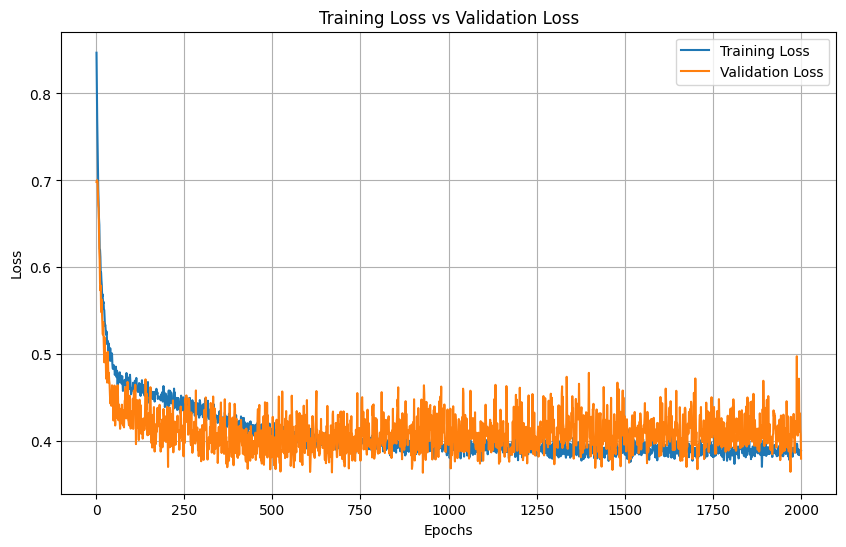

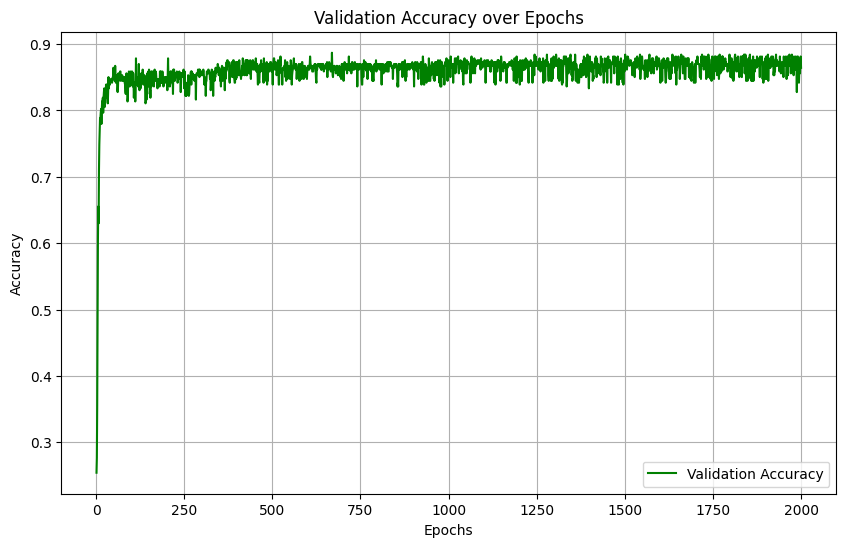

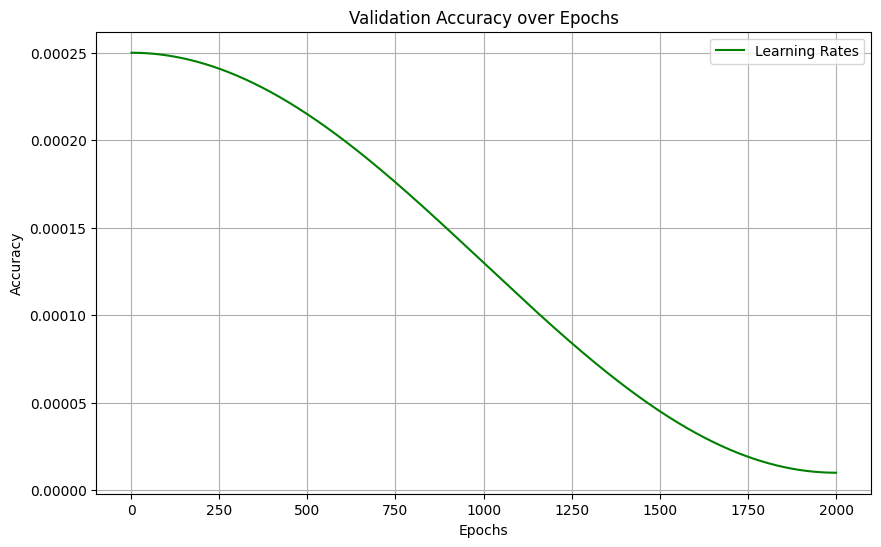

Model for bin 32 saved to GATModels-5A_exp5ME/Models/model_bin_32.pth
Attention weights for bin 32 saved to GATModels-5A_exp5ME/Weights/attn_bin_32.pt
Training on bin 33/50
Bin 33, Epoch 1/2000, Train Loss: 0.7106, Validation Loss: 0.7183,  ValAccuracy: 0.2175, LR: 0.000250
Bin 33, Epoch 501/2000, Train Loss: 0.3580, Validation Loss: 0.3406,  ValAccuracy: 0.8729, LR: 0.000215
Bin 33, Epoch 1001/2000, Train Loss: 0.3310, Validation Loss: 0.3052,  ValAccuracy: 0.8785, LR: 0.000130
Bin 33, Epoch 1501/2000, Train Loss: 0.3279, Validation Loss: 0.2958,  ValAccuracy: 0.8842, LR: 0.000045


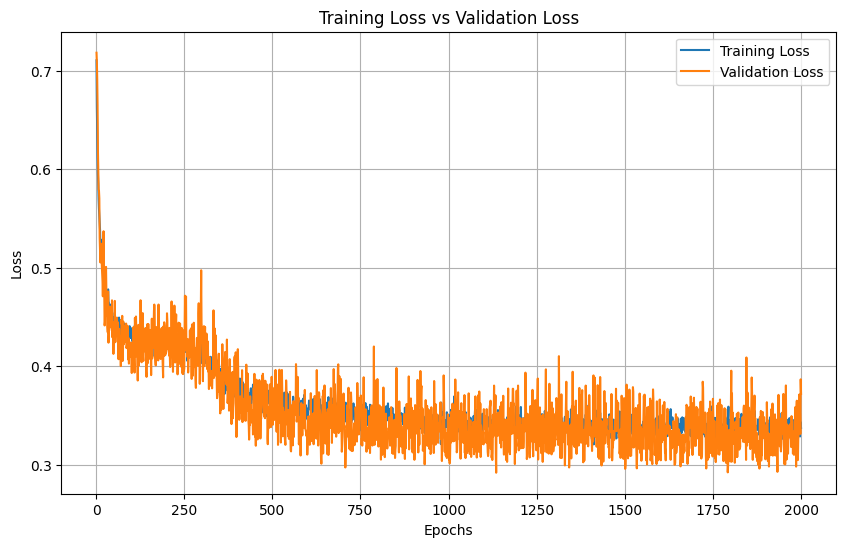

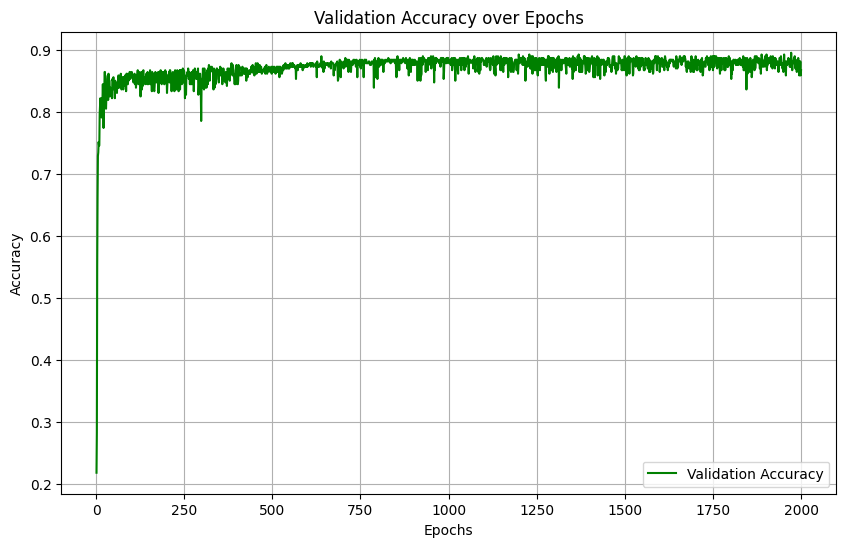

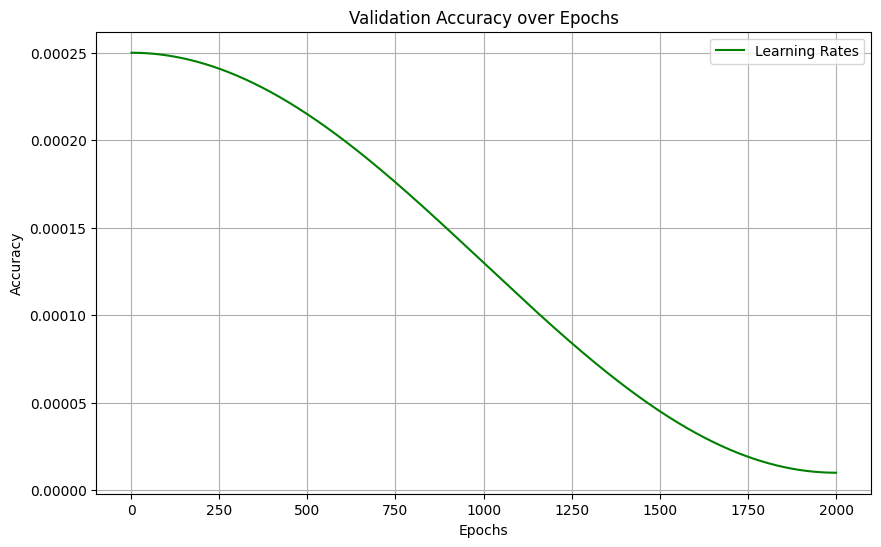

Model for bin 33 saved to GATModels-5A_exp5ME/Models/model_bin_33.pth
Attention weights for bin 33 saved to GATModels-5A_exp5ME/Weights/attn_bin_33.pt
Training on bin 34/50
Bin 34, Epoch 1/2000, Train Loss: 0.6929, Validation Loss: 0.7186,  ValAccuracy: 0.2175, LR: 0.000250
Bin 34, Epoch 501/2000, Train Loss: 0.3834, Validation Loss: 0.4376,  ValAccuracy: 0.8588, LR: 0.000215
Bin 34, Epoch 1001/2000, Train Loss: 0.3663, Validation Loss: 0.4256,  ValAccuracy: 0.8672, LR: 0.000130
Bin 34, Epoch 1501/2000, Train Loss: 0.3662, Validation Loss: 0.4110,  ValAccuracy: 0.8701, LR: 0.000045


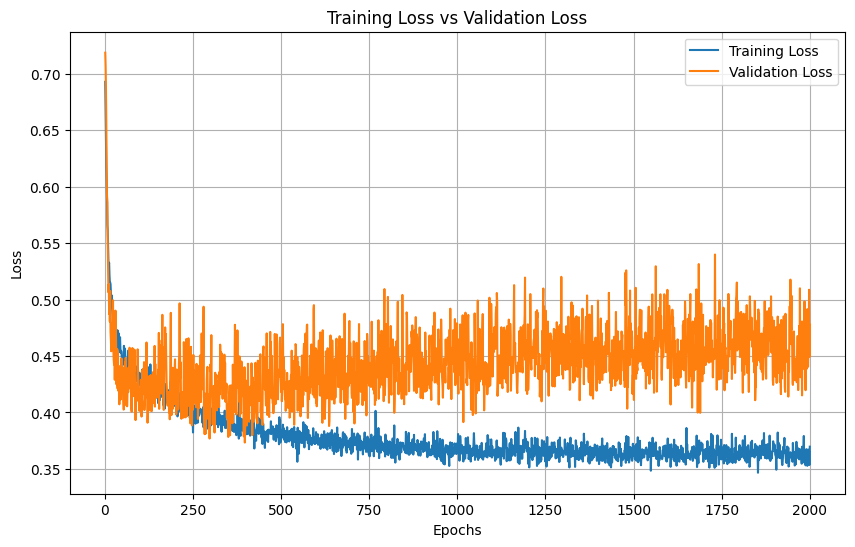

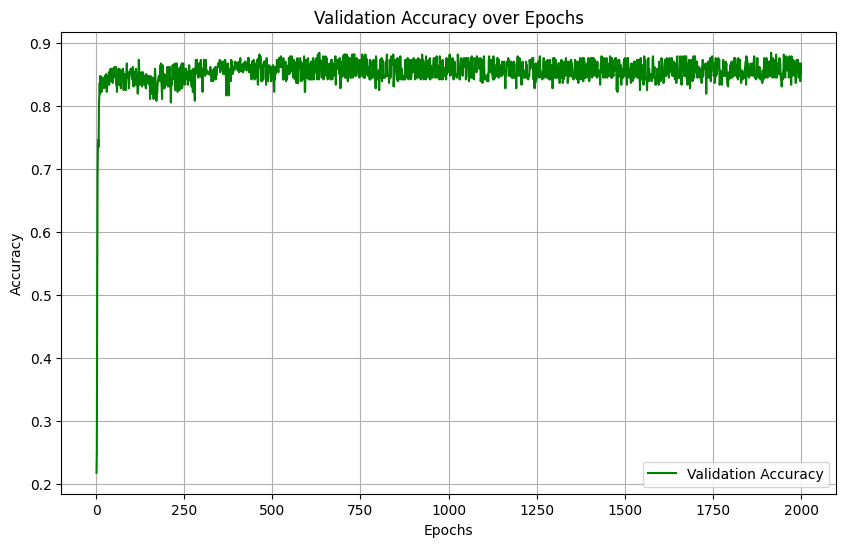

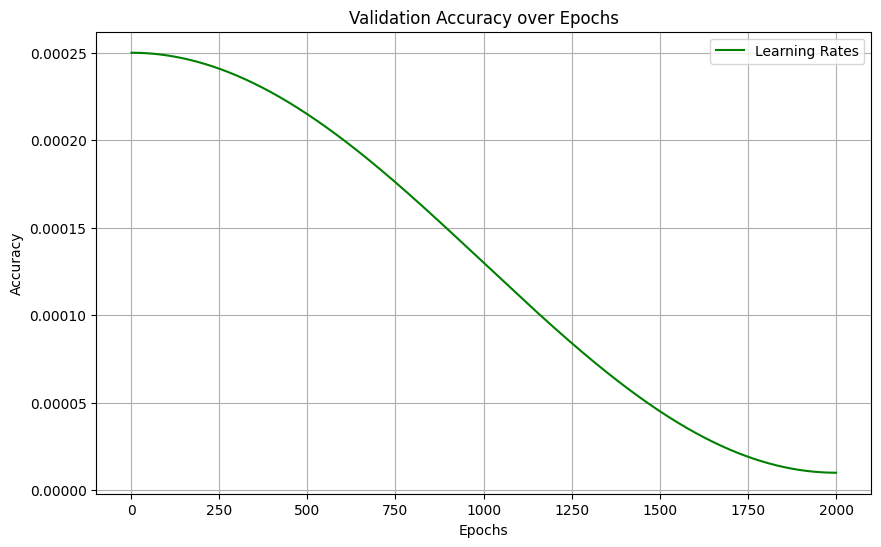

Model for bin 34 saved to GATModels-5A_exp5ME/Models/model_bin_34.pth
Attention weights for bin 34 saved to GATModels-5A_exp5ME/Weights/attn_bin_34.pt
Training on bin 35/50
Bin 35, Epoch 1/2000, Train Loss: 0.7250, Validation Loss: 0.7239,  ValAccuracy: 0.2203, LR: 0.000250
Bin 35, Epoch 501/2000, Train Loss: 0.3422, Validation Loss: 0.3472,  ValAccuracy: 0.8701, LR: 0.000215
Bin 35, Epoch 1001/2000, Train Loss: 0.3145, Validation Loss: 0.3100,  ValAccuracy: 0.8785, LR: 0.000130
Bin 35, Epoch 1501/2000, Train Loss: 0.3179, Validation Loss: 0.2997,  ValAccuracy: 0.8927, LR: 0.000045


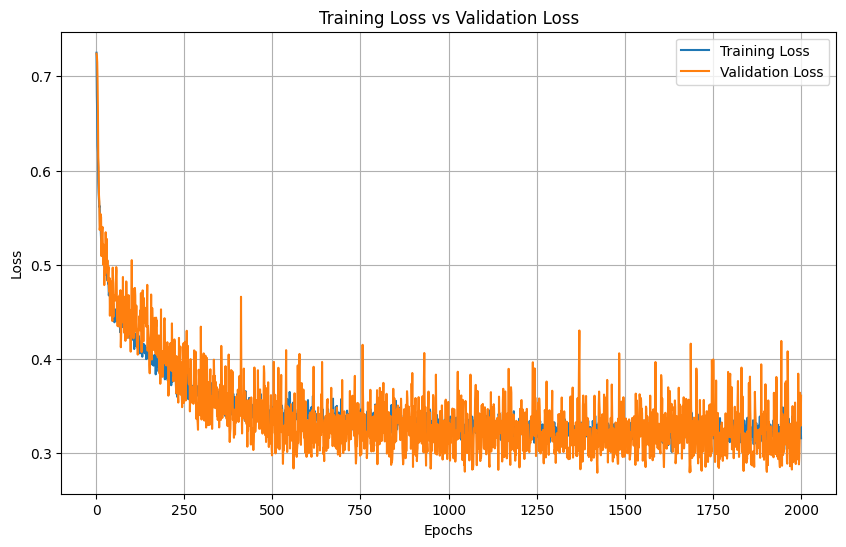

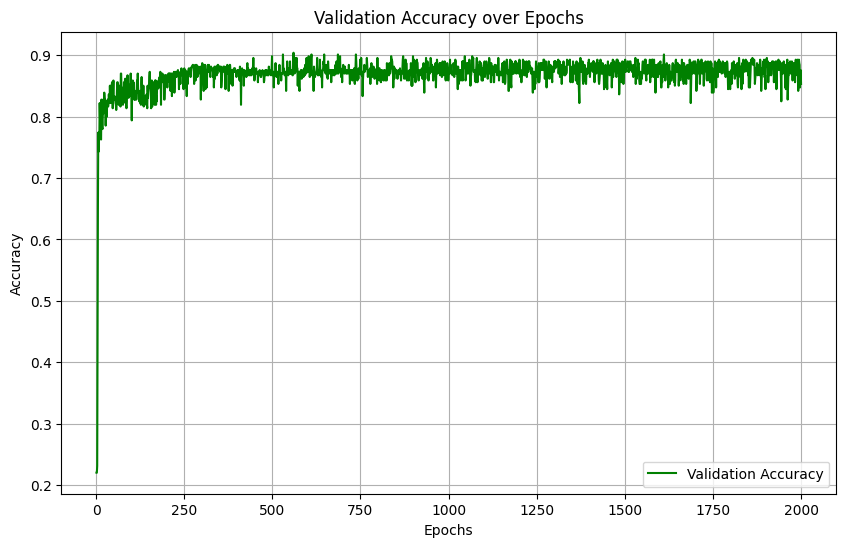

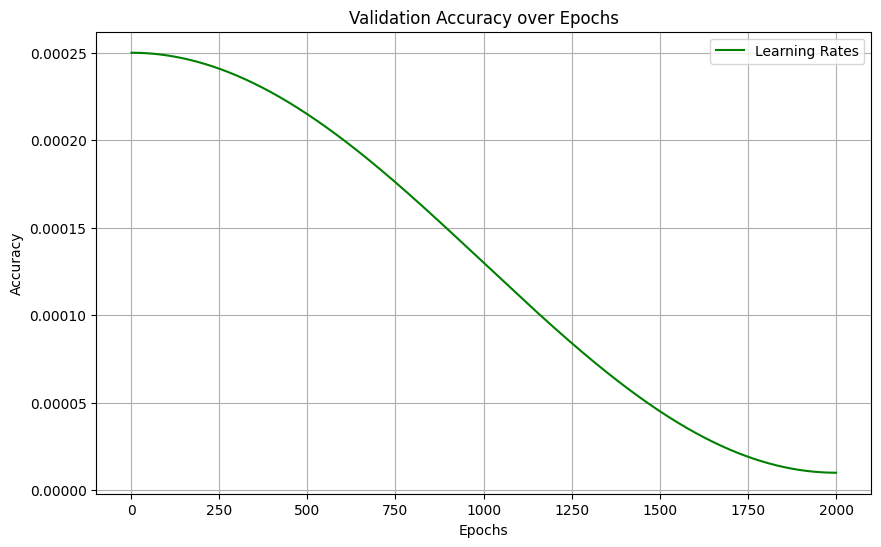

Model for bin 35 saved to GATModels-5A_exp5ME/Models/model_bin_35.pth
Attention weights for bin 35 saved to GATModels-5A_exp5ME/Weights/attn_bin_35.pt
Training on bin 36/50
Bin 36, Epoch 1/2000, Train Loss: 0.6608, Validation Loss: 0.6887,  ValAccuracy: 0.6638, LR: 0.000250
Bin 36, Epoch 501/2000, Train Loss: 0.4206, Validation Loss: 0.3492,  ValAccuracy: 0.8870, LR: 0.000215
Bin 36, Epoch 1001/2000, Train Loss: 0.4023, Validation Loss: 0.3553,  ValAccuracy: 0.8814, LR: 0.000130
Bin 36, Epoch 1501/2000, Train Loss: 0.3871, Validation Loss: 0.3819,  ValAccuracy: 0.8559, LR: 0.000045


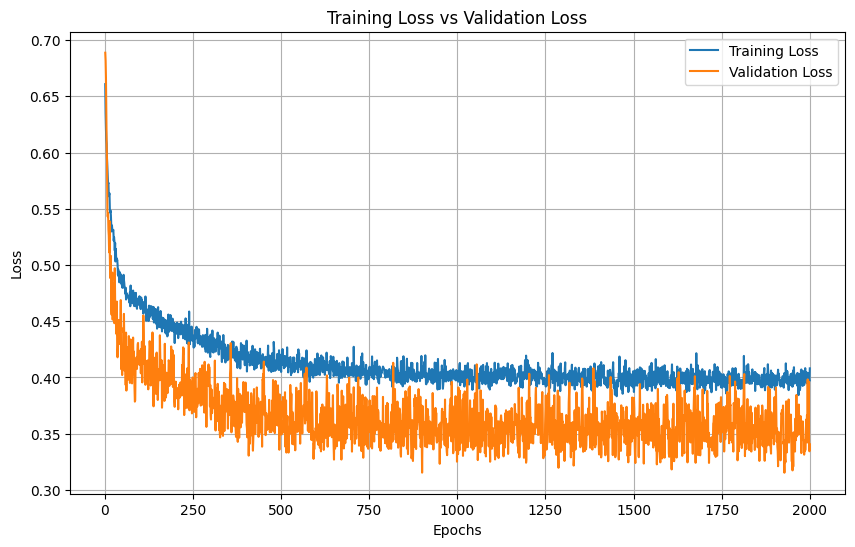

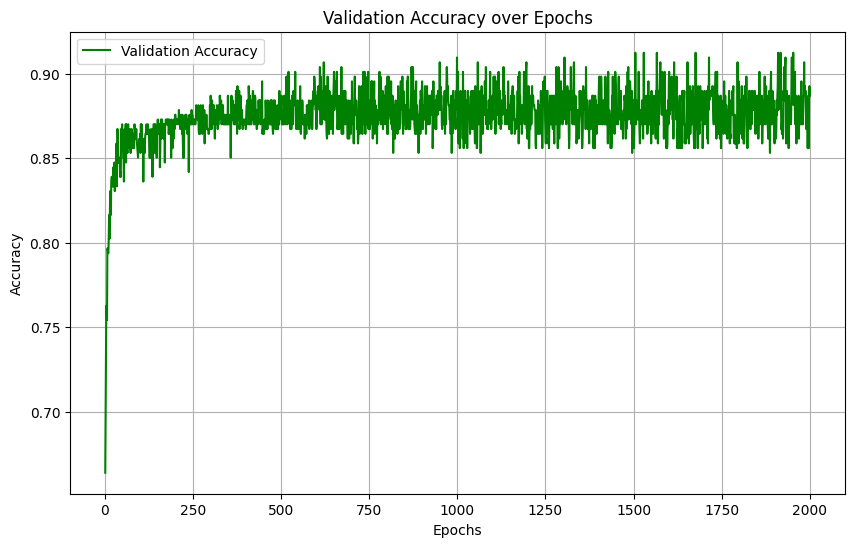

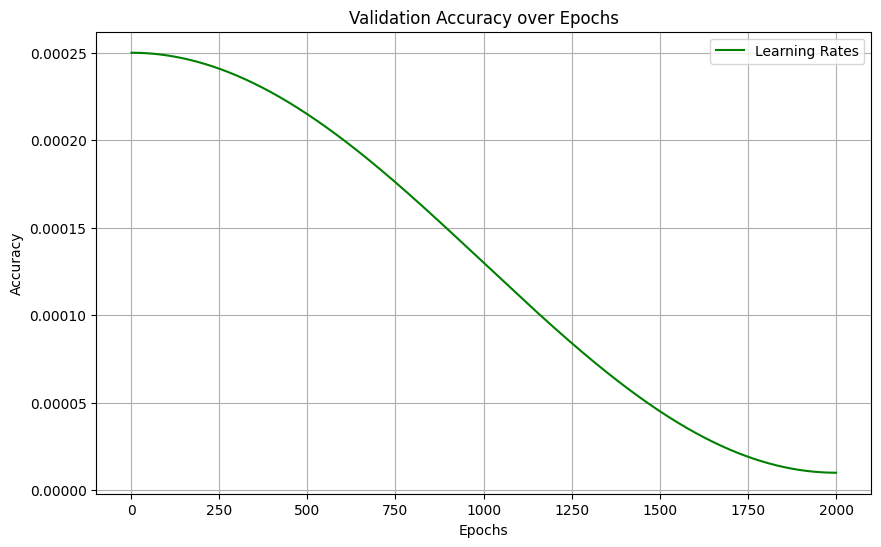

Model for bin 36 saved to GATModels-5A_exp5ME/Models/model_bin_36.pth
Attention weights for bin 36 saved to GATModels-5A_exp5ME/Weights/attn_bin_36.pt
Training on bin 37/50
Bin 37, Epoch 1/2000, Train Loss: 0.6713, Validation Loss: 0.7366,  ValAccuracy: 0.2175, LR: 0.000250
Bin 37, Epoch 501/2000, Train Loss: 0.3621, Validation Loss: 0.3202,  ValAccuracy: 0.8842, LR: 0.000215
Bin 37, Epoch 1001/2000, Train Loss: 0.3453, Validation Loss: 0.3472,  ValAccuracy: 0.8757, LR: 0.000130
Bin 37, Epoch 1501/2000, Train Loss: 0.3356, Validation Loss: 0.3400,  ValAccuracy: 0.8757, LR: 0.000045


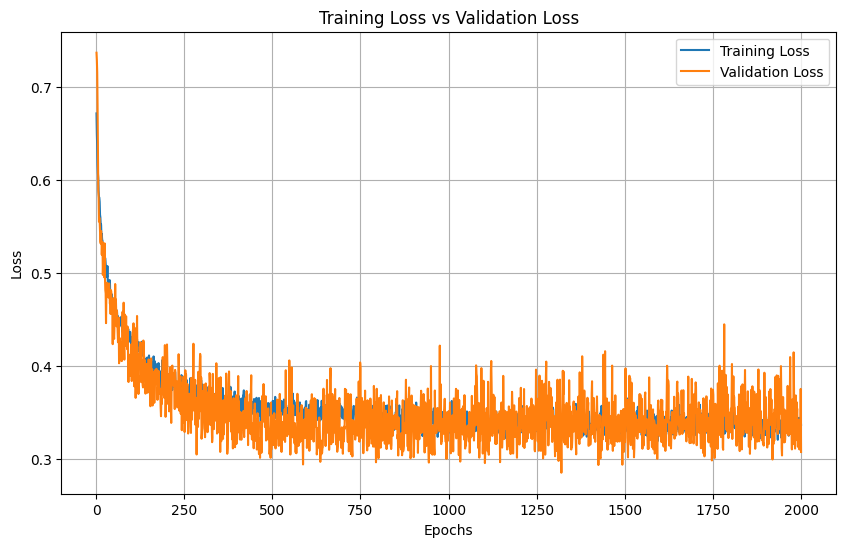

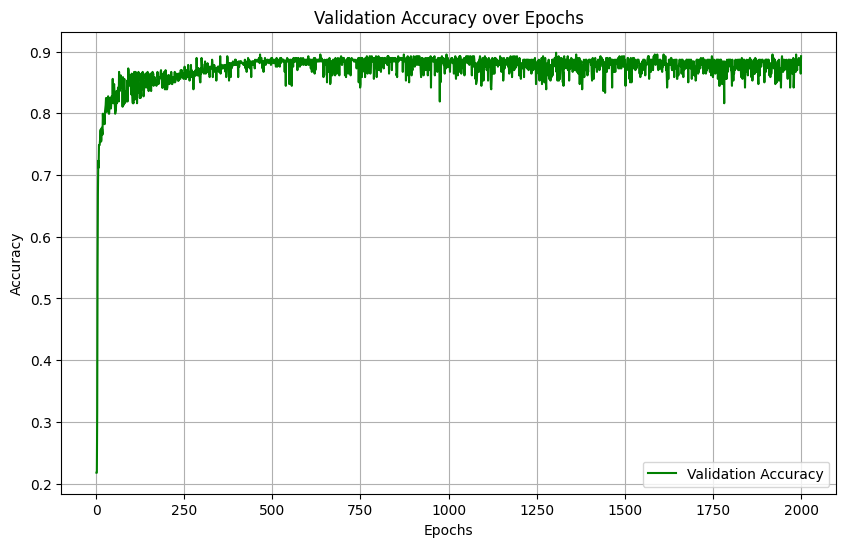

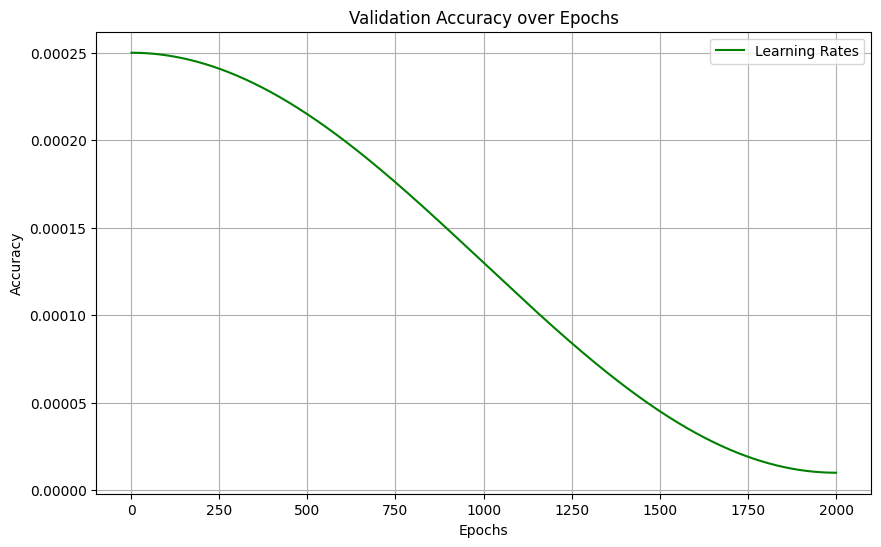

Model for bin 37 saved to GATModels-5A_exp5ME/Models/model_bin_37.pth
Attention weights for bin 37 saved to GATModels-5A_exp5ME/Weights/attn_bin_37.pt
Training on bin 38/50
Bin 38, Epoch 1/2000, Train Loss: 0.6898, Validation Loss: 0.7383,  ValAccuracy: 0.2175, LR: 0.000250
Bin 38, Epoch 501/2000, Train Loss: 0.3739, Validation Loss: 0.3504,  ValAccuracy: 0.8870, LR: 0.000215
Bin 38, Epoch 1001/2000, Train Loss: 0.3752, Validation Loss: 0.3738,  ValAccuracy: 0.8588, LR: 0.000130
Bin 38, Epoch 1501/2000, Train Loss: 0.3624, Validation Loss: 0.3592,  ValAccuracy: 0.8785, LR: 0.000045


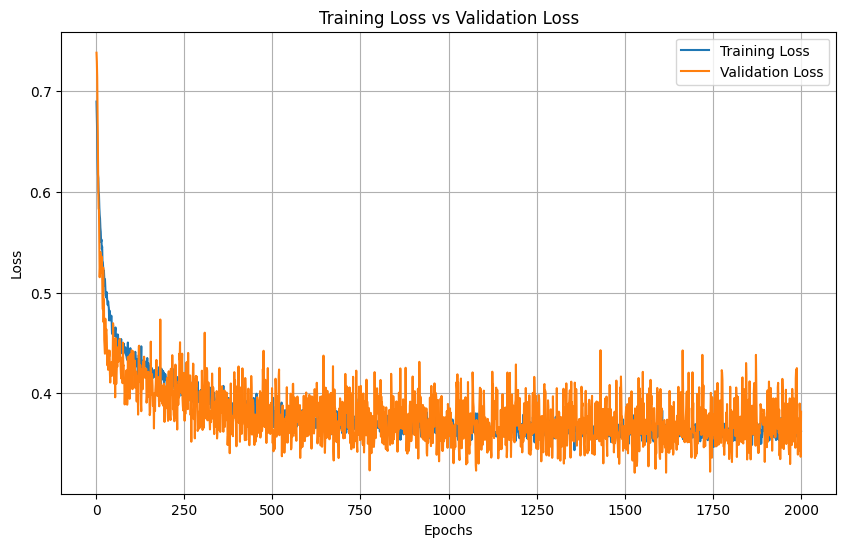

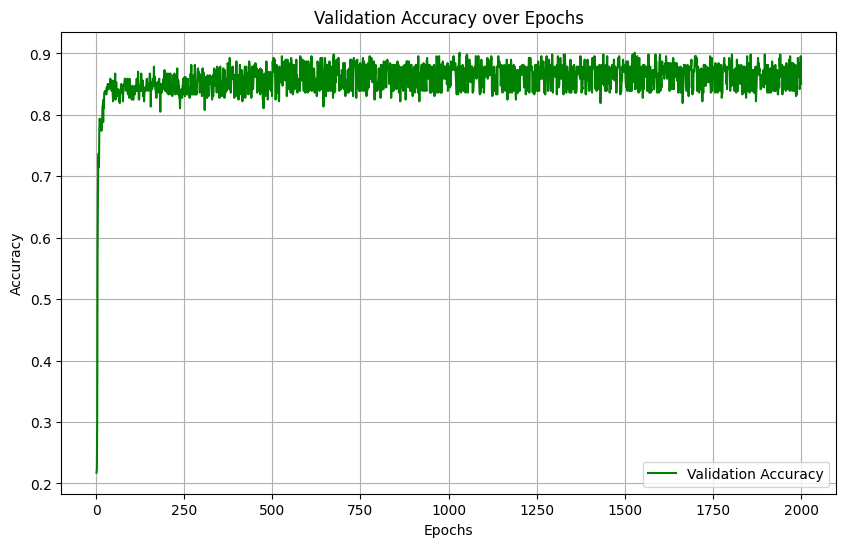

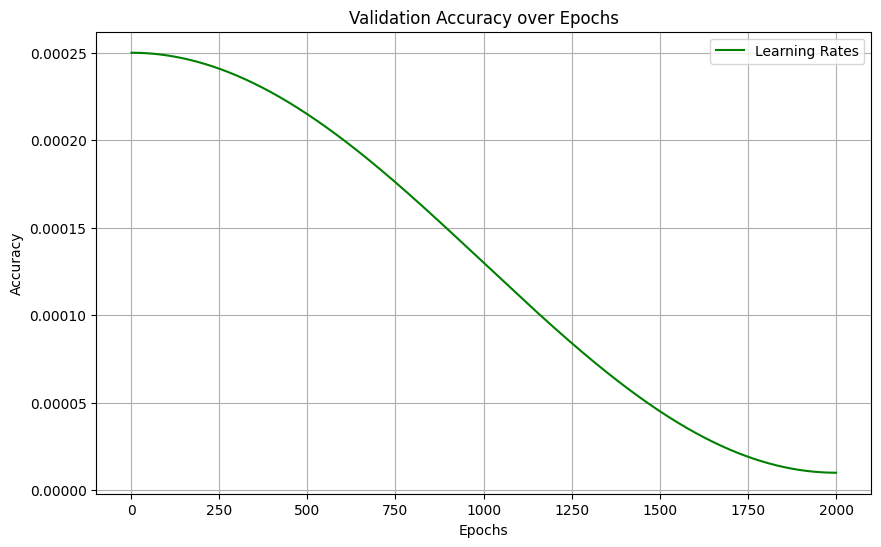

Model for bin 38 saved to GATModels-5A_exp5ME/Models/model_bin_38.pth
Attention weights for bin 38 saved to GATModels-5A_exp5ME/Weights/attn_bin_38.pt
Training on bin 39/50
Bin 39, Epoch 1/2000, Train Loss: 0.8402, Validation Loss: 0.7087,  ValAccuracy: 0.1893, LR: 0.000250
Bin 39, Epoch 501/2000, Train Loss: 0.3847, Validation Loss: 0.3943,  ValAccuracy: 0.8701, LR: 0.000215
Bin 39, Epoch 1001/2000, Train Loss: 0.3631, Validation Loss: 0.4237,  ValAccuracy: 0.8446, LR: 0.000130
Bin 39, Epoch 1501/2000, Train Loss: 0.3742, Validation Loss: 0.3807,  ValAccuracy: 0.8814, LR: 0.000045


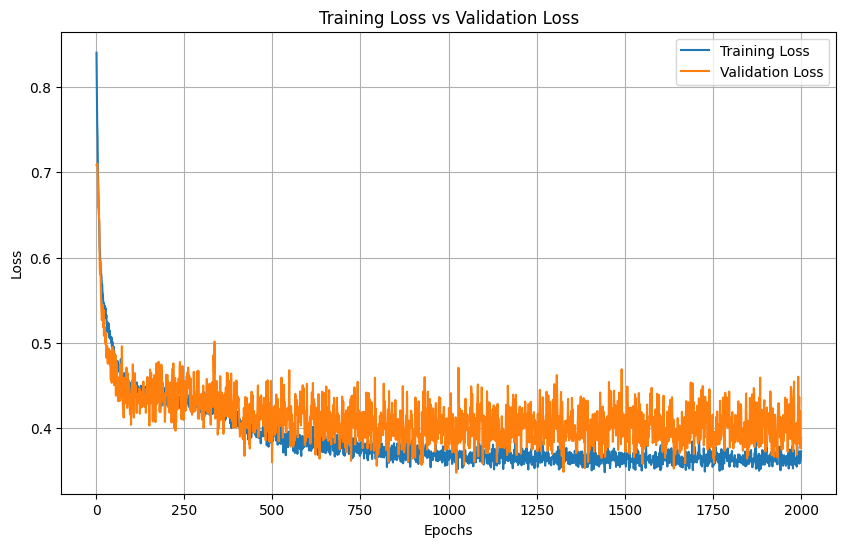

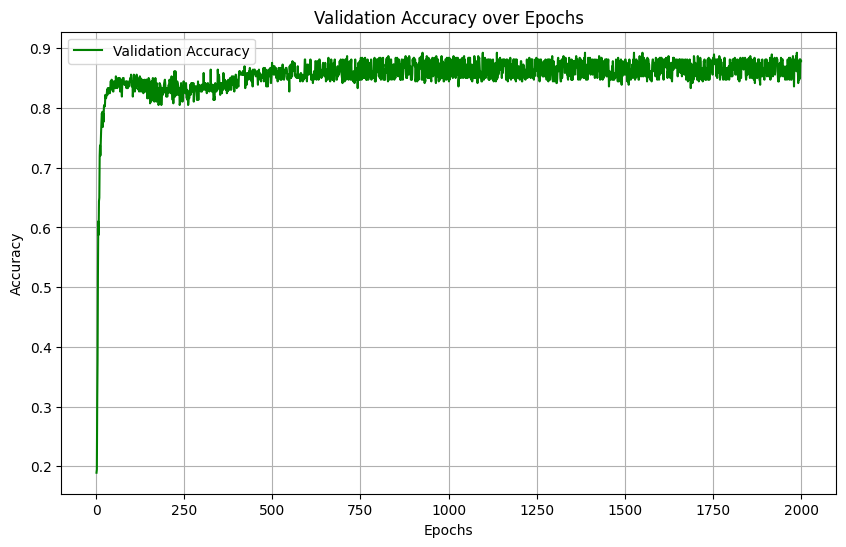

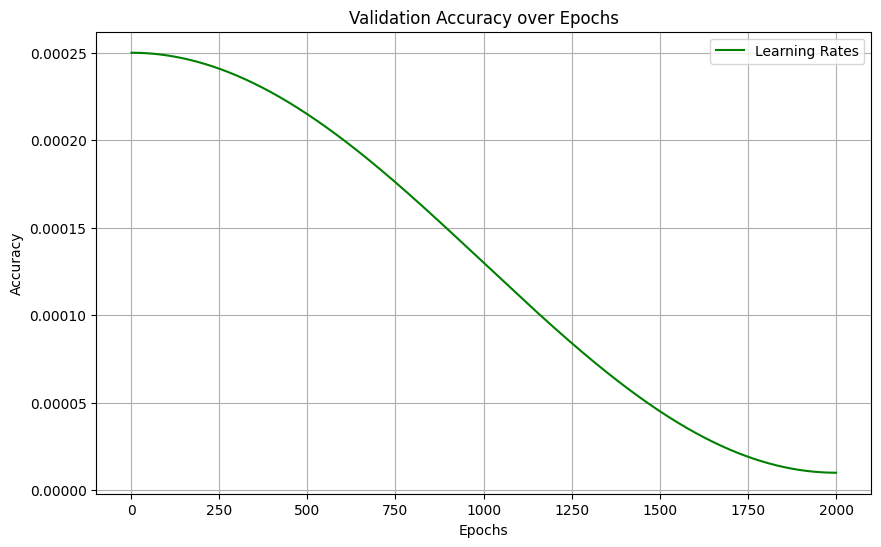

Model for bin 39 saved to GATModels-5A_exp5ME/Models/model_bin_39.pth
Attention weights for bin 39 saved to GATModels-5A_exp5ME/Weights/attn_bin_39.pt
Training on bin 40/50
Bin 40, Epoch 1/2000, Train Loss: 0.6981, Validation Loss: 0.7335,  ValAccuracy: 0.2175, LR: 0.000250
Bin 40, Epoch 501/2000, Train Loss: 0.4322, Validation Loss: 0.4280,  ValAccuracy: 0.8362, LR: 0.000215
Bin 40, Epoch 1001/2000, Train Loss: 0.4184, Validation Loss: 0.4721,  ValAccuracy: 0.7966, LR: 0.000130
Bin 40, Epoch 1501/2000, Train Loss: 0.3995, Validation Loss: 0.3843,  ValAccuracy: 0.8701, LR: 0.000045


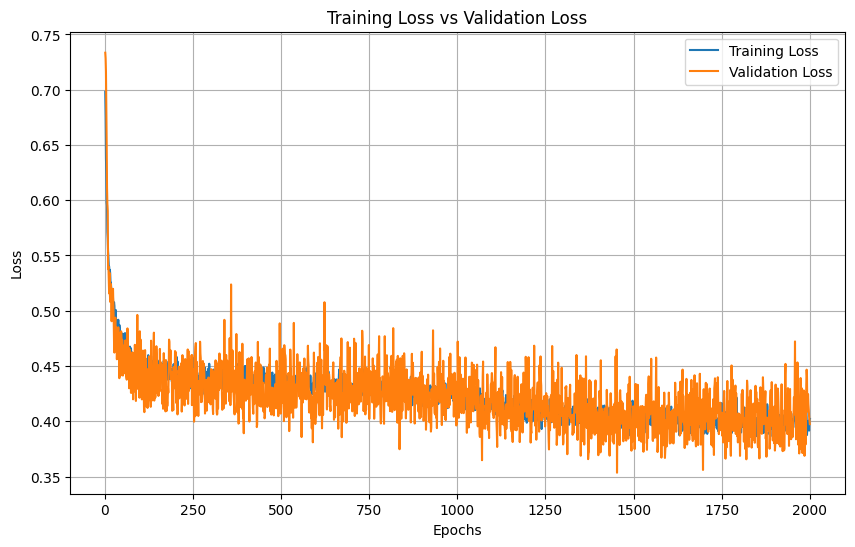

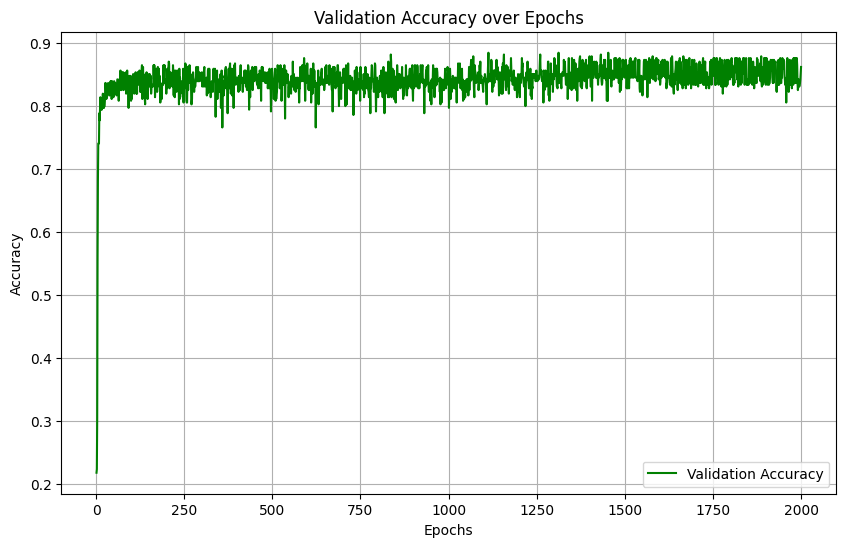

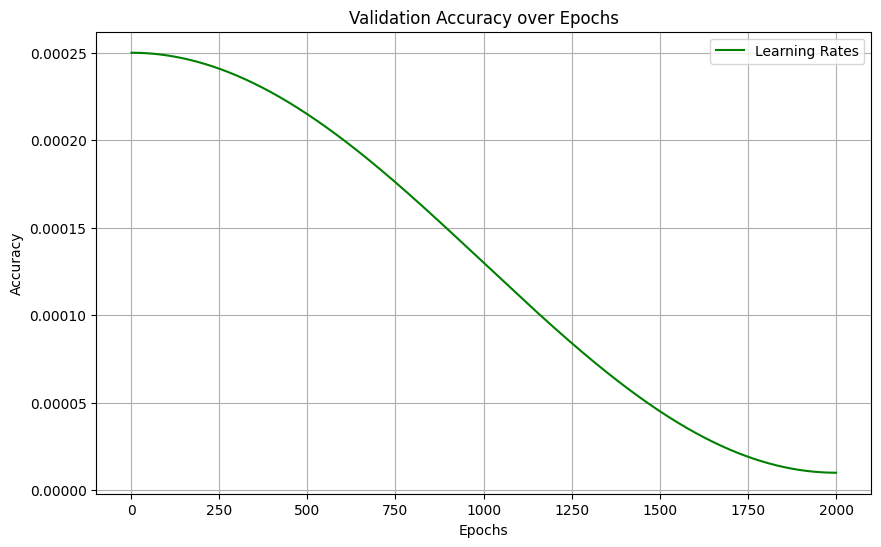

Model for bin 40 saved to GATModels-5A_exp5ME/Models/model_bin_40.pth
Attention weights for bin 40 saved to GATModels-5A_exp5ME/Weights/attn_bin_40.pt
Training on bin 41/50
Bin 41, Epoch 1/2000, Train Loss: 0.7466, Validation Loss: 0.7068,  ValAccuracy: 0.2119, LR: 0.000250
Bin 41, Epoch 501/2000, Train Loss: 0.4059, Validation Loss: 0.4144,  ValAccuracy: 0.8559, LR: 0.000215
Bin 41, Epoch 1001/2000, Train Loss: 0.4039, Validation Loss: 0.4154,  ValAccuracy: 0.8531, LR: 0.000130
Bin 41, Epoch 1501/2000, Train Loss: 0.3990, Validation Loss: 0.4310,  ValAccuracy: 0.8475, LR: 0.000045


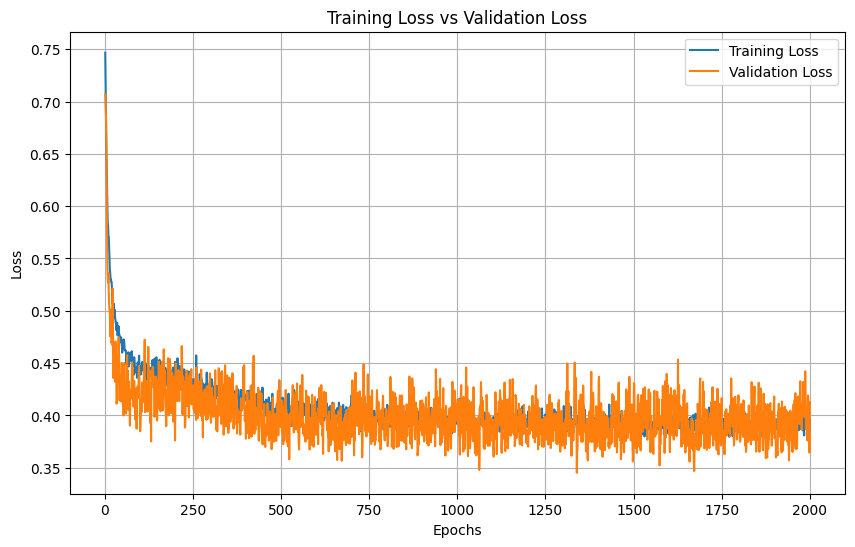

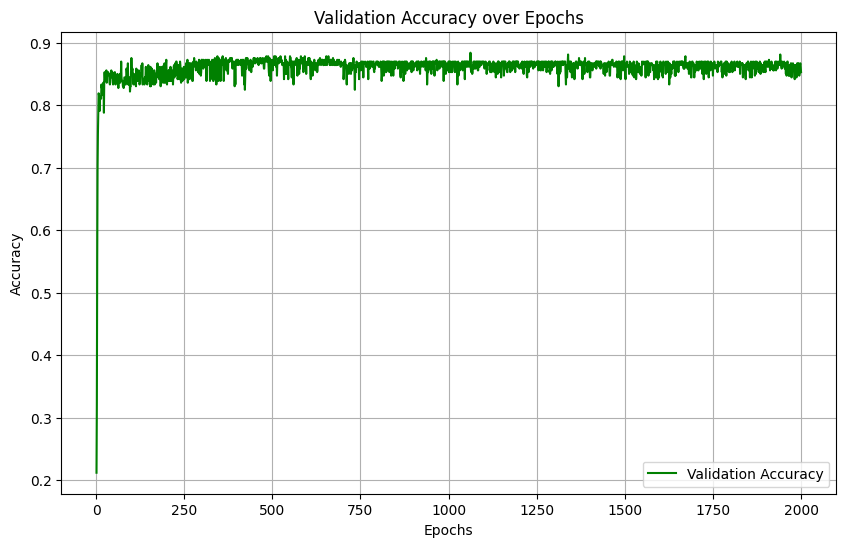

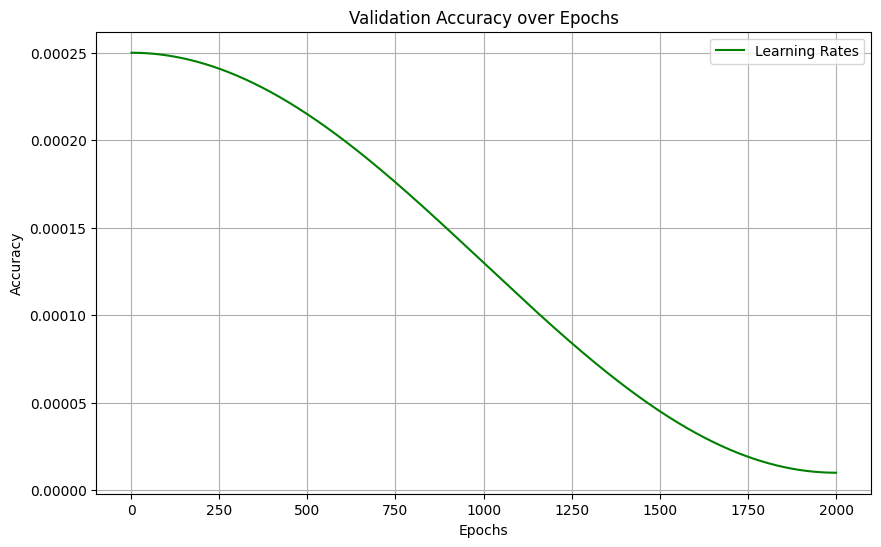

Model for bin 41 saved to GATModels-5A_exp5ME/Models/model_bin_41.pth
Attention weights for bin 41 saved to GATModels-5A_exp5ME/Weights/attn_bin_41.pt
Training on bin 42/50
Bin 42, Epoch 1/2000, Train Loss: 0.8088, Validation Loss: 0.6854,  ValAccuracy: 0.7514, LR: 0.000250
Bin 42, Epoch 501/2000, Train Loss: 0.3576, Validation Loss: 0.4369,  ValAccuracy: 0.8390, LR: 0.000215
Bin 42, Epoch 1001/2000, Train Loss: 0.3623, Validation Loss: 0.4746,  ValAccuracy: 0.8277, LR: 0.000130
Bin 42, Epoch 1501/2000, Train Loss: 0.3575, Validation Loss: 0.3968,  ValAccuracy: 0.8701, LR: 0.000045


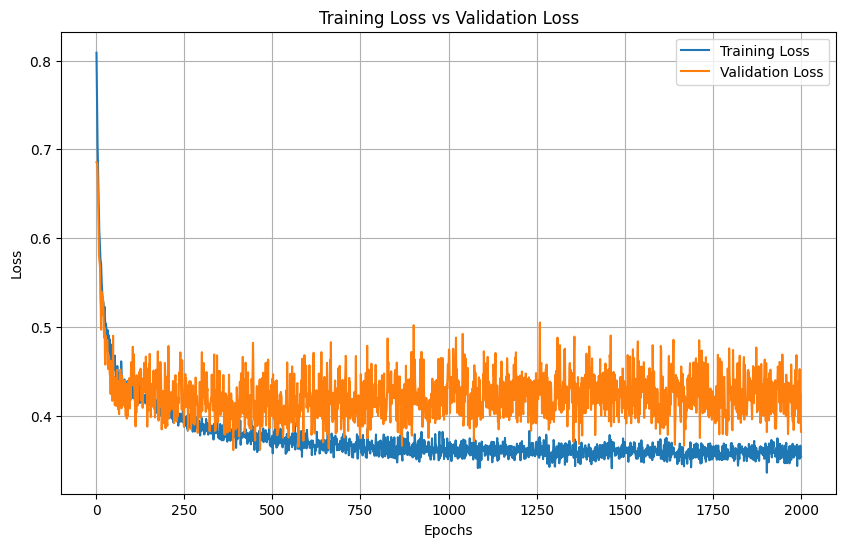

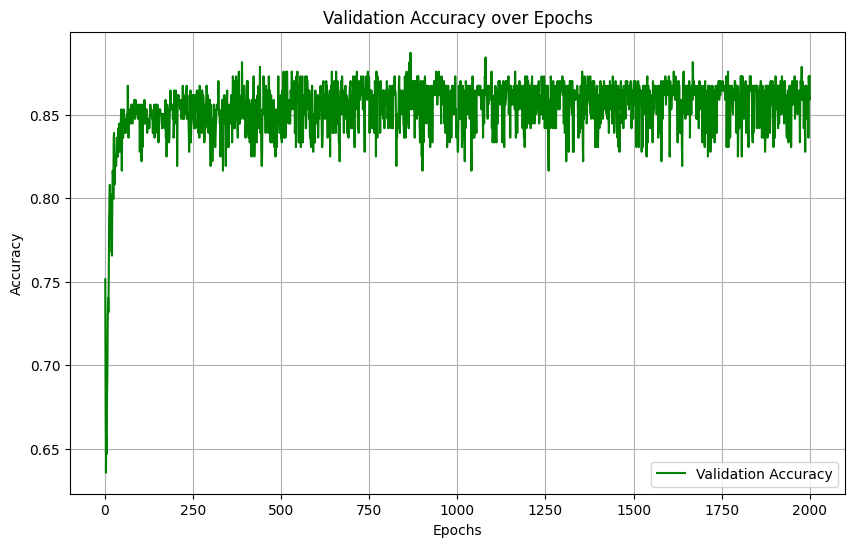

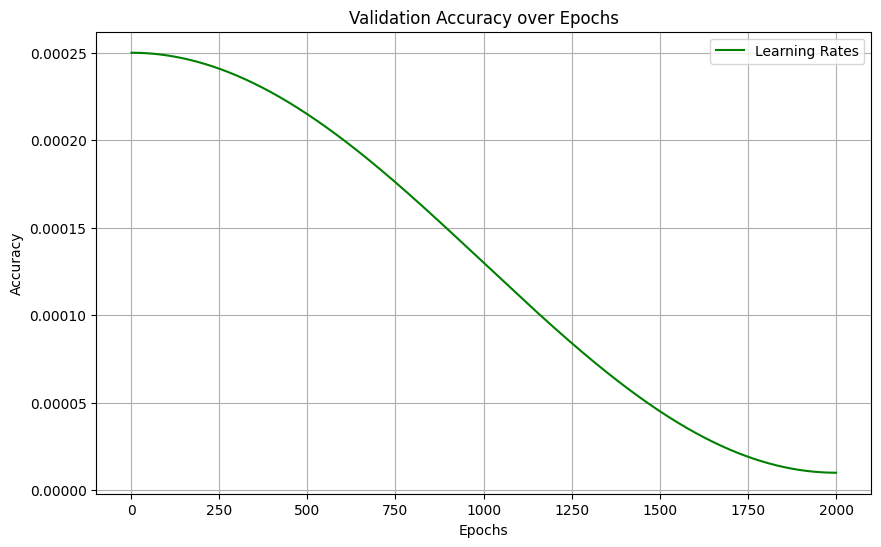

Model for bin 42 saved to GATModels-5A_exp5ME/Models/model_bin_42.pth
Attention weights for bin 42 saved to GATModels-5A_exp5ME/Weights/attn_bin_42.pt
Training on bin 43/50
Bin 43, Epoch 1/2000, Train Loss: 0.7252, Validation Loss: 0.6867,  ValAccuracy: 0.7514, LR: 0.000250
Bin 43, Epoch 501/2000, Train Loss: 0.4012, Validation Loss: 0.3831,  ValAccuracy: 0.8616, LR: 0.000215
Bin 43, Epoch 1001/2000, Train Loss: 0.3897, Validation Loss: 0.4131,  ValAccuracy: 0.8672, LR: 0.000130
Bin 43, Epoch 1501/2000, Train Loss: 0.3784, Validation Loss: 0.4188,  ValAccuracy: 0.8672, LR: 0.000045


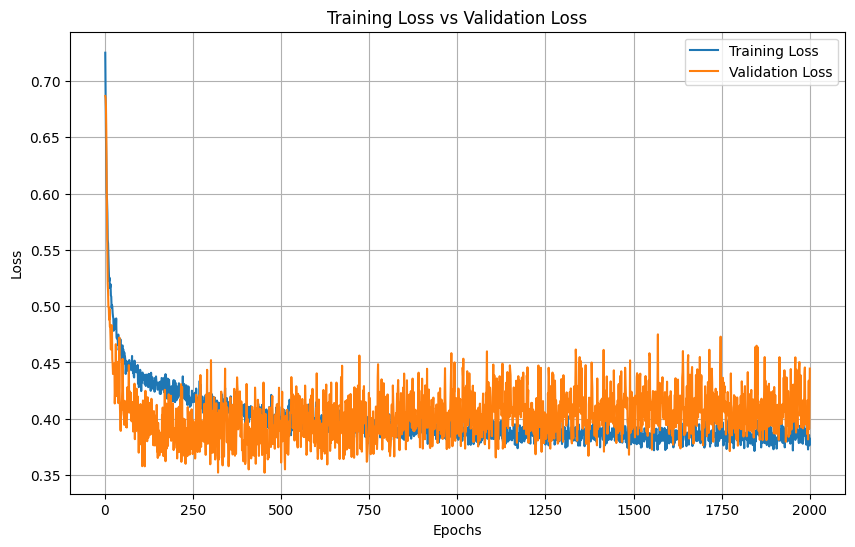

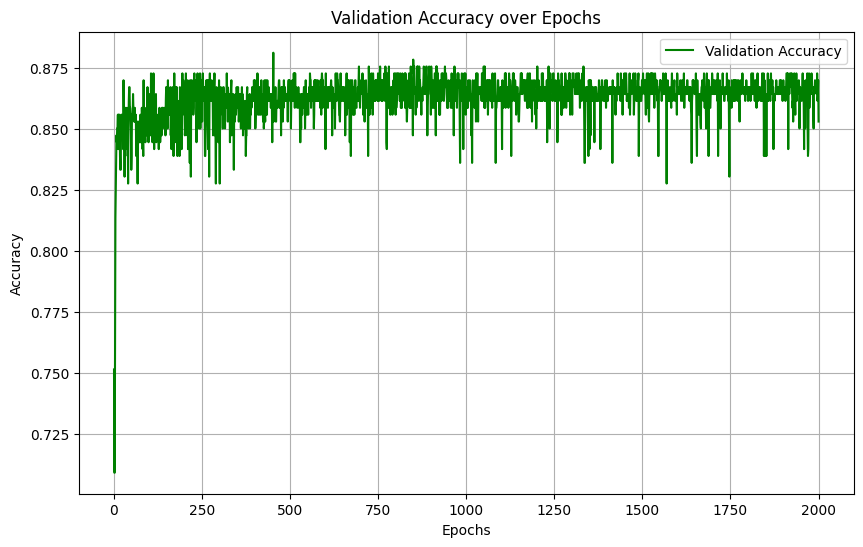

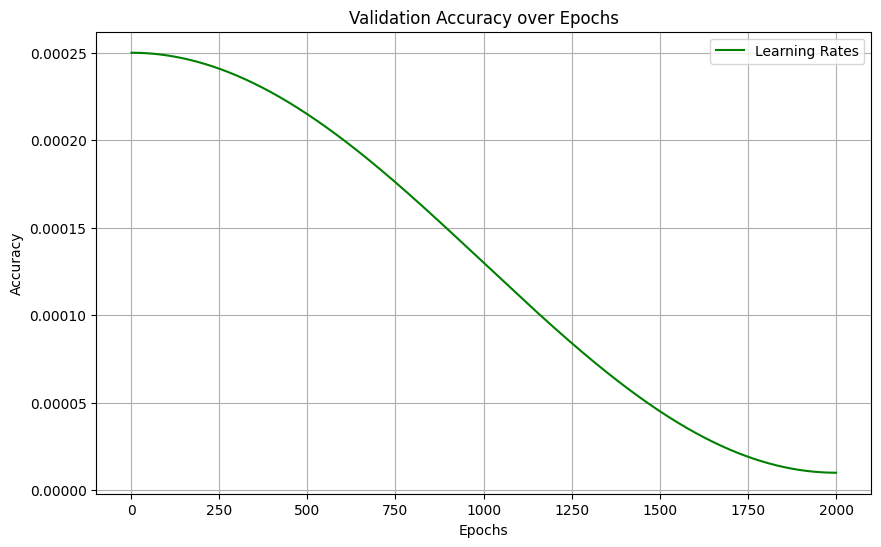

Model for bin 43 saved to GATModels-5A_exp5ME/Models/model_bin_43.pth
Attention weights for bin 43 saved to GATModels-5A_exp5ME/Weights/attn_bin_43.pt
Training on bin 44/50
Bin 44, Epoch 1/2000, Train Loss: 0.6223, Validation Loss: 0.6750,  ValAccuracy: 0.7910, LR: 0.000250
Bin 44, Epoch 501/2000, Train Loss: 0.3747, Validation Loss: 0.3669,  ValAccuracy: 0.8644, LR: 0.000215
Bin 44, Epoch 1001/2000, Train Loss: 0.3496, Validation Loss: 0.4360,  ValAccuracy: 0.8616, LR: 0.000130
Bin 44, Epoch 1501/2000, Train Loss: 0.3469, Validation Loss: 0.3892,  ValAccuracy: 0.8644, LR: 0.000045


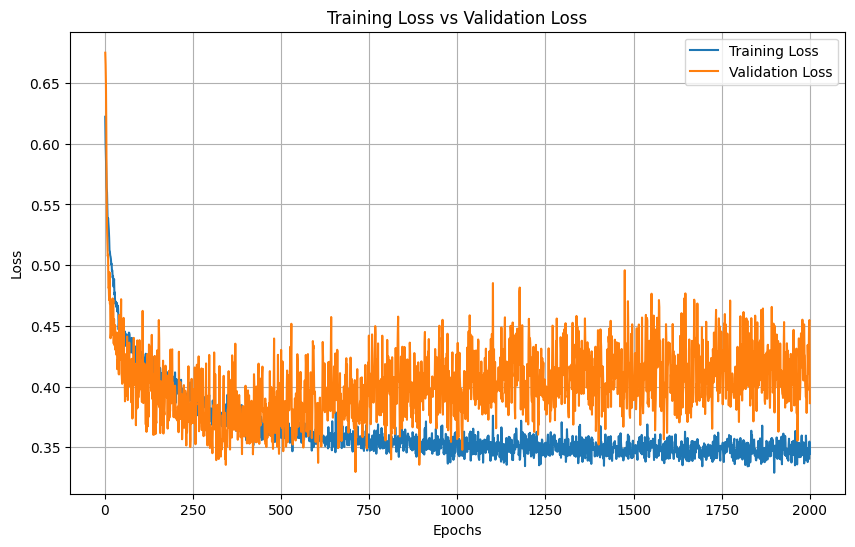

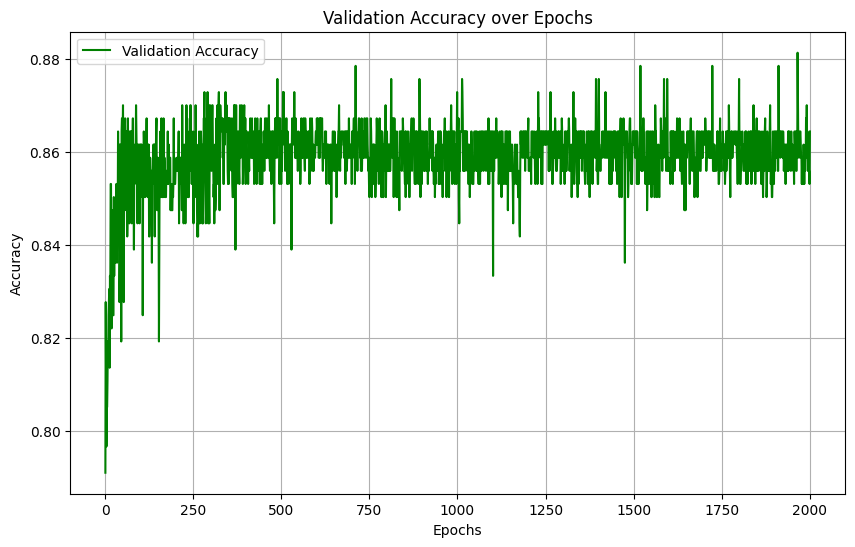

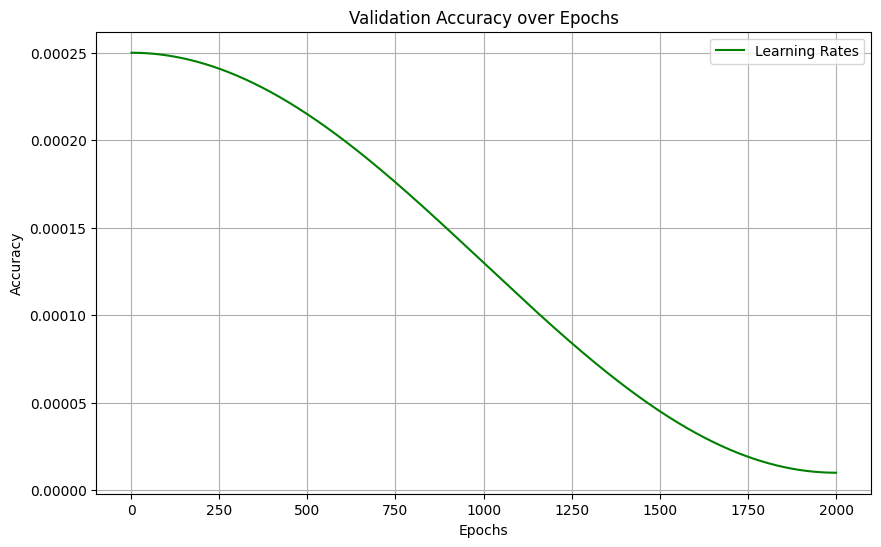

Model for bin 44 saved to GATModels-5A_exp5ME/Models/model_bin_44.pth
Attention weights for bin 44 saved to GATModels-5A_exp5ME/Weights/attn_bin_44.pt
Training on bin 45/50
Bin 45, Epoch 1/2000, Train Loss: 0.6800, Validation Loss: 0.6489,  ValAccuracy: 0.7797, LR: 0.000250
Bin 45, Epoch 501/2000, Train Loss: 0.4090, Validation Loss: 0.4435,  ValAccuracy: 0.8305, LR: 0.000215
Bin 45, Epoch 1001/2000, Train Loss: 0.3475, Validation Loss: 0.3370,  ValAccuracy: 0.8588, LR: 0.000130
Bin 45, Epoch 1501/2000, Train Loss: 0.3524, Validation Loss: 0.3105,  ValAccuracy: 0.8785, LR: 0.000045


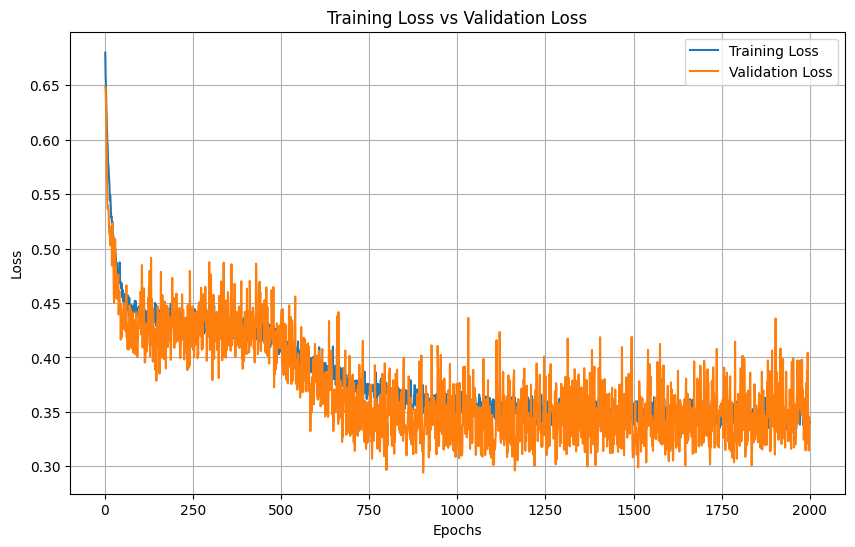

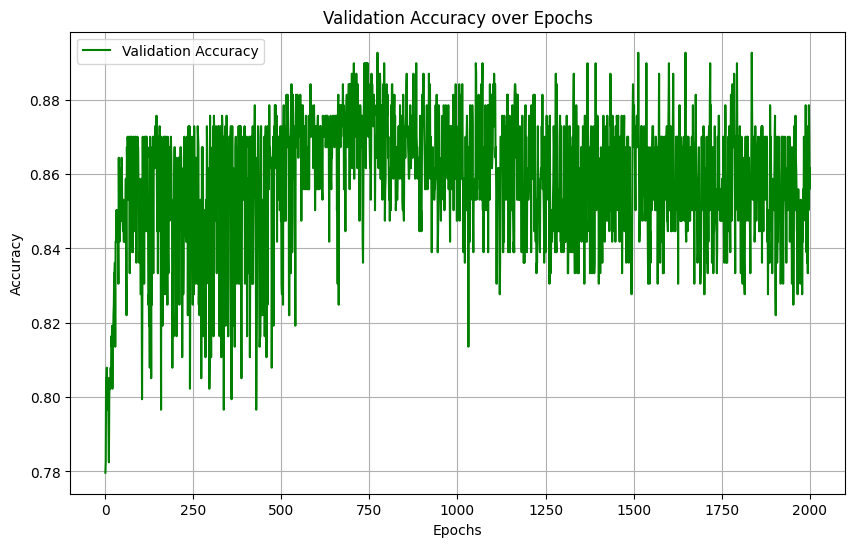

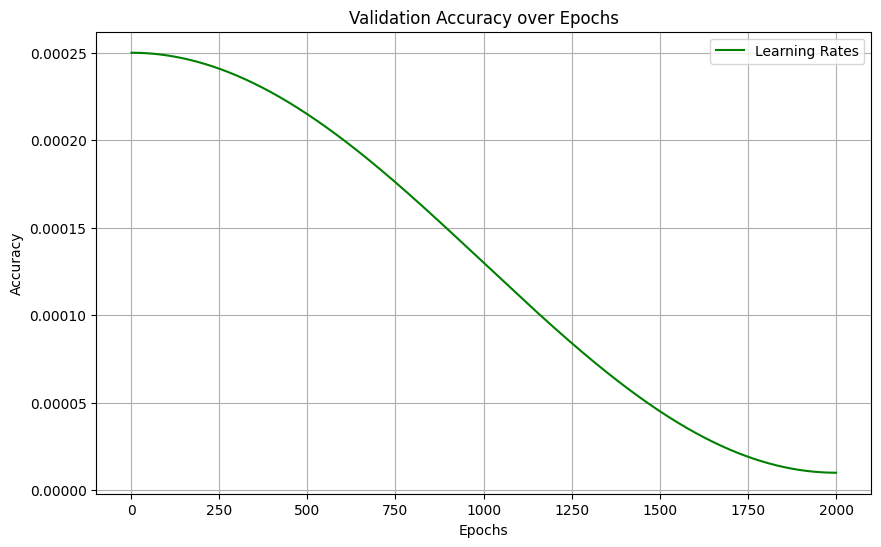

Model for bin 45 saved to GATModels-5A_exp5ME/Models/model_bin_45.pth
Attention weights for bin 45 saved to GATModels-5A_exp5ME/Weights/attn_bin_45.pt
Training on bin 46/50
Bin 46, Epoch 1/2000, Train Loss: 0.6841, Validation Loss: 0.7186,  ValAccuracy: 0.2175, LR: 0.000250
Bin 46, Epoch 501/2000, Train Loss: 0.3147, Validation Loss: 0.3296,  ValAccuracy: 0.8616, LR: 0.000215
Bin 46, Epoch 1001/2000, Train Loss: 0.3203, Validation Loss: 0.3470,  ValAccuracy: 0.8616, LR: 0.000130
Bin 46, Epoch 1501/2000, Train Loss: 0.3071, Validation Loss: 0.3459,  ValAccuracy: 0.8588, LR: 0.000045


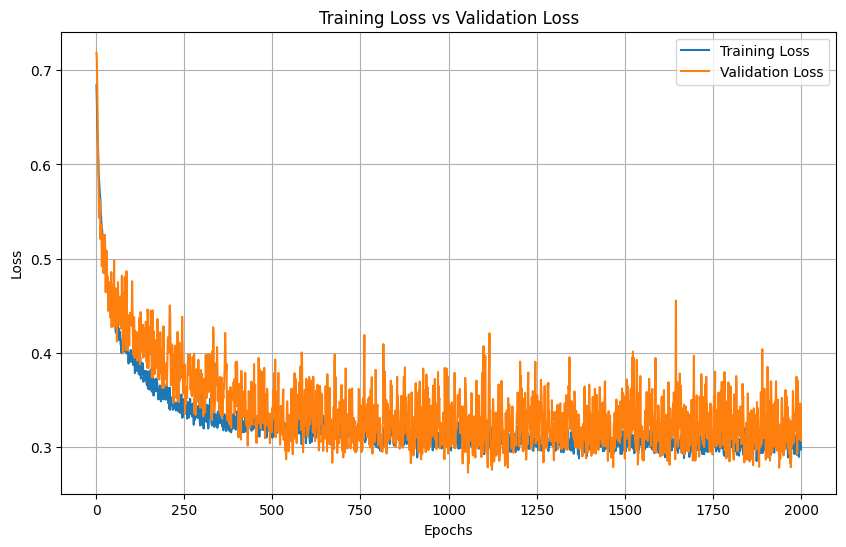

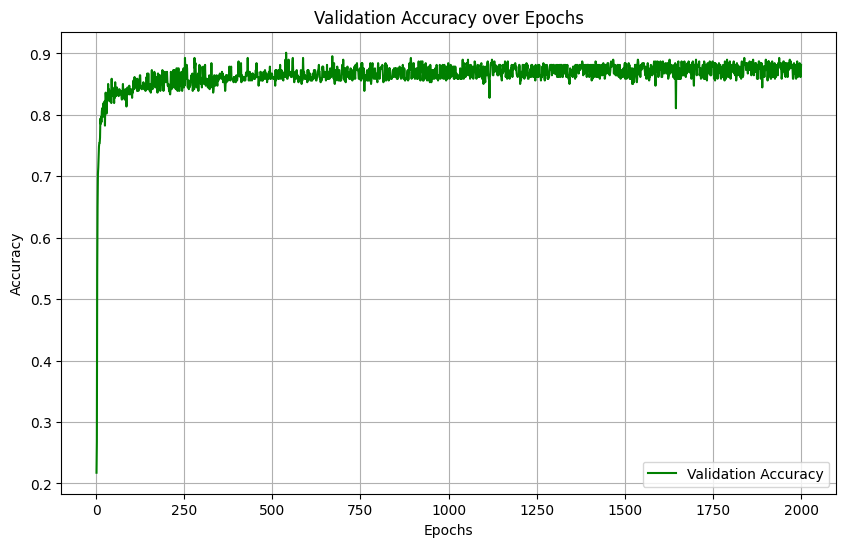

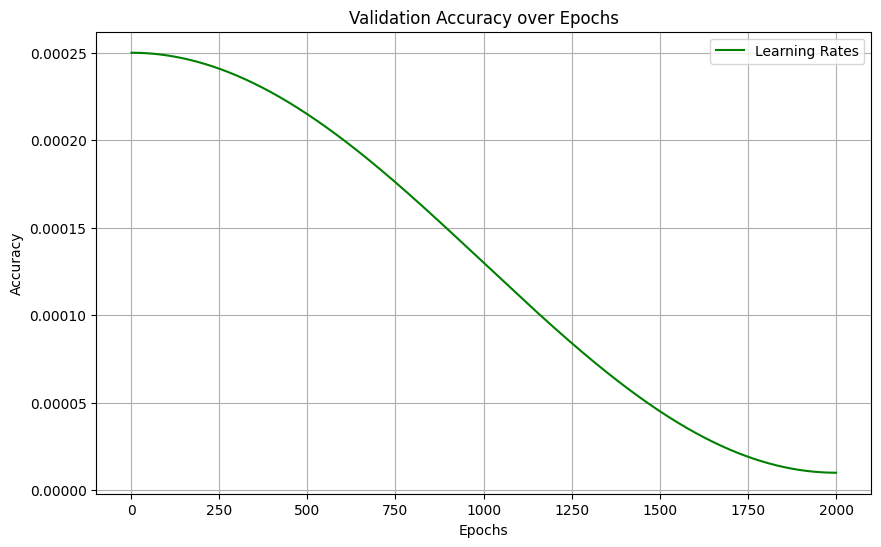

Model for bin 46 saved to GATModels-5A_exp5ME/Models/model_bin_46.pth
Attention weights for bin 46 saved to GATModels-5A_exp5ME/Weights/attn_bin_46.pt
Training on bin 47/50
Bin 47, Epoch 1/2000, Train Loss: 0.6840, Validation Loss: 0.7428,  ValAccuracy: 0.2175, LR: 0.000250
Bin 47, Epoch 501/2000, Train Loss: 0.3553, Validation Loss: 0.3755,  ValAccuracy: 0.8362, LR: 0.000215
Bin 47, Epoch 1001/2000, Train Loss: 0.3230, Validation Loss: 0.3094,  ValAccuracy: 0.8672, LR: 0.000130
Bin 47, Epoch 1501/2000, Train Loss: 0.3264, Validation Loss: 0.3562,  ValAccuracy: 0.8333, LR: 0.000045


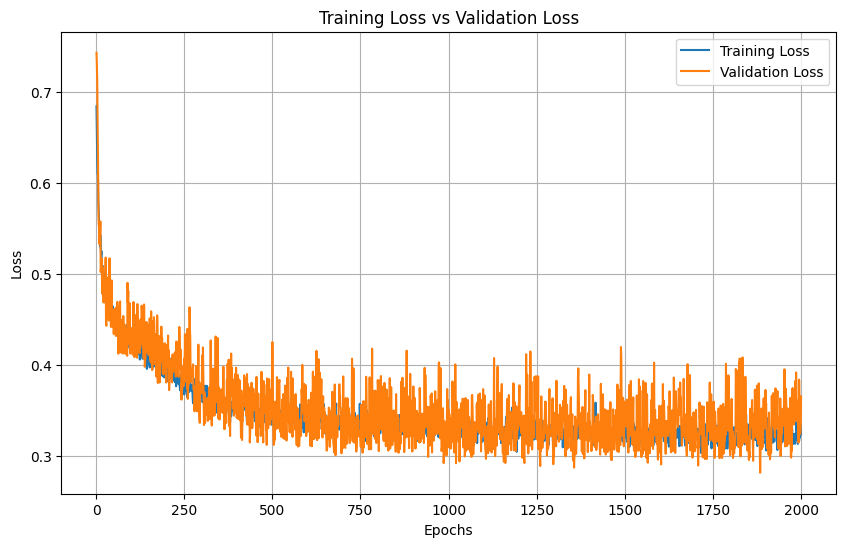

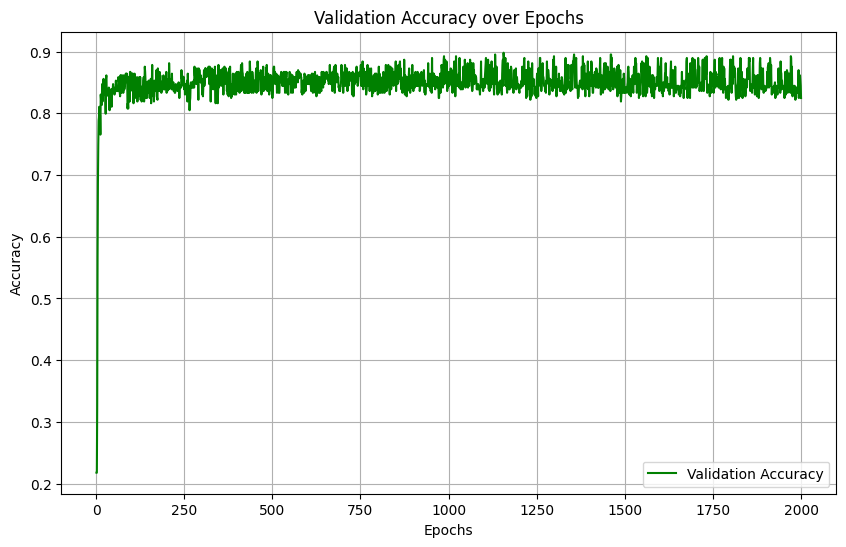

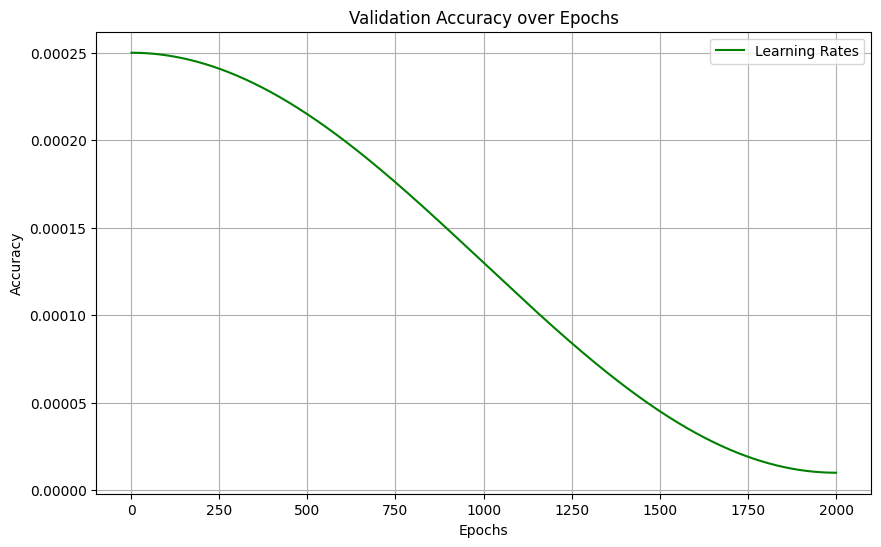

Model for bin 47 saved to GATModels-5A_exp5ME/Models/model_bin_47.pth
Attention weights for bin 47 saved to GATModels-5A_exp5ME/Weights/attn_bin_47.pt
Training on bin 48/50
Bin 48, Epoch 1/2000, Train Loss: 0.7145, Validation Loss: 0.7054,  ValAccuracy: 0.2175, LR: 0.000250
Bin 48, Epoch 501/2000, Train Loss: 0.3786, Validation Loss: 0.3147,  ValAccuracy: 0.8842, LR: 0.000215
Bin 48, Epoch 1001/2000, Train Loss: 0.3658, Validation Loss: 0.3471,  ValAccuracy: 0.8588, LR: 0.000130
Bin 48, Epoch 1501/2000, Train Loss: 0.3636, Validation Loss: 0.3243,  ValAccuracy: 0.8814, LR: 0.000045


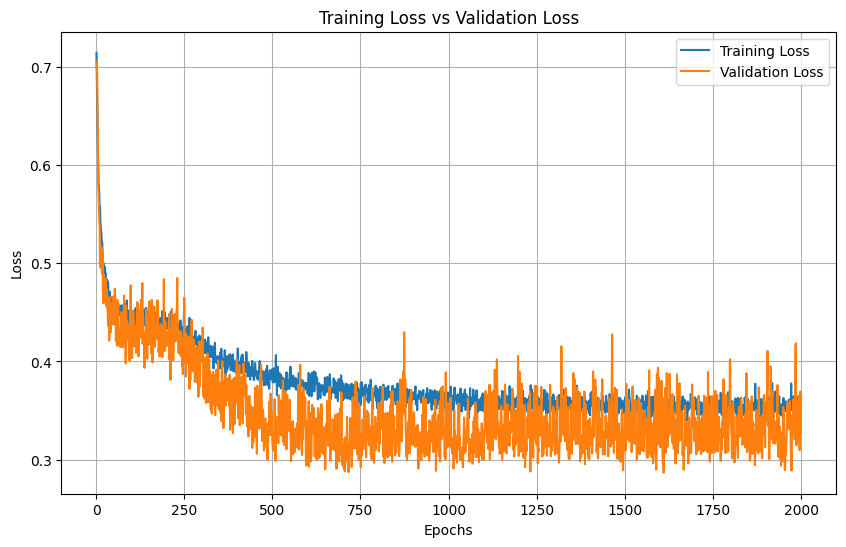

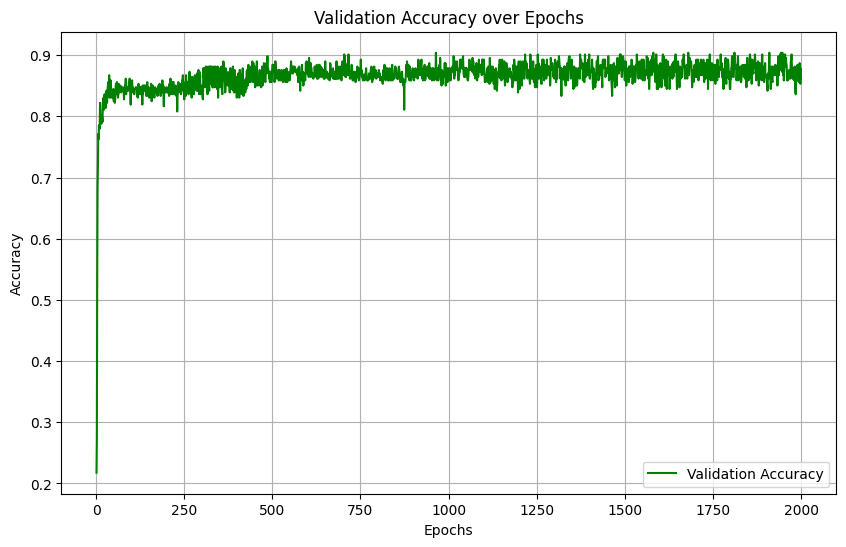

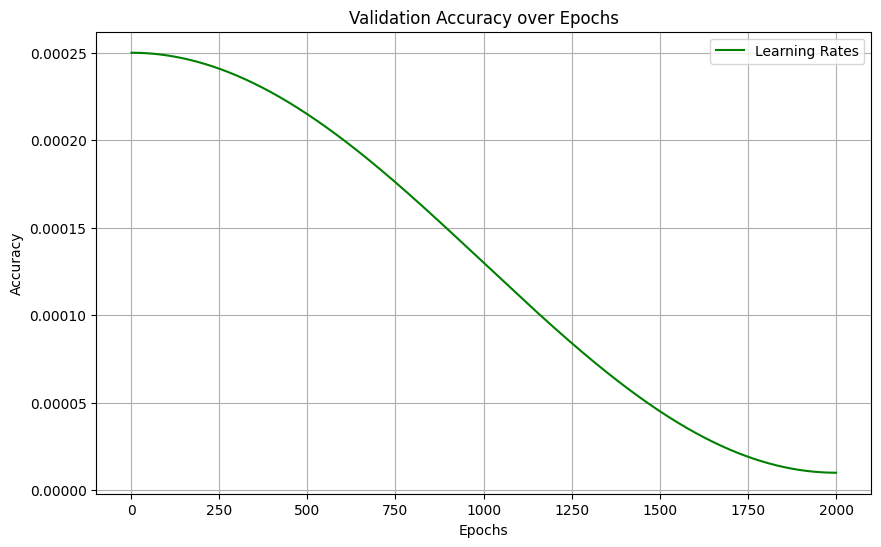

Model for bin 48 saved to GATModels-5A_exp5ME/Models/model_bin_48.pth
Attention weights for bin 48 saved to GATModels-5A_exp5ME/Weights/attn_bin_48.pt
Training on bin 49/50
Bin 49, Epoch 1/2000, Train Loss: 0.6026, Validation Loss: 0.6758,  ValAccuracy: 0.8107, LR: 0.000250
Bin 49, Epoch 501/2000, Train Loss: 0.3843, Validation Loss: 0.2746,  ValAccuracy: 0.8955, LR: 0.000215
Bin 49, Epoch 1001/2000, Train Loss: 0.3580, Validation Loss: 0.3023,  ValAccuracy: 0.8842, LR: 0.000130
Bin 49, Epoch 1501/2000, Train Loss: 0.3576, Validation Loss: 0.3193,  ValAccuracy: 0.8898, LR: 0.000045


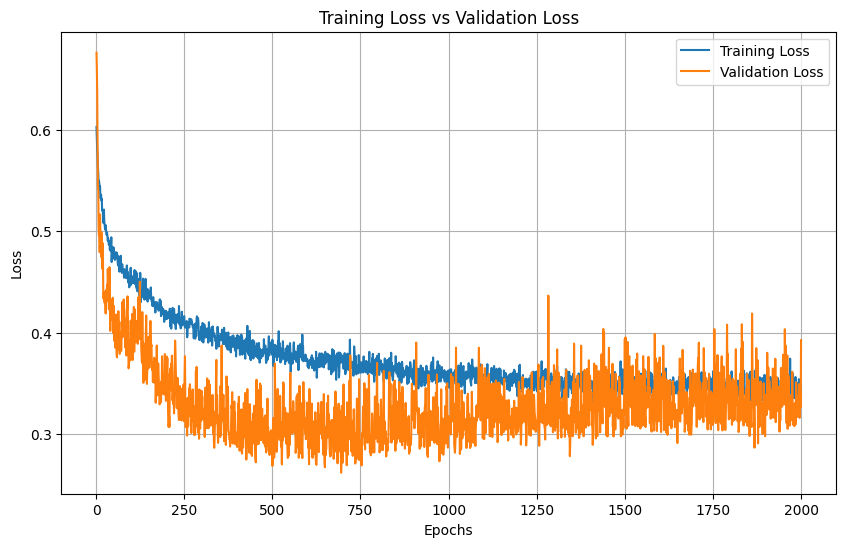

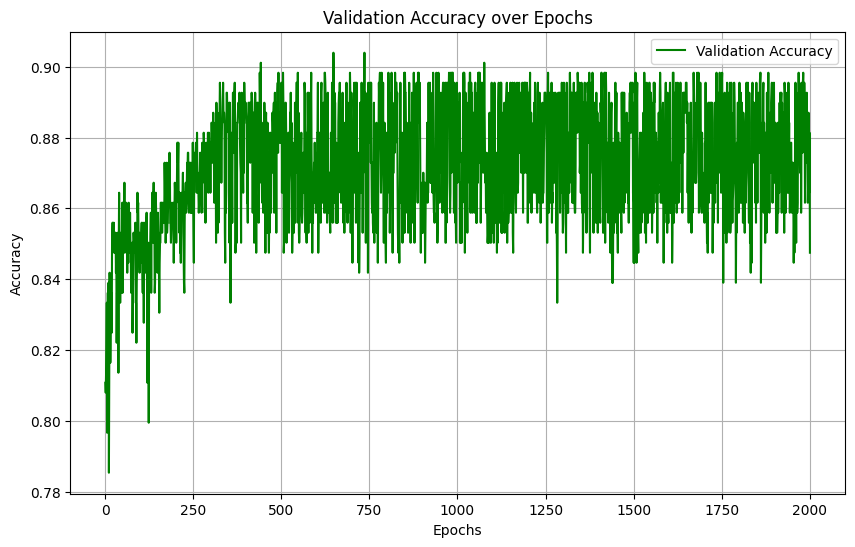

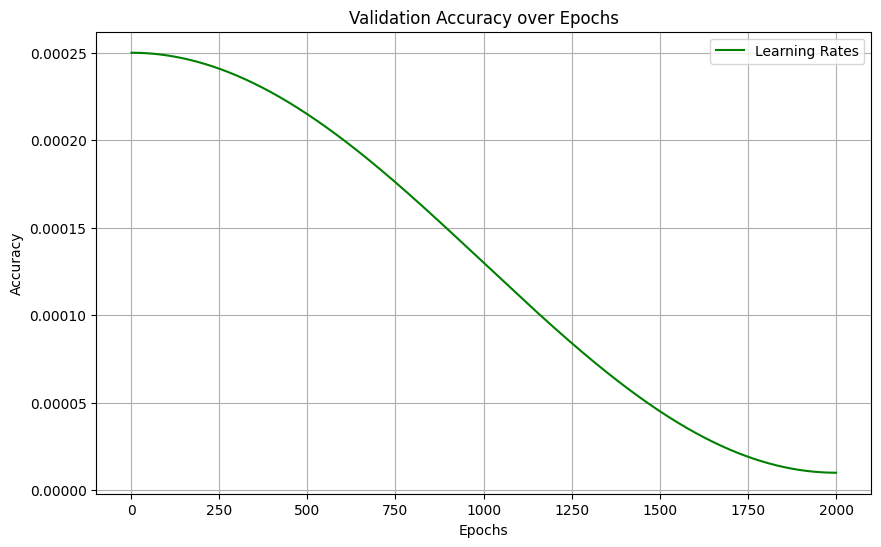

Model for bin 49 saved to GATModels-5A_exp5ME/Models/model_bin_49.pth
Attention weights for bin 49 saved to GATModels-5A_exp5ME/Weights/attn_bin_49.pt
Training on bin 50/50
Bin 50, Epoch 1/2000, Train Loss: 0.7347, Validation Loss: 0.6670,  ValAccuracy: 0.7825, LR: 0.000250
Bin 50, Epoch 501/2000, Train Loss: 0.3459, Validation Loss: 0.3085,  ValAccuracy: 0.8729, LR: 0.000215
Bin 50, Epoch 1001/2000, Train Loss: 0.3232, Validation Loss: 0.2945,  ValAccuracy: 0.8927, LR: 0.000130
Bin 50, Epoch 1501/2000, Train Loss: 0.3133, Validation Loss: 0.3264,  ValAccuracy: 0.8672, LR: 0.000045


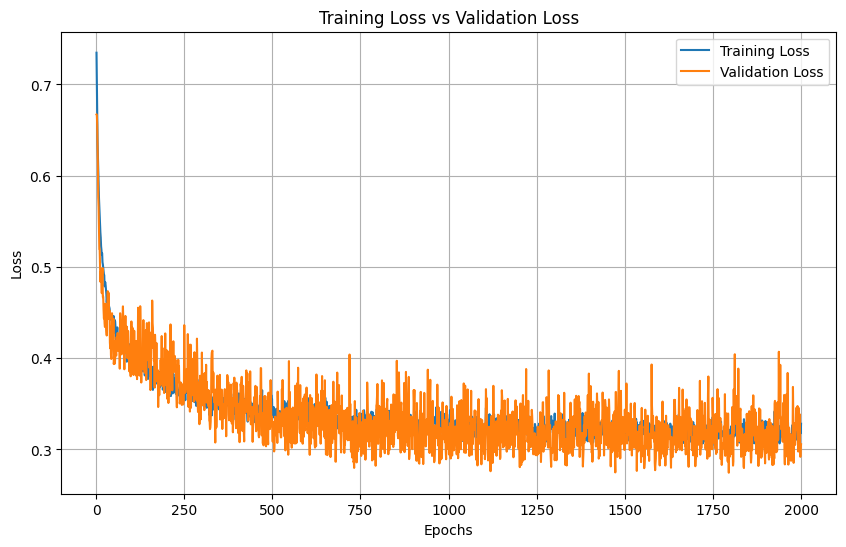

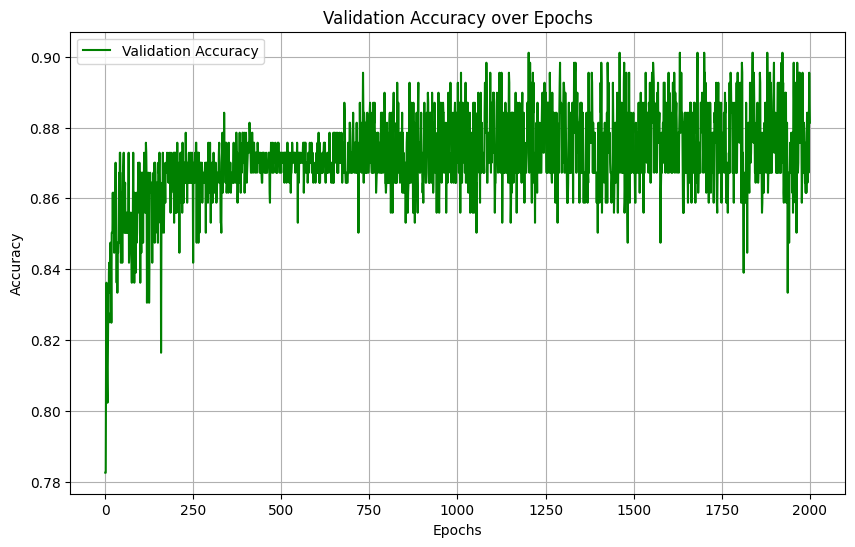

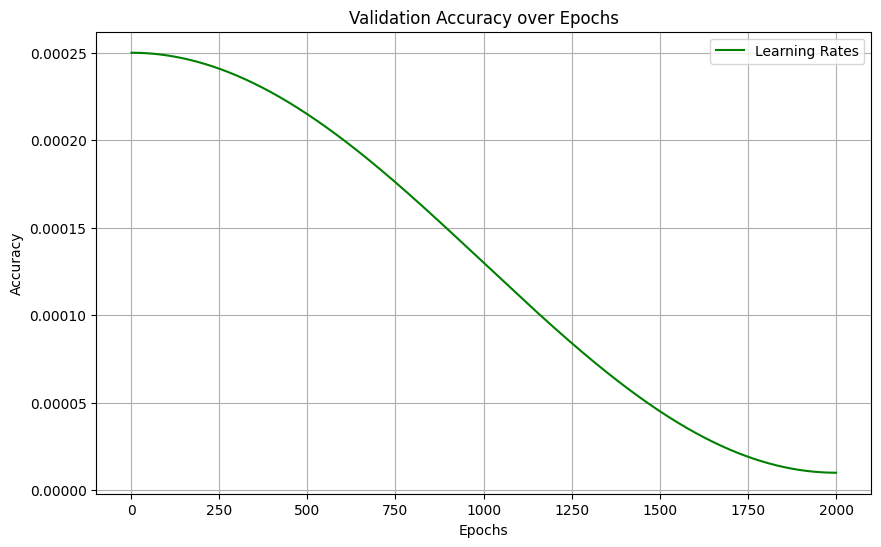

Model for bin 50 saved to GATModels-5A_exp5ME/Models/model_bin_50.pth
Attention weights for bin 50 saved to GATModels-5A_exp5ME/Weights/attn_bin_50.pt
Training on bin 51/50
Bin 51, Epoch 1/2000, Train Loss: 0.7021, Validation Loss: 0.6723,  ValAccuracy: 0.7881, LR: 0.000250
Bin 51, Epoch 501/2000, Train Loss: 0.3891, Validation Loss: 0.3590,  ValAccuracy: 0.8701, LR: 0.000215
Bin 51, Epoch 1001/2000, Train Loss: 0.3904, Validation Loss: 0.3804,  ValAccuracy: 0.8729, LR: 0.000130
Bin 51, Epoch 1501/2000, Train Loss: 0.3657, Validation Loss: 0.3759,  ValAccuracy: 0.8701, LR: 0.000045


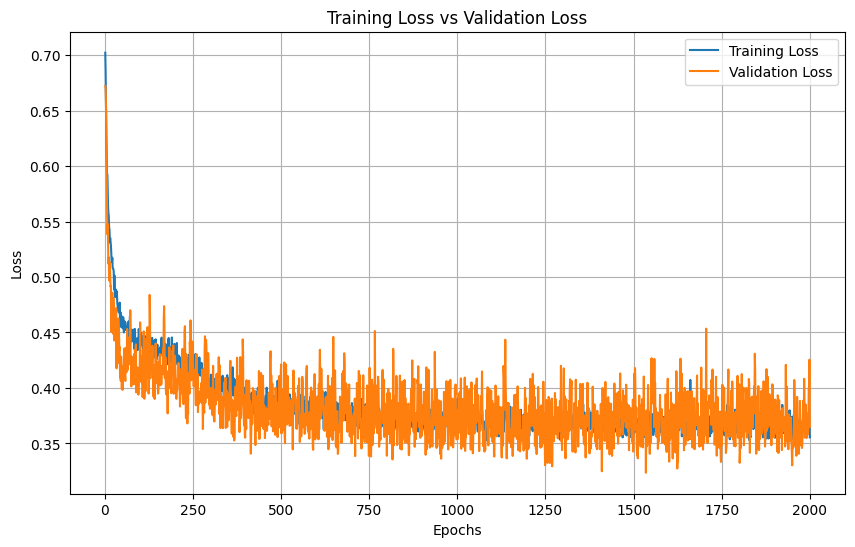

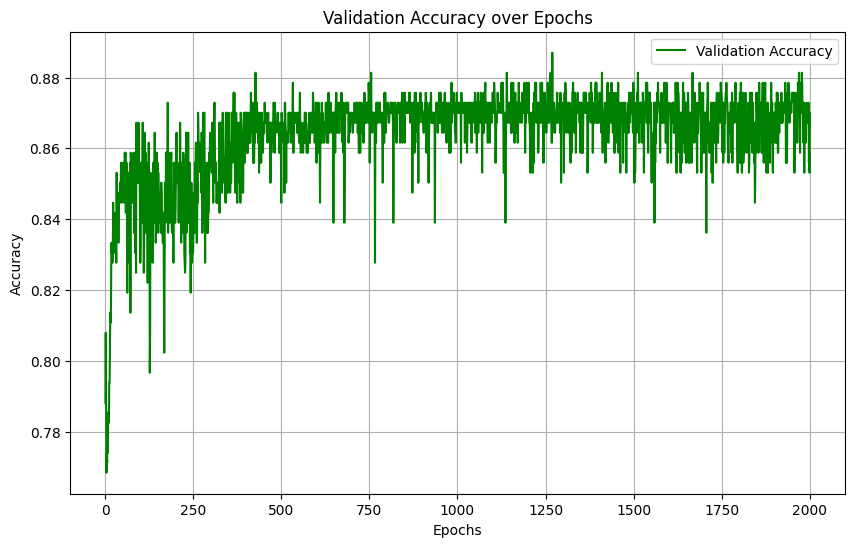

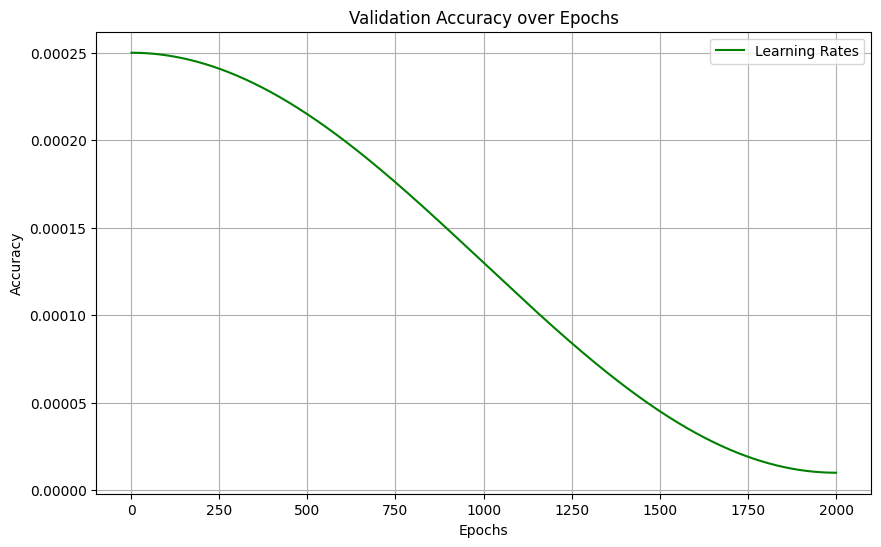

Model for bin 51 saved to GATModels-5A_exp5ME/Models/model_bin_51.pth
Attention weights for bin 51 saved to GATModels-5A_exp5ME/Weights/attn_bin_51.pt
Training on bin 52/50
Bin 52, Epoch 1/2000, Train Loss: 0.6321, Validation Loss: 0.7240,  ValAccuracy: 0.2175, LR: 0.000250
Bin 52, Epoch 501/2000, Train Loss: 0.4347, Validation Loss: 0.3859,  ValAccuracy: 0.8672, LR: 0.000215
Bin 52, Epoch 1001/2000, Train Loss: 0.4060, Validation Loss: 0.3917,  ValAccuracy: 0.8644, LR: 0.000130
Bin 52, Epoch 1501/2000, Train Loss: 0.4055, Validation Loss: 0.3982,  ValAccuracy: 0.8644, LR: 0.000045


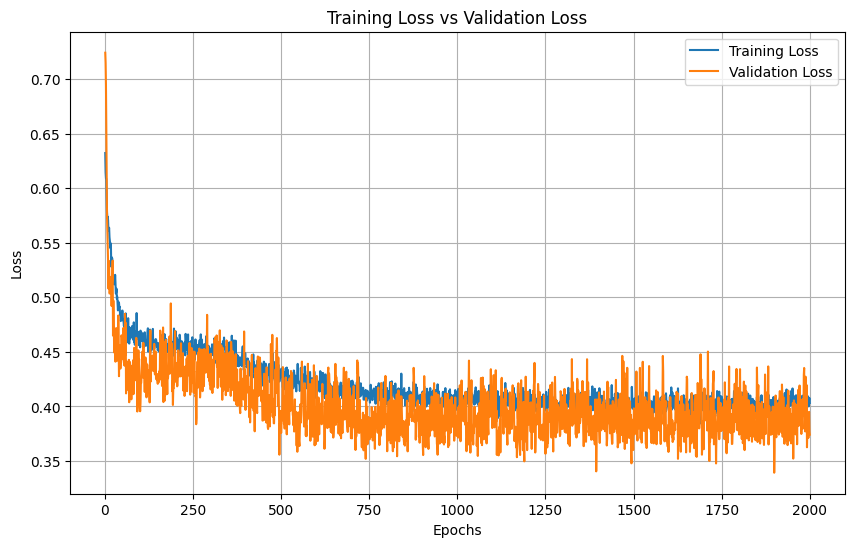

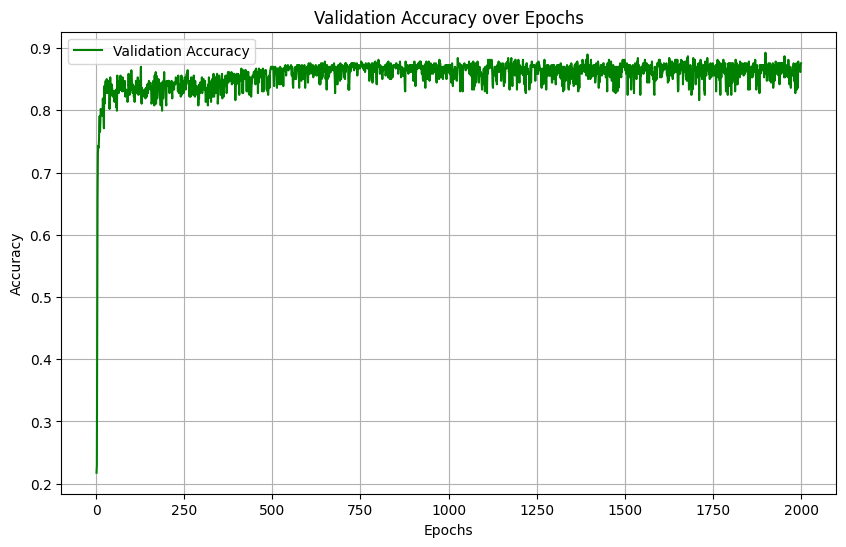

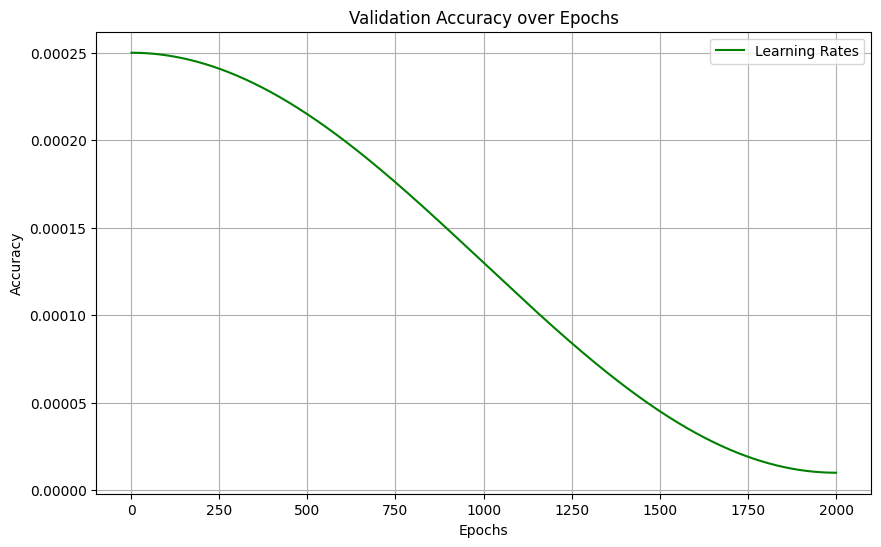

Model for bin 52 saved to GATModels-5A_exp5ME/Models/model_bin_52.pth
Attention weights for bin 52 saved to GATModels-5A_exp5ME/Weights/attn_bin_52.pt
Training on bin 53/50
Bin 53, Epoch 1/2000, Train Loss: 0.6813, Validation Loss: 0.6644,  ValAccuracy: 0.7825, LR: 0.000250
Bin 53, Epoch 501/2000, Train Loss: 0.4173, Validation Loss: 0.3602,  ValAccuracy: 0.8672, LR: 0.000215
Bin 53, Epoch 1001/2000, Train Loss: 0.3950, Validation Loss: 0.3672,  ValAccuracy: 0.8616, LR: 0.000130
Bin 53, Epoch 1501/2000, Train Loss: 0.4022, Validation Loss: 0.4005,  ValAccuracy: 0.8418, LR: 0.000045


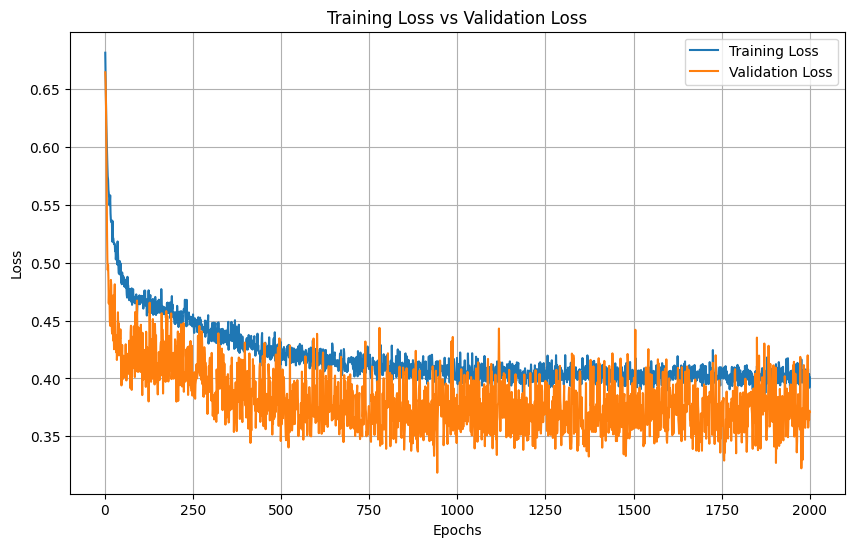

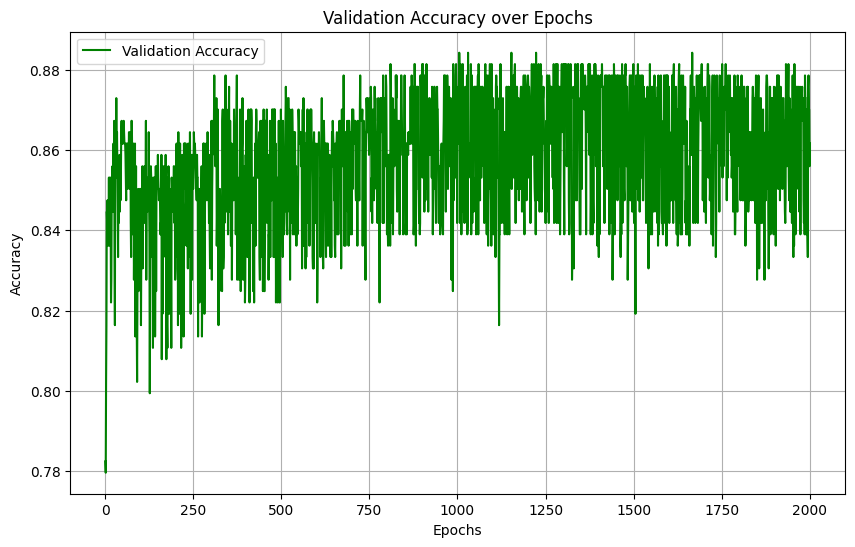

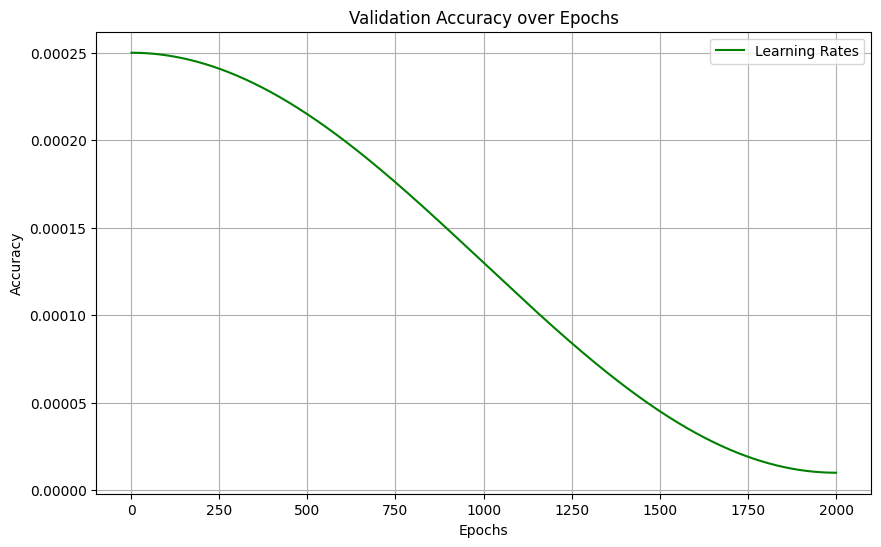

Model for bin 53 saved to GATModels-5A_exp5ME/Models/model_bin_53.pth
Attention weights for bin 53 saved to GATModels-5A_exp5ME/Weights/attn_bin_53.pt
Training on bin 54/50
Bin 54, Epoch 1/2000, Train Loss: 0.6175, Validation Loss: 0.6743,  ValAccuracy: 0.8277, LR: 0.000250
Bin 54, Epoch 501/2000, Train Loss: 0.3654, Validation Loss: 0.3569,  ValAccuracy: 0.8616, LR: 0.000215
Bin 54, Epoch 1001/2000, Train Loss: 0.3572, Validation Loss: 0.3817,  ValAccuracy: 0.8616, LR: 0.000130
Bin 54, Epoch 1501/2000, Train Loss: 0.3589, Validation Loss: 0.4128,  ValAccuracy: 0.8531, LR: 0.000045


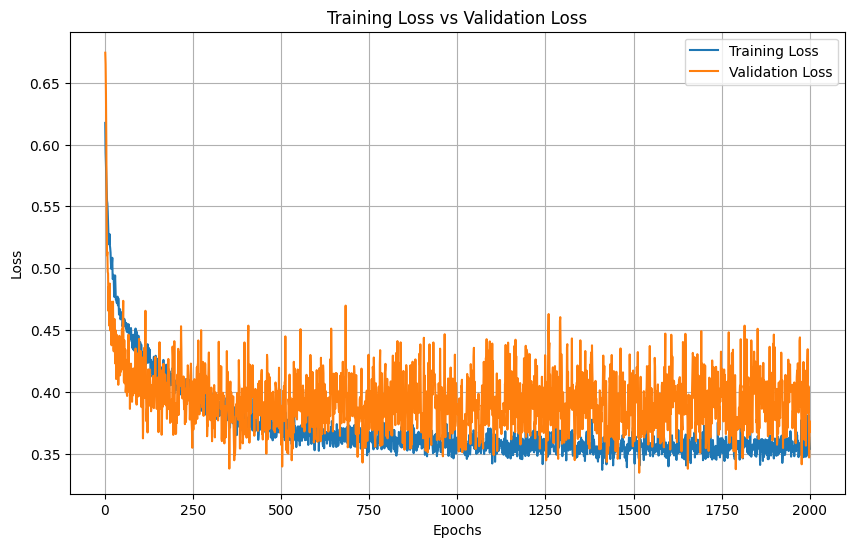

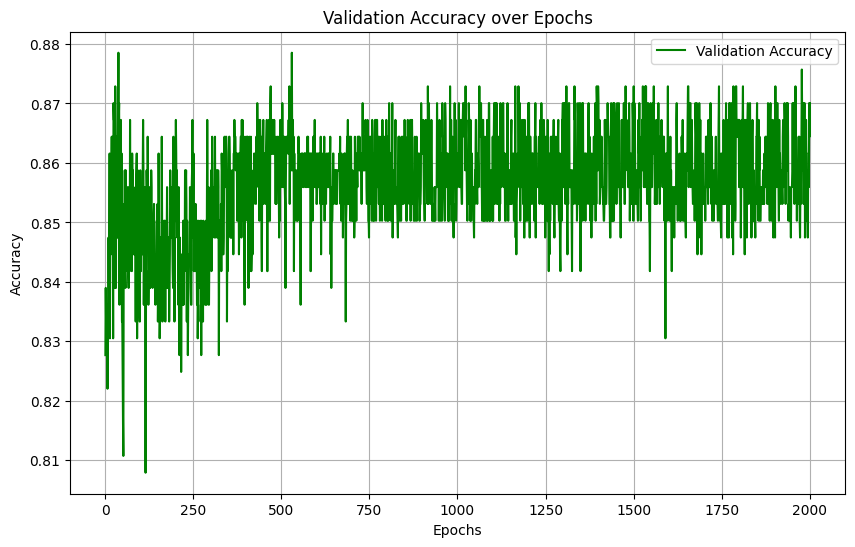

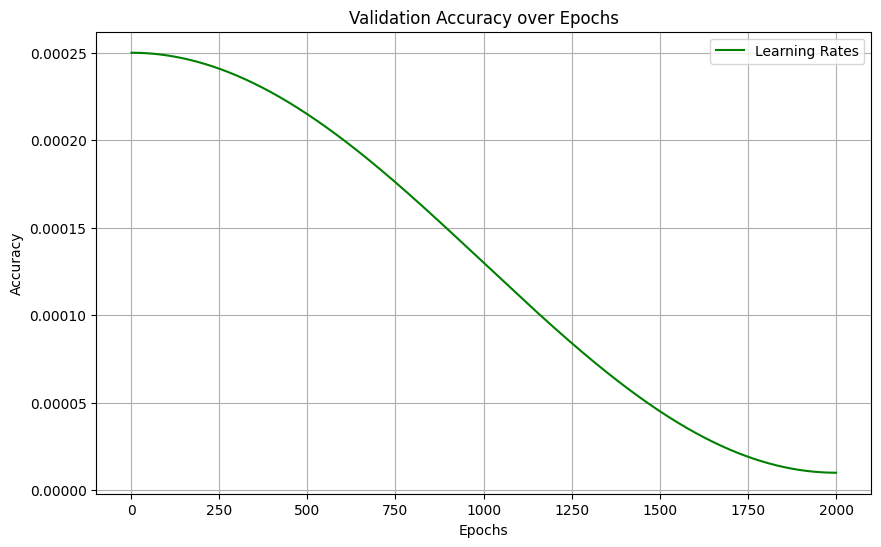

Model for bin 54 saved to GATModels-5A_exp5ME/Models/model_bin_54.pth
Attention weights for bin 54 saved to GATModels-5A_exp5ME/Weights/attn_bin_54.pt
Training on bin 55/50
Bin 55, Epoch 1/2000, Train Loss: 0.5784, Validation Loss: 0.6438,  ValAccuracy: 0.7797, LR: 0.000250
Bin 55, Epoch 501/2000, Train Loss: 0.4127, Validation Loss: 0.4146,  ValAccuracy: 0.8531, LR: 0.000215
Bin 55, Epoch 1001/2000, Train Loss: 0.4172, Validation Loss: 0.4717,  ValAccuracy: 0.8249, LR: 0.000130
Bin 55, Epoch 1501/2000, Train Loss: 0.4040, Validation Loss: 0.4386,  ValAccuracy: 0.8475, LR: 0.000045


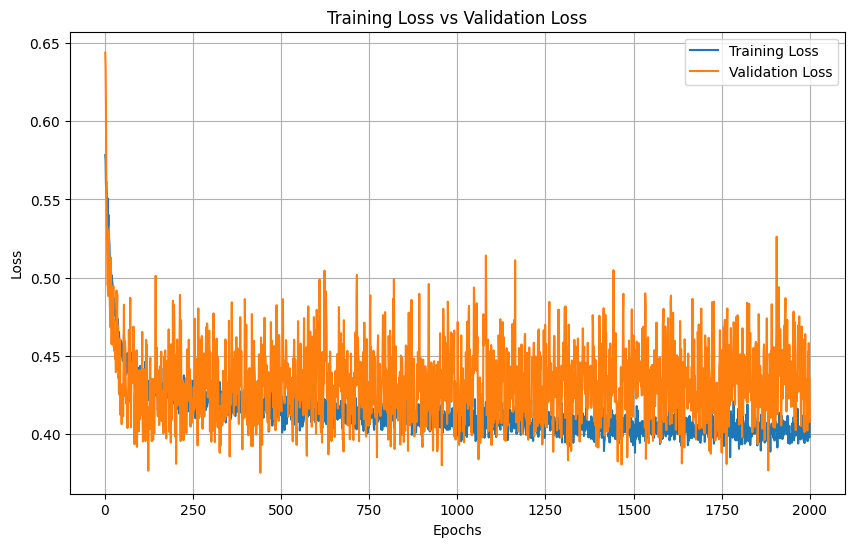

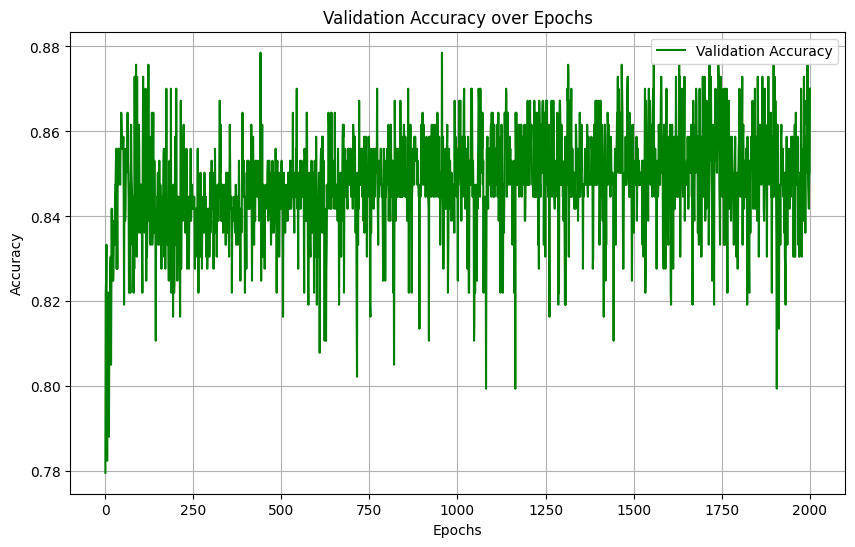

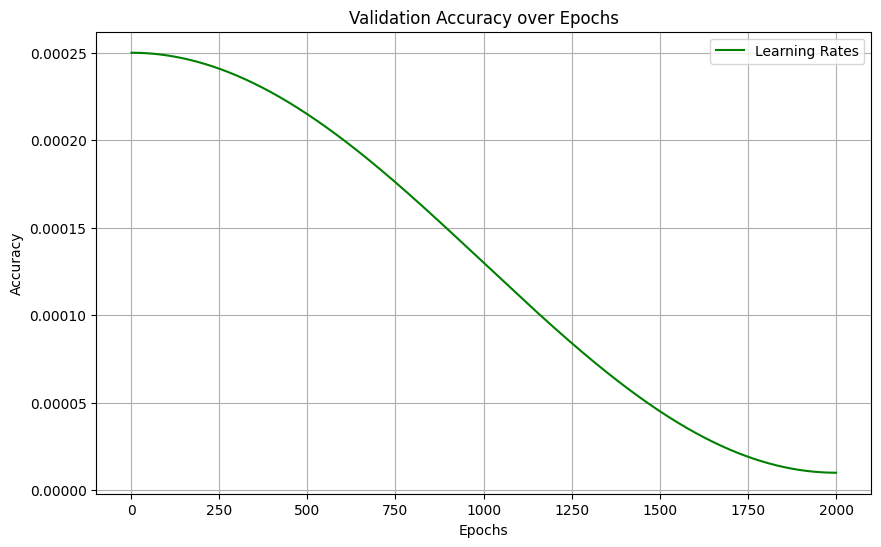

Model for bin 55 saved to GATModels-5A_exp5ME/Models/model_bin_55.pth
Attention weights for bin 55 saved to GATModels-5A_exp5ME/Weights/attn_bin_55.pt
Training on bin 56/50
Bin 56, Epoch 1/2000, Train Loss: 0.6721, Validation Loss: 0.7137,  ValAccuracy: 0.2203, LR: 0.000250
Bin 56, Epoch 501/2000, Train Loss: 0.3574, Validation Loss: 0.3950,  ValAccuracy: 0.8701, LR: 0.000215
Bin 56, Epoch 1001/2000, Train Loss: 0.3562, Validation Loss: 0.4674,  ValAccuracy: 0.8644, LR: 0.000130
Bin 56, Epoch 1501/2000, Train Loss: 0.3538, Validation Loss: 0.4240,  ValAccuracy: 0.8785, LR: 0.000045


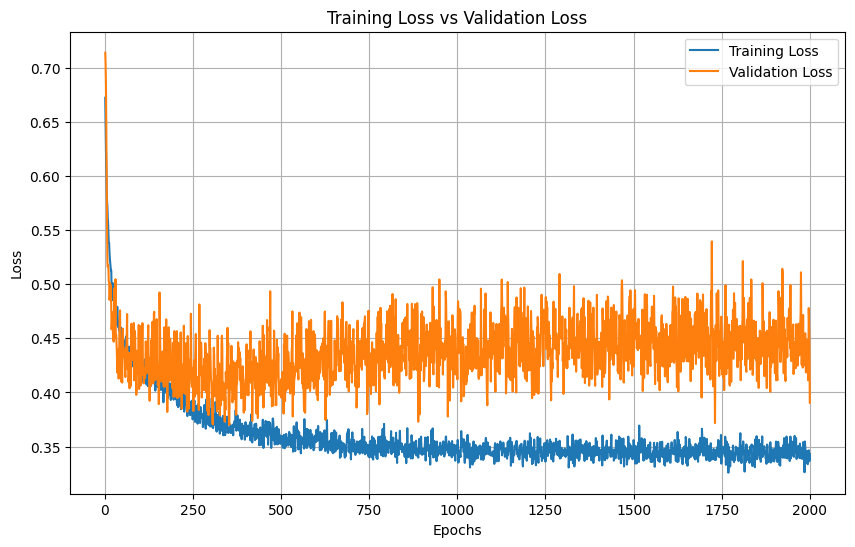

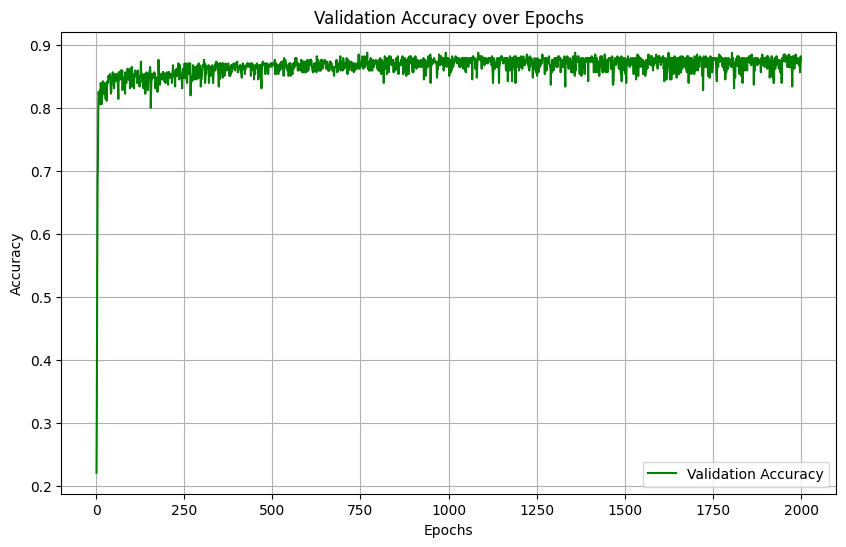

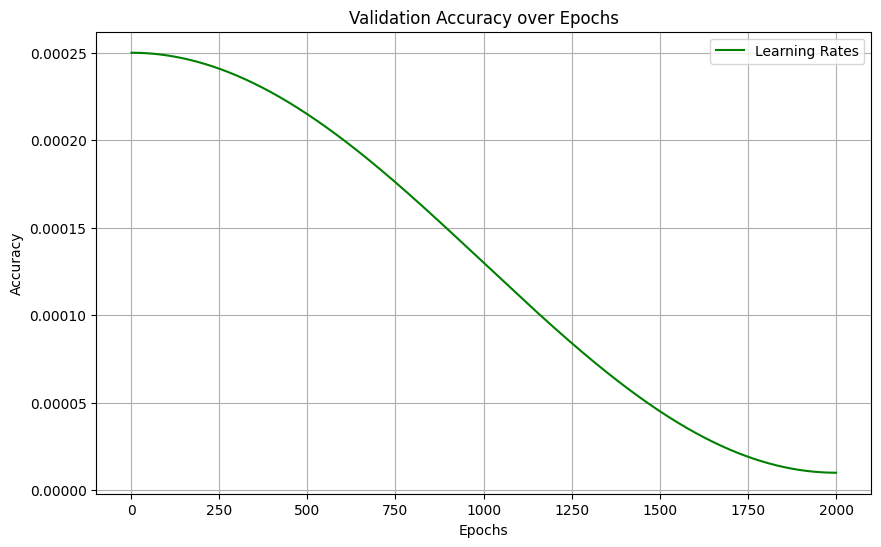

Model for bin 56 saved to GATModels-5A_exp5ME/Models/model_bin_56.pth
Attention weights for bin 56 saved to GATModels-5A_exp5ME/Weights/attn_bin_56.pt
Training on bin 57/50
Bin 57, Epoch 1/2000, Train Loss: 0.7141, Validation Loss: 0.7379,  ValAccuracy: 0.2175, LR: 0.000250
Bin 57, Epoch 501/2000, Train Loss: 0.4396, Validation Loss: 0.3914,  ValAccuracy: 0.8729, LR: 0.000215
Bin 57, Epoch 1001/2000, Train Loss: 0.4258, Validation Loss: 0.3836,  ValAccuracy: 0.8672, LR: 0.000130
Bin 57, Epoch 1501/2000, Train Loss: 0.4226, Validation Loss: 0.3983,  ValAccuracy: 0.8644, LR: 0.000045


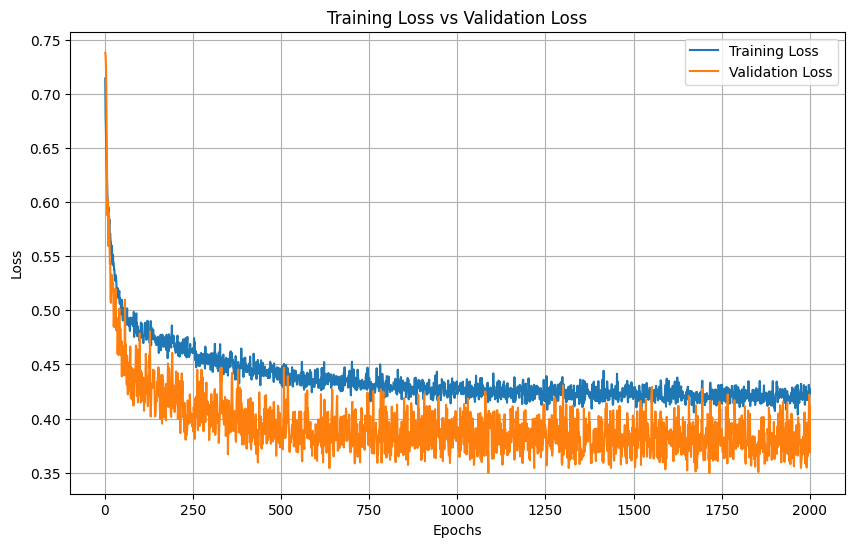

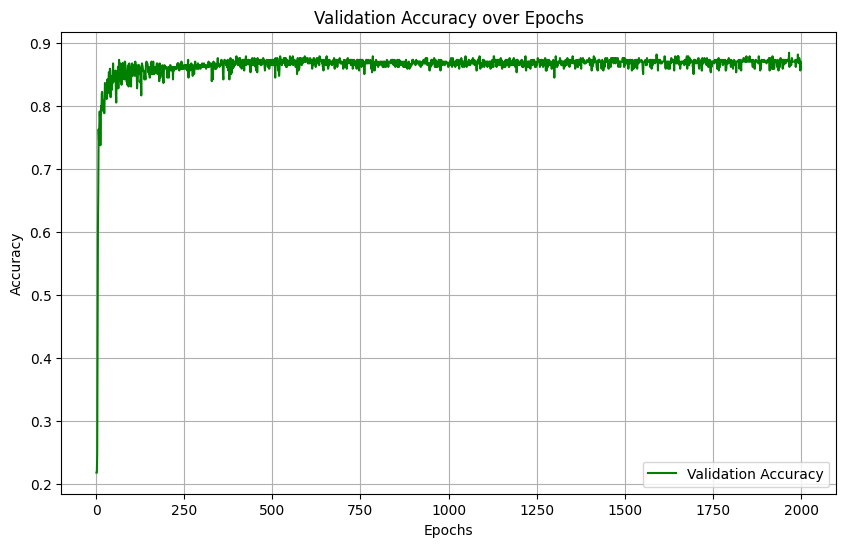

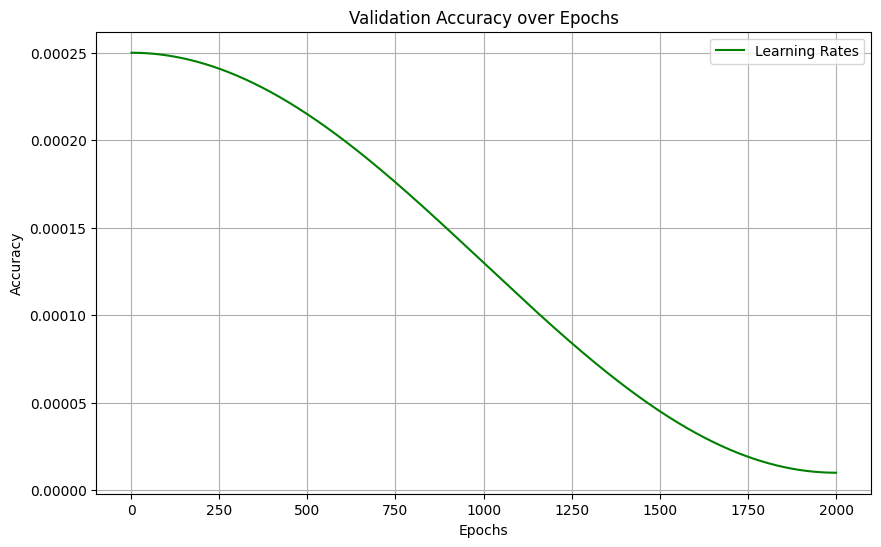

Model for bin 57 saved to GATModels-5A_exp5ME/Models/model_bin_57.pth
Attention weights for bin 57 saved to GATModels-5A_exp5ME/Weights/attn_bin_57.pt


In [15]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Define paths for saving models
save_dir = "GATModels-5A_exp5ME"
os.makedirs(f"{save_dir}/Models", exist_ok=True)
os.makedirs(f"{save_dir}/Weights", exist_ok=True)

epochs = 2000
batch_size = 64

val_loader = DataLoader(validation_graphs, batch_size=batch_size, shuffle=False)

for i, bin in enumerate(bins, start=7):
    model = GAT(in_channels=37, out_channels=32).to(device)
    criterion = nn.BCEWithLogitsLoss()  
    optimizer = optim.Adam(model.parameters(), lr=0.00025, weight_decay=1e-4)
    #scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=10, threshold=1e-4)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs, eta_min=1e-5)

    train_loader = DataLoader(bin, batch_size=batch_size, shuffle=True)    

    print(f"Training on bin {i+1}/{len(bins)}")

    train_losses = []
    learning_rates = []
    validation_losses = []
    validation_accuracies = []

    for epoch in range(epochs):
        epoch_loss, accuracy = train_model(model, train_loader, criterion, optimizer, device)
        validation_loss, validation_accuracy, attention_data = validate_model(model, val_loader, criterion, device)
        scheduler.step()
        
        current_lr = optimizer.param_groups[0]['lr'] 
        train_losses.append(epoch_loss)
        learning_rates.append(current_lr)
        validation_losses.append(validation_loss)
        validation_accuracies.append(validation_accuracy)   
        if epoch % 500 == 0:
            print(
                f"Bin {i+1}, Epoch {epoch+1}/{epochs}, "
                f"Train Loss: {epoch_loss:.4f}, Validation Loss: {validation_loss:.4f},  "
                f"ValAccuracy: {validation_accuracy:.4f}, "
                f"LR: {current_lr:.6f}"
            )
                
    plot_graphs(train_losses, validation_losses, validation_accuracies, learning_rates)

    #Save the trained model
    model_path = os.path.join(save_dir, f"Models/model_bin_{i+1}.pth")
    torch.save(model.state_dict(), model_path)
    print(f"Model for bin {i+1} saved to {model_path}")

    # Save attention weights
    attn_path = os.path.join(save_dir, f"Weights/attn_bin_{i+1}.pt")
    torch.save(attention_data, attn_path)
    print(f"Attention weights for bin {i+1} saved to {attn_path}")
